In [1]:
from multiprocessing import Pool
import os
os.environ['OMP_NUM_THREADS'] = "1"

import numpy as np

import astropy.units as u  
import astropy.constants as c
from astropy.coordinates import SkyCoord

import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
import matplotlib 

from astropy.io import fits
from astropy.table import Table, join
from scipy.interpolate import interp1d
from scipy.optimize import curve_fit

from dustmaps.bayestar import BayestarQuery
from dustmaps.vergely2022 import Vergely2022Query
from dustmaps.edenhofer2023 import Edenhofer2023Query

import pickle 
import sys
import os
import tqdm

import emcee
import corner

import h5py
data_dir = '/uufs/chpc.utah.edu/common/home/astro/zasowski/mcbride/'

/uufs/astro.utah.edu/common/home/u1371365/.local/lib/python3.10/site-packages/matplotlib/projections/__init__.py:63: UserWarning: Unable to import Axes3D. This may be due to multiple versions of Matplotlib being installed (e.g. as a system package and as a pip package). As a result, the 3D projection is not available.
  warnings.warn("Unable to import Axes3D. This may be due to multiple versions of "


In [ ]:
'hi'

'hi'

In [ ]:
import globalvars
dust_data = globalvars.DustData()

In [ ]:
from sightline import Sightline
from specfns import get_wavs, resample_interp, dopplershift, lambda0, sigma0
from filehandling import get_ca_res, get_madgics_res
from spacefns_v2 import select_stars, find_nearest, find_radius, differentialAmplitude
from MCMCfns import logprob_2
import time

# import globalvars
# dust_data = globalvars.DustData()
# with h5py.File(map_fname, 'r') as f:
#     edenhofer = np.array(f['data'])
#     dust_data.intake_map(edenhofer)

In [ ]:
map_fname = '/uufs/astro.utah.edu/common/home/u1371365/DIB_KT_CACloud/edenhofer_out.h5'

with h5py.File(map_fname, 'r') as f:
    edenhofer = np.array(f['data'])
    dust_data.intake_map(edenhofer)

/tmp/ipykernel_3157827/2315330892.py:4: DeprecationWarning: `product` is deprecated as of NumPy 1.25.0, and will be removed in NumPy 2.0. Please use `prod` instead.
  edenhofer = np.array(f['data'])


In [ ]:
CA_meta = Table(fits.open('../Data/230420_CAResiduals/CA_meta.fits')[1].data)
CAresdir = '/uufs/astro.utah.edu/common/home/u1371365/Data/230420_CAResiduals/'
CAMADGICSresdir = '/uufs/astro.utah.edu/common/home/u1371365/Data/230829_MADGICSResiduals/'
starhorsepath = '/uufs/chpc.utah.edu/common/home/sdss/dr17/env/APOGEE_STARHORSE/APOGEE_DR17_EDR3_STARHORSE_v2.fits'
starhorse = Table.read(starhorsepath, hdu = 1)
starhorse = starhorse['APOGEE_ID', 'dist16', 'dist50', 'dist84', 'AV16', 'AV50', 'AV84']

CA_meta = join(CA_meta, starhorse, keys = 'APOGEE_ID', join_type = 'left')

CA_meta_full = CA_meta.copy()

with open('/uufs/astro.utah.edu/common/home/u1371365/DIB_KT_CACloud/goodbad.pickle', mode = 'rb') as f:
    goodbad = pickle.load(f)

# added 02.01
data_criteria = (((CA_meta['SNR'] > 80) & (CA_meta['TEFF'] > 5000)) | (CA_meta['SNR'] > 150)) & (CA_meta['ASPCAP_CHI2_1'] > 1) & (CA_meta['ASPCAP_CHI2_1'] < 5)
print(np.sum(data_criteria))
CA_meta= CA_meta[data_criteria]

1010


In [ ]:
wavs = get_wavs()
window = (wavs > lambda0 -10) & (wavs < lambda0 + 10)
wavs_window = wavs[window]

In [ ]:
ds = 2.5 # x downsampled
rad = 0.23
sample_dim_l = np.linspace(159, 167, int(8 / (ds * rad)))
sample_dim_b = np.linspace(-12.5 , -4.5, int(8 / (ds * rad)))
sample_grid_l, sample_grid_b = np.meshgrid(sample_dim_l, sample_dim_b)
grid_map_inds = np.array([find_nearest(sample_grid_l.flatten()[i], sample_grid_b.flatten()[i]) for i in range(len(sample_grid_l.flatten()))]).T
grid_map = np.nansum(np.copy(edenhofer[grid_map_inds[1], grid_map_inds[0], :]).reshape(*sample_grid_l.shape, -1), axis = 2)
grid_Nstar = np.array([np.nansum((np.abs((sample_grid_l.flatten()[i] - CA_meta['GLON'])) <= rad) & 
            (np.abs((sample_grid_b.flatten()[i] - CA_meta['GLAT'])) <= rad)) for i in range(len(sample_grid_l.flatten()))]).reshape(*sample_grid_l.shape)

filament_l = (159, 169)
filament_b = (-10, -6)

N_min = 5
radius_min = np.zeros(sample_grid_l.shape)
mgrid = np.mgrid[0:len(sample_dim_l), 0:len(sample_dim_b)]
for i in mgrid[0].flatten():
    for j in mgrid[1].flatten():
        radius_min[i, j] = find_radius(sample_grid_l[i, j], sample_grid_b[i, j], N_min, CA_meta)
        radius_min[i, j] = np.max([radius_min[i, j], 0.23])

radius_max = 0.4
print(np.nansum(radius_min < radius_max))


crit_filament = ((sample_grid_l > filament_l[0]) & (sample_grid_l < filament_l[1]) & 
                 (sample_grid_b > filament_b[0]) & (sample_grid_b < filament_b[1]) &
                 (grid_map > 2.2) & (radius_min < 0.5)) #(grid_Nstar > 5) & (grid_Nstar <= 10))

crit_background =  (((sample_grid_l <= filament_l[0]) | (sample_grid_l >= filament_l[1]) |
                 (sample_grid_b <= filament_b[0]) | (sample_grid_b >= filament_b[1])) &
                 (grid_map <= 1.5) & (radius_min < radius_max)) #(grid_Nstar > 5) & (grid_Nstar <= 10))

# crit_coverage = (np.sum() => 1 & )

N_filament = np.sum(crit_filament)
N_background = np.sum(crit_background)
print(np.sum(crit_filament))
print(np.sum(crit_background))

91
23
28


In [ ]:
0.23 * 2  * 60

27.6

In [ ]:
l_fil, b_fil, AV_fil = (sample_grid_l[crit_filament].flatten(), sample_grid_b[crit_filament].flatten(),
                        grid_map[crit_filament].flatten())
l_off, b_off, AV_off = (sample_grid_l[crit_background].flatten(), sample_grid_b[crit_background].flatten(),
                        grid_map[crit_background].flatten())

l_sample, b_sample, AV_sample = (np.concatenate([l_fil, l_off]), np.concatenate([b_fil, b_off]),
                                  np.concatenate([AV_fil, AV_off]))

In [ ]:
tabfile = '/uufs/chpc.utah.edu/common/home/sdss/dr17/apogee/spectro/aspcap/dr17/synspec_rev1/allStar-dr17-synspec_rev1.fits'
allStar = Table.read(tabfile, hdu = 1)
print(len(allStar))
starFlag = allStar['ASPCAPFLAG']
starMask = np.invert((np.logical_and(starFlag, 2**23)==True))
allStar = allStar[starMask]
print(len(allStar))
highLat = allStar[(np.abs(allStar['GLAT']) > 15) & (1000/allStar['GAIAEDR3_PARALLAX'] < 1.5e3) & (allStar['SFD_EBV'] < 0.2)]

data_criteria_hl= (((highLat['SNR'] > 80) & (highLat['TEFF'] > 5000)) | (highLat['SNR'] > 150)) & (highLat['ASPCAP_CHI2'] > 1) & (highLat['ASPCAP_CHI2'] < 5)
print(sum(data_criteria_hl))

print(len(highLat))
highLat = highLat[data_criteria_hl]

733901
348087
45661
74255


In [ ]:
133 & 2**23

0

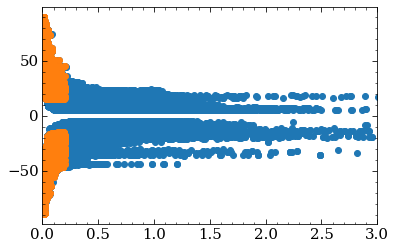

In [ ]:
fig, ax = plt.subplots()
ax.scatter(allStar['SFD_EBV'], allStar['GLAT'])
ax.set_xlim(0, 3)
ax.scatter(highLat['SFD_EBV'], highLat['GLAT'])


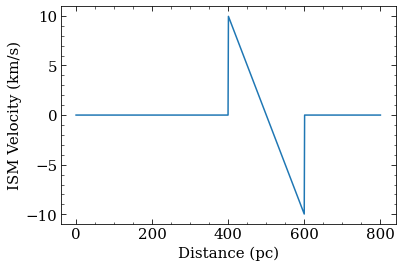

Text(0, 0.5, 'dA(V)/dd')

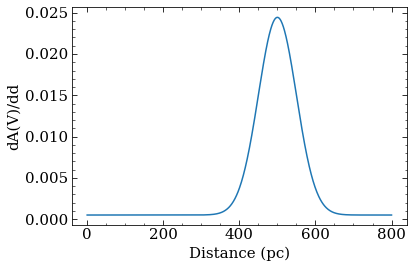

In [ ]:
fig, ax = plt.subplots()
cloudmin, cloudmax = (400, 600)
nearvelo, farvelo = (+10, -10)
rvelo = (farvelo - nearvelo) / (cloudmax - cloudmin) * (dust_data.distance - cloudmin) - farvelo
rvelo[(dust_data.distance < cloudmin) | (dust_data.distance > cloudmax)] = 0
ax.plot(dust_data.distance, rvelo)
ax.set_xlabel('Distance (pc)')
ax.set_ylabel('ISM Velocity (km/s)')
plt.show()

cloudcen = 0.5 * (cloudmin + cloudmax)
d0 = 400            # Cloud center
w0 = 50             # Cloud width (stdev)
Av_max = 3          # Maximum extinction

def differentialAV(d, d0 = cloudcen, w0 = w0, Av_Max = Av_max):
    A = Av_max / (np.sqrt(2 * np.pi) * w0) 
    return A * np.exp(-(d - d0)**2 / (2 * w0**2))

diff_AV = differentialAV(dust_data.distance) + 0.0005

fig, ax = plt.subplots()
ax.plot(dust_data.distance, diff_AV)
ax.set_xlabel('Distance (pc)')
ax.set_ylabel('dA(V)/dd')

In [ ]:
np.nansum(diff_AV[dust_data.distance < cloudmin])

0.2681596770589955

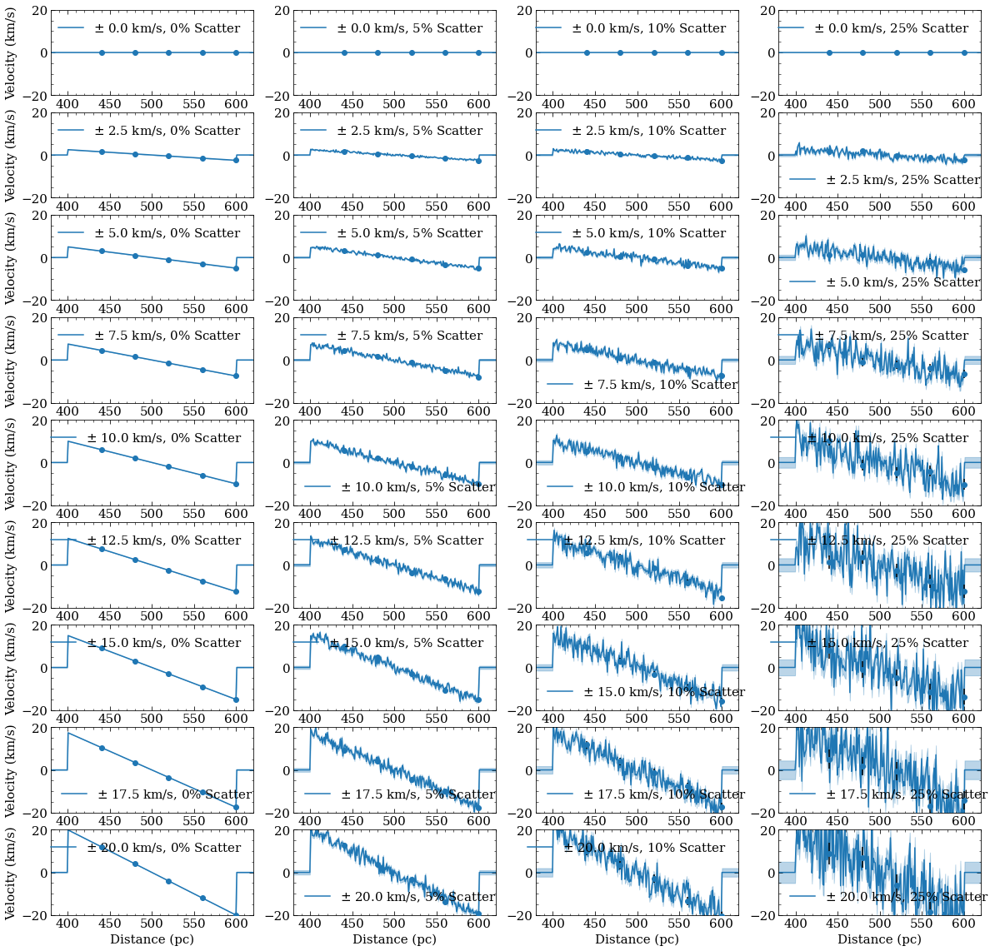

In [ ]:
velocity_range = [5, 10, 30]# 
velocity_range = [5, 10, 20, 30]
velocity_range = np.arange(0, 22.5, 2.5)
# scale_range = [0, 10, 25]# 
scale_range = [0, 5, 10, 25]
fig, axs = plt.subplots(nrows = len(velocity_range), ncols = len(scale_range), figsize = (20, 20))
def velo_profile(half_v_range, scale = 0):
    cloudmin, cloudmax = (400, 600)
    nearvelo, farvelo = (+half_v_range, -half_v_range)
    rvelo = (farvelo - nearvelo) / (cloudmax - cloudmin) * (dust_data.distance - cloudmin) - farvelo
    rvelo = rvelo + np.random.normal(0, 2 * scale/100 * half_v_range, len(rvelo))
    rvelo[(dust_data.distance < cloudmin) | (dust_data.distance > cloudmax)] = 0
    star_locs = np.linspace(440, 600, 5)
    star_loc_rvelo = (farvelo - nearvelo) / (cloudmax - cloudmin) * (star_locs - cloudmin) - farvelo
    star_loc_rvelo_scattered = star_loc_rvelo + np.random.normal(0, scale/100 * half_v_range, len(star_locs))
    
    return rvelo, star_loc_rvelo_scattered, star_locs


for i in range(len(velocity_range)):
    for j in range(len(scale_range)):
        ax = axs[i, j]
        rvelo, star_loc_rvelo_scattered, star_locs = velo_profile(velocity_range[i], scale_range[j])
        ax.plot(dust_data.distance, rvelo, label = f'$\pm$ {velocity_range[i]} km/s, {scale_range[j]}% Scatter')
        ax.scatter(star_locs, star_loc_rvelo_scattered, zorder = 3)
        ax.fill_between(dust_data.distance, rvelo + scale_range[j]/100 * velocity_range[i],rvelo - scale_range[j]/100 * velocity_range[i], alpha = 0.3, color = 'C0')
        ax.errorbar(star_locs, star_loc_rvelo_scattered, yerr = scale_range[j]/100 * velocity_range[i], fmt = '.', zorder = 2, color = 'k')
        ax.legend()
        if i == len(velocity_range) - 1:
            ax.set_xlabel('Distance (pc)')
        if j == 0:
            ax.set_ylabel('Velocity (km/s)')
        ax.set_xlim(380, 620)
        ax.set_ylim(-np.max(velocity_range), np.max(velocity_range))
fig.set_facecolor('white')
plt.show()

In [ ]:
60 /200


0.3

In [ ]:
dibfn = lambda x, mu, sigma, a: 1-a * np.exp(-0.5 * (x - mu)**2 / sigma**2)
def sigma_clip_mask(y, x = wavs, k = 2.5):
    y_over_gauss = None

    try:
        gaussfit = curve_fit(dibfn, x[window], y[window].filled(np.nan), p0 = (15272, 1.2, 0.05), bounds = ([15269, 0.5, 0], [15275, 2, 0.15]), check_finite = False, nan_policy = 'omit')

    except:
        # gaussfit = ((15272, 1.2, 0.05),())
        print('fail')
        return None, None
    #     y_over_gauss = None
    #     gaussfit = ((15272, 1.2, 0.05),())
    #     # fit = dibfn(x, 15272.42, 1.2, 0.05)
    #     # y_over_gauss = y / fit
    #     print('POOR GAUSS FIT IN SIGMA CLIP')
    y_over_gauss = y / dibfn(x, *gaussfit[0])

    med = np.nanmedian(y_over_gauss[window])
    stdev = np.std(y_over_gauss[window], ddof = 1)
    mask = np.abs(y_over_gauss - med) > k * stdev
    mask = mask + np.roll(mask, -1) + np.roll(mask, -1)
    mask = mask.astype(bool)
    return mask, stdev

def sigmaClip(y, yerr,k=2.5):
    clip = True
    clip_iters = 0
    std = np.nanstd(y[window], ddof = 1)
    mask = np.zeros(y.shape).astype(bool)
    clip_success = True

    while clip:
        clip_mask, std_clipped = sigma_clip_mask(np.ma.array(y, mask = mask.copy()), k = k)
        if clip_mask is None:
            clip_success = False
            return mask, clip_success
        clip_mask = clip_mask.filled(False)

        if std - std_clipped  < 1e-4:
            clip = False


        else:
            clip_iters += 1
            std = std_clipped
            mask = mask + clip_mask

    return mask, clip_success

def generateClippedResidual(aspcap, medres, apstar, rv, k = 3):
    spectrum = aspcap[1].data
    model = aspcap[3].data
    err = aspcap[2].data
    bitmask = apstar[3].data[0, :]

    if medres[1].data is None:
        medres_model = np.ones(spectrum.shape)
        medres_err =np.zeros(spectrum.shape)
    else:
        medres_model = np.array(medres[1].data)
        medres_err = np.array(medres[3].data)



    mask_digits = [0, 1, 2, 9, 12, 13] # 0 BADPIX, 1 CRPIX, 2 SATPIX, 9 PERSIST_HIGH, 12 SIG_SKYLINE, 13 SIG_TELLURIC
    mask = np.zeros(bitmask.shape)
    for digit in mask_digits:
        mask = mask + np.bitwise_and(bitmask.astype(int), 2**digit) 

    mask = mask.astype(bool)
    res_corr = spectrum / model / medres_model
    # print('res corr shape', res_corr.shape)
    uncertainty_corr = np.sqrt(err**2) #+ medres_err**2)

    sky_residuals = [(15268.1, 1),(15274.1, 1),(15275.9, 1)]
    manual_masks = np.zeros(len(wavs))
    for sky in sky_residuals:
        wl = sky[0]
        manual_masks[np.argmin(np.abs(wavs - wl))] = True
    manual_masks = manual_masks + np.roll(manual_masks, -1) + np.roll(manual_masks, 1)

    # mask_sigmaclip = np.zeros(len(wavs))


    maskSigClip, clip_success = sigmaClip(res_corr, uncertainty_corr, k = k)

    mask = mask + maskSigClip
    mask = mask.astype(bool)

    res_corr_ma = np.ma.array(res_corr, mask = mask)
    res_corr_filled = res_corr_ma.filled(np.nan)

    res_corr_resamp = resample_interp(res_corr_filled, rv)
    uncertainty_corr_resamp = resample_interp(uncertainty_corr, rv)

    sky_residuals = [(15268.1, 1),(15274.1, 1),(15275.9, 1)]
    manual_masks = np.zeros(len(wavs))
    for sky in sky_residuals:
        wl = sky[0]
        manual_masks[np.argmin(np.abs(wavs - wl))] = True
    manual_masks = manual_masks + np.roll(manual_masks, -1) + np.roll(manual_masks, 1)


    res_corr_resamp = np.ma.array(res_corr_resamp, mask = manual_masks)
    res_corr_resamp = res_corr_resamp.filled(np.nan)


    return res_corr_resamp, uncertainty_corr_resamp#, clip_success

In [ ]:
# from residual_process import reprocess
from spacefns_v2 import find_nearest, find_nearest_dist
from filehandling import get_medres, getASPCAP, getapStar
from residual_process import generateResidual

class InjectionSightline(Sightline):
    def __init__(self, stars, rvelo, dAVdd = None, injectRealContinuum = True, bins = None, **kwargs):
        super().__init__(stars, **kwargs)
        print('if inherited, should not see this message')
        self.actual_DIBs = np.copy(self.signals)
        self.actual_DIB_errs = np.copy(self.signal_errs)
        self.makeSyntheticDIBs(rvelo, dAVdd = dAVdd, injectRealContinuum = injectRealContinuum)

    def makeSyntheticDIBs(self, rvelo, dAVdd = None, injectRealContinuum = True):
        continua = np.zeros(self.signals.shape)
        continua_errs = np.zeros(self.signals.shape)
        dustcolumn = np.zeros((len(self.stars), dust_data.dustmap.shape[-1]))
        for i in range(len(self.stars)):
            star = self.stars[i]
            rv_star = star['VHELIO_AVG']
            if injectRealContinuum:
                continuum, continuum_uncertainty = self.getAnalogContinuum(star, rv_star)
                continua[i, :] = continuum[window]
                continua_errs[i, :] = continuum_uncertainty[window]
            else:
                continuum = 1 + np.random.normal(scale = 1/star['SNR'], size = np.sum(window))
                continuum_uncertainty = np.ones(np.sum(window)) * 1/star['SNR']
                continua[i, :] = continuum
                continua_errs[i, :] = continuum_uncertainty

            l_i, b_i = find_nearest(star['GLON'], star['GLAT'])
            d_i = find_nearest_dist(star['DIST']).item()
            if dAVdd is not None:
                dcol = np.copy(dAVdd)
                dcol[d_i:] = 0
            else:
                dcol = dust_data.dustmap[b_i, l_i, :]
                dcol[d_i:] = 0
            dustcolumn[i, :] = dcol

                

        raw_DIB = self.integrateMockDIB(rvelo, dustcolumn)
        signals = raw_DIB - 1 + continua

        self.signals = signals
        self.signal_errs = continua_errs
        self.raw_DIB = raw_DIB
        self.continuum = continua
        self.dustcolumn = dustcolumn

    def getAnalogContinuum(self, star, rv_star, reference_stars = highLat):
            SNRdiff = np.abs(reference_stars['SNR'] - star['SNR'])
            TEFFdiff = np.abs(reference_stars['TEFF'] - star['TEFF'])
            LOGGdiff = np.abs(reference_stars['LOGG'] - star['LOGG'])
            M_Hdiff = np.abs(reference_stars['M_H'] - star['M_H'])
            starAnalogs = np.logical_and.reduce([(SNRdiff < 30), (TEFFdiff < 250), (LOGGdiff < 0.2), (M_Hdiff < 0.1)]) 
            analog_i = np.argmin(reference_stars[starAnalogs]['SFD_EBV'])
            analog = reference_stars[analog_i]
            medres = fits.open(get_medres(analog['TEFF'], analog['LOGG'], analog['M_H']))
            aspcap = fits.open(getASPCAP(analog))
            apstar = fits.open(getapStar(aspcap))
            res, res_err = generateClippedResidual(aspcap, medres, apstar, rv_star)
            return res, res_err
            
    def integrateMockDIB(self, rvelo, dAVdd):
        print(rvelo.shape)
        print(dAVdd.shape)
        signals = np.zeros((len(self.stars), len(wavs_window)))
        peak_wavelength = dopplershift(rvelo)
        wavs_grid = np.tile(wavs_window, (len(rvelo), 1))
        print(wavs_grid.shape)
        voxel_DIB_unscaled = np.exp(-(wavs_grid - peak_wavelength[:, np.newaxis])**2 / (2 * sigma0**2))
        amp = differentialAmplitude(dAVdd, 1)

        def single_signal(amp, bindex):
            # amp[bindex :] = 0 # THIS MIGHT NEED TO BE -1

            voxel_DIB_scaled = -voxel_DIB_unscaled *  amp[:, np.newaxis] 
            summed_DIB = np.sum(voxel_DIB_scaled, axis = 0)
            # continuum = lambda x, m, b : m * (x - lambda0) + b
            # cont = continuum(wavs_window, 0, b)
            return summed_DIB  + 1


        for i in range(len(self.stars)):
            star = self.stars[i]
            dAVdd_star = dAVdd[i, :]
            amp = differentialAmplitude(dAVdd_star, 1)

            bin_index = self.bin_inds[i]
            # signals[i, :] = single_signal(bin_index)
            signals[i, :] = single_signal(amp, 0)# bin_index)
        return signals



In [ ]:
class SyntheticForegroundModifiedSightline(InjectionSightline):
    def __init__(self, stars, rvelo, dAVdd = None, injectRealContinuum = True,coords = None,dfore = 400, bins = None, **kwargs):
        # self.all_stars = stars
        self.stars = stars#[stars['DIST'] > dfore]
        self.stars['DIST'] = np.linspace(dfore, 600, len(self.stars) +1)[1:]

        dist = self.stars['DIST']

        self.make_fgbins(dfore = dfore)
        self.get_DIBs()
        self.bin_inds = np.digitize(dist, self.bins)

        if coords is not None:
            self.l, self.b = coords
        else:
            self.l, self.b = (np.nanmean(self.stars['GLON']), np.nanmean(self.stars['GLAT']))
        
        self.rvelo = np.zeros(len(self.bins) - 1)
        
        # self.dAVdd = np.zeros((len(self.stars), len(self.bins) - 1))
        self.ndim = self.dAVdd.shape[-1]
        self.nsig = len(self.stars)

#         self.test_init_signals = self.model_signals_fg(self.rvelo, dAVdd = None)
        self.makeSyntheticDIBs(rvelo, dAVdd = dAVdd, injectRealContinuum = injectRealContinuum)
        self.l = 163
        self.b = -8.5

    def make_fgbins(self, binsep = 10, dfore = 400, **kwargs):
        dmin = 0 # start bins at 0pc
        dist = self.stars['DIST']
        bins = np.sort(np.insert(np.delete(dist, np.where(dist <= dmin)[0]), [0,1], [dmin, dfore]))
        # print('BINS BEFORE THING', bins)
        i = 0
        while i >= 0:
            try:
                next_bin = np.min(bins[bins > bins[i]])
            except:
                print('broke:')
                print(bins[bins > bins[i]])
                print(len(self.stars))

            bins[i+1] = np.max([next_bin, bins[i] + binsep]) + 0.01
            if bins[i+1] >= np.max(dist):
                bins = bins[:i+2]
                i = -np.inf
            i = i+1
        
        self.bins = bins

    def model_signals_fg(self, rvelo, dAVdd=None, binsep = None):
        if dAVdd is None:
            dAVdd = self.dAVdd
        if binsep is None:
            binsep = self.bins[1:]-self.bins[:-1]
        signals = np.zeros((len(self.stars), len(wavs_window)))
        peak_wavelength = dopplershift(rvelo)
        wavs_grid = np.tile(wavs_window, (len(self.bins)-1, 1))
        voxel_DIB_unscaled = np.exp(-(wavs_grid - peak_wavelength[:, np.newaxis])**2 / (2 * sigma0**2))
        amp = differentialAmplitude(dAVdd, binsep)

        def single_signal(amp, bindex):
            amp[bindex :] = 0 # THIS MIGHT NEED TO BE -1

            voxel_DIB_scaled = -voxel_DIB_unscaled *  amp[:, np.newaxis] 
            summed_DIB = np.sum(voxel_DIB_scaled, axis = 0)
            # continuum = lambda x, m, b : m * (x - lambda0) + b
            # cont = continuum(wavs_window, 0, b)
            return summed_DIB  + 1


        for i in range(len(self.stars)):
            star = self.stars[i]
            dAVdd_star = dAVdd[i, :]
            # amp = Differential_Amplitude(dAVdd_star, self.bins[1:]-self.bins[:-1])
            amp = differentialAmplitude(dAVdd_star, 1)

            bin_index = self.bin_inds[i]
            # signals[i, :] = single_signal(bin_index)
            signals[i, :] = single_signal(amp, bin_index)
        return signals
    
    def get_DIBs(self, MADGICS = False, alternative_data_processing = None, **kwargs):
#         print('this should be printed if the proper get_DIBs is run')
        signals = np.zeros((len(self.stars), len(wavs_window)))
        signal_errs = np.zeros((len(self.stars), len(wavs_window)))
        dAVdd = np.abs(np.ones((len(self.stars), len(self.bins)-1)) * np.random.normal(loc = 0.02, scale = 0.005, size = (len(self.stars), len(self.bins)-1)))
        dAVdd_all = np.copy(dAVdd)
        dAVdd_mask =np.zeros((len(self.stars), len(self.bins)-1)).astype(bool)
       
        # dAVdd = np.zeros(len(self.bins))
        self.signals = signals
        self.signal_errs = signal_errs
        self.dAVdd = dAVdd
        self.voxel_dAVdd = np.nanmedian(dAVdd_all, axis = 0)
        self.voxel_dAVdd_std = np.nanstd(dAVdd_all, axis = 0, ddof = 1)
        self.dAVdd_mask = dAVdd_mask.astype(bool)

In [ ]:
radius_min_fil = radius_min[crit_filament].flatten()
radius_min_off = radius_min[crit_background].flatten()
radius_sample = np.concatenate([radius_min_fil, radius_min_off])

selected_inds = []
for i in range(len(l_sample)):
    l_center, b_center = l_sample[i], b_sample[i]
    rad_i = radius_sample[i]
    selection = select_stars(CA_meta, l_center, b_center, radius = rad_i)
    print(len(selection))
    selected_inds.append(selection)

5
5
5
5
5
5
5
5
5
5
7
5
5
5
5
5
5
7
6
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
5
14
5
5
6
5
5
5
5
6
5
5
5
5
5
5
6


In [ ]:
sightlines = []
for i in range(len(velocity_range)):
    for j in range(len(scale_range)):    
        indx = selected_inds[0] 
        vrange, scale = velocity_range[i], scale_range[j]
        rvelo, star_loc_rvelo_scattered, star_locs = velo_profile(vrange, scale = scale)
        sightlines.append(SyntheticForegroundModifiedSightline(CA_meta[indx], rvelo = rvelo, dAVdd = diff_AV, injectRealContinuum = True , dustdata = dust_data))
        sightlines[i].intake_coords(l_sample, b_sample, AV = AV_sample)

/tmp/ipykernel_3157827/2757415826.py:72: RuntimeWarning: invalid value encountered in divide
  res_corr = spectrum / model / medres_model
/uufs/astro.utah.edu/common/home/u1371365/.local/lib/python3.10/site-packages/numpy/core/fromnumeric.py:771: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


(800,)
(5, 800)
(800, 95)
(800,)
(5, 800)
(800, 95)
(800,)
(5, 800)
(800, 95)
(800,)
(5, 800)
(800, 95)
(800,)
(5, 800)
(800, 95)
(800,)
(5, 800)
(800, 95)
(800,)
(5, 800)
(800, 95)
(800,)
(5, 800)
(800, 95)
(800,)
(5, 800)
(800, 95)
(800,)
(5, 800)
(800, 95)
(800,)
(5, 800)
(800, 95)
(800,)
(5, 800)
(800, 95)
(800,)
(5, 800)
(800, 95)
(800,)
(5, 800)
(800, 95)
(800,)
(5, 800)
(800, 95)
(800,)
(5, 800)
(800, 95)
(800,)
(5, 800)
(800, 95)
(800,)
(5, 800)
(800, 95)
(800,)
(5, 800)
(800, 95)
(800,)
(5, 800)
(800, 95)
(800,)
(5, 800)
(800, 95)
(800,)
(5, 800)
(800, 95)
(800,)
(5, 800)
(800, 95)
(800,)
(5, 800)
(800, 95)
(800,)
(5, 800)
(800, 95)
(800,)
(5, 800)
(800, 95)
(800,)
(5, 800)
(800, 95)
(800,)
(5, 800)
(800, 95)
(800,)
(5, 800)
(800, 95)
(800,)
(5, 800)
(800, 95)
(800,)
(5, 800)
(800, 95)
(800,)
(5, 800)
(800, 95)
(800,)
(5, 800)
(800, 95)
(800,)
(5, 800)
(800, 95)
(800,)
(5, 800)
(800, 95)
(800,)
(5, 800)
(800, 95)


In [ ]:
for j in range(len(scale_range)):    
    indx = selected_inds[0] 
    scale =  scale_range[j]
    vrange = 30
    rvelo, star_loc_rvelo_scattered, star_locs = velo_profile(vrange, scale = scale)
    sl = SyntheticForegroundModifiedSightline(CA_meta[indx], rvelo = rvelo, dAVdd = diff_AV, injectRealContinuum = True , dustdata = dust_data)
    sl.intake_coords(l_sample, b_sample, AV = AV_sample)
    sightlines.append(sl)

/tmp/ipykernel_3157827/2757415826.py:72: RuntimeWarning: invalid value encountered in divide
  res_corr = spectrum / model / medres_model


(800,)
(5, 800)
(800, 95)
(800,)
(5, 800)
(800, 95)
(800,)
(5, 800)
(800, 95)
(800,)
(5, 800)
(800, 95)


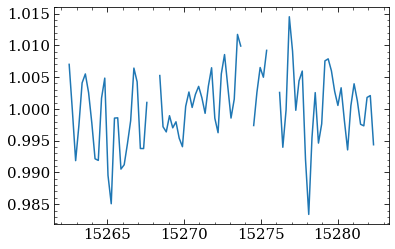

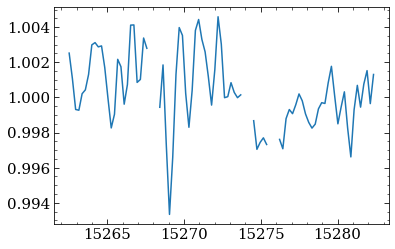

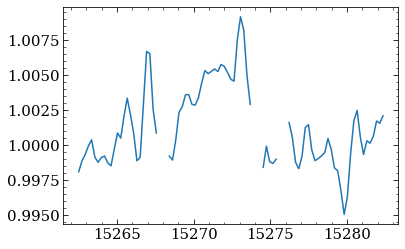

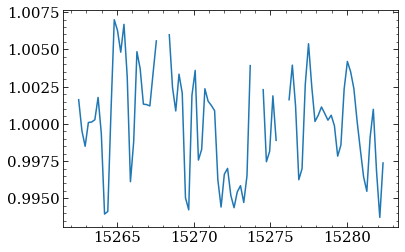

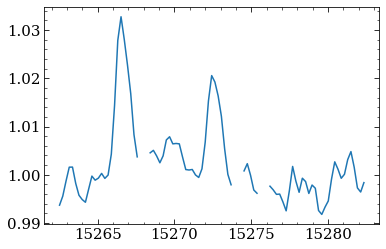

In [ ]:
continua = sightlines[0].continuum

for i in range(len(continua)):
    fig, ax = plt.subplots()
    ax.plot(wavs_window, continua[i, :])
    plt.show()

In [ ]:
# fig, ax = plt.subplots()
# for i in range(len(sightlines)):
#     ax.scatter(sightlines[i].bins, i*np.ones(len(sightlines[i].bins) ))
# ax.set_xlim(300, 700)
# plt.show()

In [ ]:
(sightlines[0].dAVdd)

array([[0.02505482, 0.01463533, 0.0171423 , 0.0190367 , 0.0134868 ,
        0.01991955],
       [0.02040062, 0.02273286, 0.02591693, 0.0225907 , 0.01288971,
        0.02158909],
       [0.01642727, 0.03498715, 0.0245072 , 0.01112716, 0.02144055,
        0.01053787],
       [0.02850594, 0.02177769, 0.02268154, 0.01953324, 0.01716393,
        0.0186135 ],
       [0.02622766, 0.02652772, 0.02612297, 0.019099  , 0.02324438,
        0.02606989]])

In [ ]:
# for i in range(len(sightlines)):
#     sl = sightlines[i]
#     fig, axs = plt.subplots(nrows = 1, ncols = 2, figsize = (12, 6))
#     ax = axs[0]
#     for j in range(len(sl.signals)):
#         ax.plot(wavs_window, sl.signals[j, :])
#         ax.set_ylim(0.9, 1.02)
#         ax.set_xlabel(r'Wavelength ($\AA$)')
#     ax = axs[1]
#     for j in range(len(sl.actual_DIBs)):
#         ax.plot(wavs_window, sl.actual_DIBs[j, :])
#         ax.set_ylim(0.9, 1.02)
#         ax.set_xlabel(r'Wavelength ($\AA$)')
#     plt.show()

In [ ]:
# for i in range(len(sightlines)):
#     sl = sightlines[i]
#     fig, ax = plt.subplots(nrows = 1, figsize = (12, 6))
#     for j in range(len(sl.signals)):
#         ax.plot(wavs_window, sl.raw_DIB[j, :] )
#         ax.set_ylim(0.9, 1.02)
#         ax.set_xlabel(r'Wavelength ($\AA$)')

In [ ]:
from MCMCfns import logprob_2

In [ ]:
farvelo

-10

In [ ]:
def logprior_v_mod(v, vmin = 1.2 * farvelo, vmax = 1.2 * nearvelo, **kwargs):
    if np.any(v > 100) or np.any(v < -100):
        return - np.inf
    return 0.0


In [ ]:
from MCMCfns import logprior_davdd_min, logprob_2
class Logprior_Foreground:
    def __init__(self, l, b):
        self.pointfit = self.polynomial2d(l, b)
        self.pointfit_width = 2.404363059339516

    def polynomial2d(self, x1, x2, theta = None, uncert = None):  
        return 0.2681596770589955
    
    def logprior_foreground_v(self, v, distance, foreground_distance = 401, **kwargs):    
        foreground = distance <= foreground_distance
        prior_val = np.zeros(distance.shape)

        prior_val[foreground] = (- 0.5 * (v )**2 / (self.pointfit_width**2))[foreground]
        return np.nansum(prior_val)

    def logprior_foreground_av(self, av, distance, foreground_distance = 401):
        foreground = distance <= foreground_distance
        if np.any(av[:, foreground] > 0.8):
            return -np.inf
        return 0.0
def logprob_fg(p, sl, lp_fore = None, **kwargs):
    ndim = len(sl.voxel_dAVdd)
    
    lprob = logprob_2(p, sl, logprior = logprior_v_mod, **kwargs)
    v = p[ :ndim]
    av = p[ndim:].reshape(-1, ndim) #what shape is dAVddd? 

    ### Added 05.08 ###
    lprior_av_min = logprior_davdd_min(av)
    lprob = lprob + lprior_av_min

    lp_fore_v = lp_fore.logprior_foreground_v(v, sl.bins[1:])
    # lp_fore_av = lp_fore.logprior_foreground_av(av, sl.bins[1:])
    return lprob + lp_fore_v #+ lp_fore_av


def MCMC_fg(sl, steps = 1000, nwalkers = 100, pool = None, filename = None):
    ndim = len(sl.voxel_dAVdd) 
    nstar = len(sl.stars)
    ndim_amp = int(ndim + ndim * nstar)

    lp_foreground = Logprior_Foreground(sl.l, sl.b)

    
    if filename is not None:
        backend = emcee.backends.HDFBackend(filename)
        backend.reset(nwalkers, ndim_amp)
    else:
        backend = None


    sampler = emcee.EnsembleSampler(nwalkers, ndim_amp , logprob_fg, 
                                    kwargs={'sl': sl, 'lp_fore': lp_foreground}, pool = pool, backend = backend) # OKAY SO I FORGOT TO CHANGE THIS, WAS LOGPROB_2
    # init = 12.5 *(np.random.random((nwalkers, ndim_amp)) - 0.5)
    init = 10 *  (np.random.random((nwalkers, ndim_amp)) - 0.5)

    init[:, ndim:] = np.abs(sl.dAVdd.ravel()[np.newaxis, :] + 0.1*(np.random.random(init[:, ndim:].shape)-0.5))
    init[:, ndim:][(init[:, ndim:] <= 0.1)] = 0.11 + 0.05 * np.random.random(np.sum(init[:, ndim:]<= 0.1))
    init[:, ndim:] 
    print('NDIM:', ndim, 'NSTAR:', nstar, 'INITSHAPE:', init.shape)
    
    sampler.run_mcmc(init,  steps, store = True, progress = True, );
    
    return sampler, ndim, ndim_amp

def MCMC_scary_mod(sl, steps = 1000, nwalkers = 100, pool = None, filename =None):
    ndim = len(sl.voxel_dAVdd) 
    nstar = len(sl.stars)
    ndim_amp = int(ndim + ndim * nstar)
    

    # dAVdd_prior = sl.dAVdd[:]
    # dAVdd_prior[dAVdd_prior == 0] = np.nan 
    # dAVdd_prior_med = np.nanmedian(dAVdd_prior, axis = 1)
    # dAVdd_prior_std = np.nanstd(dAVdd_prior, axis = 1, ddof = 1)
    # gaussparams = (dAVdd_prior_med, dAVdd_prior_std)
    # print(gaussparams)


    if filename is not None:
        backend = emcee.backends.HDFBackend(filename)
        backend.reset(nwalkers, ndim_amp)
    else:
        backend = None
    # with Pool(15) as pool:

    sampler = emcee.EnsembleSampler(nwalkers, ndim_amp , logprob_2, 
                                    kwargs={'sl': sl, 'logprior': logprior_v_mod, 'prior_mult':  1, 'v_max': 20, 'sigma': None}, pool = pool, backend=backend)
    # init = 12.5 *(np.random.random((nwalkers, ndim_amp)) - 0.5)
    init = 10 * (np.random.random((nwalkers, ndim_amp)) - 0.5)

    init[:, ndim:] = np.abs(sl.dAVdd.ravel()[np.newaxis, :] + 0.1*(np.random.random(init[:, ndim:].shape)-0.5))
    print('NDIM:', ndim, 'NSTAR:', nstar, 'INITSHAPE:', init.shape)
    
    sampler.run_mcmc(init,  steps, store= True, progress = True);
    
    return sampler, ndim, ndim_amp

In [ ]:
data_dir + 'modelfiles' + '/RUNS/' 

'/uufs/chpc.utah.edu/common/home/astro/zasowski/mcbride/modelfiles/RUNS/'

In [ ]:
stp = 1500
# sampler, ndim, ndim_amp = MCMC_scary(a, steps = stp, nwalkers = 500)
# sampler1, ndim1, ndim_amp1 = MCMC(a1, steps = stp)
# sampler2, ndim2, ndim_amp2 = MCMC(a2, steps = stp)
# sampler3, ndim3, ndim_amp3 = MCMC(a3, steps = stp)

# INJECTIONTEST_0214b: v 10 to -10. expanded prior.
# INJECTIONTEST_0214c: v 50 to -50. 
# INJECTIONTEST_0215a: v 50 to -50. 
# INJECTIONTEST_0216a: v 50 to -50. This time, use gaussian profile for all dAVdd 
# INJECTIONTEST_0216b: v 50 to -50. This time, use gaussian profile for all dAVdd and non-injection continua (Gaussian noise)
# INJECTIONTEST_0220a: v 10 to -10, otherwise same as aboves 
# INJECTIONTEST_0222a: v 10 to -10, real dAVdd, Gaussian noise
# INJECTIONTEST_0222b: v 10 to -10, real dAVdd, real residuals, 
# INJECTIONTEST_0227a: v 10 to -10, gaussian dAVdd, real residuals.
# note: all above since 2014c had prior expanded to +/- 50 km/s, regardless of velocities. From now on, prior limited to 1.2 * nearvelo, farvelo
# INJECTIONTEST_0227b: v 10 to -10, gaussian dAVdd, real residuals, updated prior as listed above




run_label = '0723_InjectionFG'
save_individual = False

first_run = False



if first_run:
    if not os.path.exists(data_dir + 'modelfiles/RUNS/' + run_label):
        os.makedirs(data_dir + 'modelfiles/RUNS/' + run_label)
    dir = data_dir + 'modelfiles/RUNS/' + run_label
    with Pool(20) as pool:
        for i in range(len(sightlines))[:5]:
            try:
                sl_i = sightlines[i]
                smplr, ndm, ndm_amp = MCMC_fg(sl_i, steps = stp, nwalkers = 500, pool = pool, filename = dir + '/sampler_' + str(i) + '.h5')
                # smplr_array.append(smplr)
                # mid = time.time()
                # print('Time mid - start', mid - start) # beat 7:22
                # smplr_, ndim_ = MCMC_vonly(sl_i, smplr, steps = 1200, nwalkers = 100, pool = None)
                # end = time.time()
                # print('Time end - start:',(end - start)/60)
                sl_i.intake(smplr)
                state = 'success'
            except Exception as e:
                print(e)
                print('Something went wrong')
                sl_i = None 
                state = 'fail'
                # with open('RUNS/' + run_label + '/FAILS.txt', mode = 'a') as fails:
                #     fails.write(str(e))
                
#             with open('RUNS/' + run_label + '/LOG.txt', mode = 'a') as log:
#                 logstring = time.asctime() + ' | ' + str(i) + ' | ' + state + '\n'
#                 log.write(logstring)

# # sampler, ndim, ndim_amp = smplr, ndm, ndm_amp

In [ ]:
average_velocities = []
for i in range(len(velocity_range)):
    for j in range(len(scale_range)):    
        vrange, scale = velocity_range[i], scale_range[j]
        rvelo, star_loc_rvelo_scattered, star_locs = velo_profile(vrange, scale = scale)
        average_velo = []
        for k in range(len(sightlines[0].bins)-1):
            in_bin = (dust_data.distance > sightlines[0].bins[k]) & (dust_data.distance < sightlines[0].bins[k+1])
            average_velo.append(np.sum(rvelo[in_bin] * dust_data.distance[in_bin])/np.sum(dust_data.distance[in_bin]))
        average_velocities.append(average_velo)

for j in range(4):
    vrange = 30
    scale = scale_range[j]
    rvelo, star_loc_rvelo_scattered, star_locs = velo_profile(vrange, scale = scale)
    average_velo = []
    for k in range(len(sightlines[0].bins)-1):
        in_bin = (dust_data.distance > sightlines[0].bins[k]) & (dust_data.distance < sightlines[0].bins[k+1])
        average_velo.append(np.sum(rvelo[in_bin] * dust_data.distance[in_bin])/np.sum(dust_data.distance[in_bin]))
    average_velocities.append(average_velo)

In [ ]:
# h5py.File(dir+'/sampler_10.h5')

In [ ]:
print(dir)

/uufs/chpc.utah.edu/common/home/astro/zasowski/mcbride/modelfiles/RUNS/0723_InjectionFG


In [ ]:
chains = []
probabilities = []
for i in range(len(sightlines))[:-4]:
    # path = '/uufs/astro.utah.edu/common/home/u1371365/nanoKT_v1/RUNS/'
    # print(path + run_label+'/sampler_' + str(i) +'.h5')
    dir = data_dir + 'modelfiles/RUNS/' + run_label 
    path = '/uufs/chpc.utah.edu/common/home/astro/zasowski/mcbride/modelfiles/RUNS/0723_InjectionFG/sampler_{}.h5'.format(i)
    reader = emcee.backends.HDFBackend(path)
    chains.append(reader.get_chain())
    probabilities.append(reader.get_log_prob())

# chains = [sl.sampler.chain.swapaxes(0, 1) for sl in sightlines]
# probabilities = [sl.sampler.get_log_prob() for sl in sightlines]

In [ ]:

for i in range(4):
    # path = '/uufs/astro.utah.edu/common/home/u1371365/nanoKT_v1/RUNS/'
    # print(path + run_label+'/sampler_' + str(i) +'.h5')
    dir = data_dir + 'modelfiles/RUNS/' + run_label 
    path = '/uufs/astro.utah.edu/common/home/u1371365/nanoKT_v1/RUNS/0719_InjectionFG/sampler_{}.h5'.format(12+i)
    reader = emcee.backends.HDFBackend(path)
    chains.append(reader.get_chain())
    probabilities.append(reader.get_log_prob())

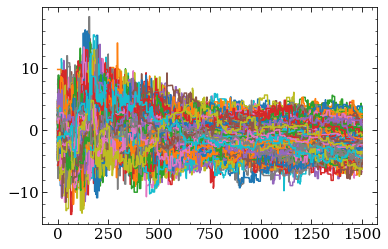

In [ ]:
fig, ax = plt.subplots()
ax.plot(chains[14][:, :, 4])
plt.show()

In [ ]:
print(chains[0].shape)

(1500, 500, 36)


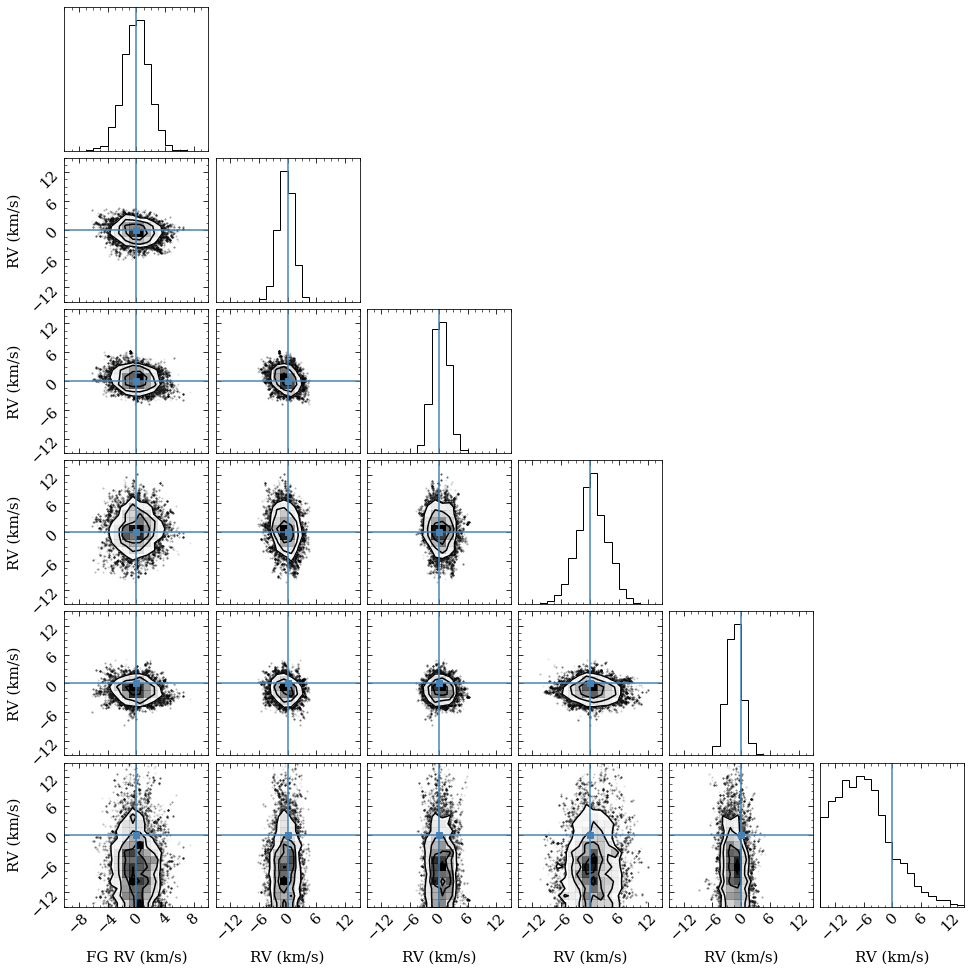

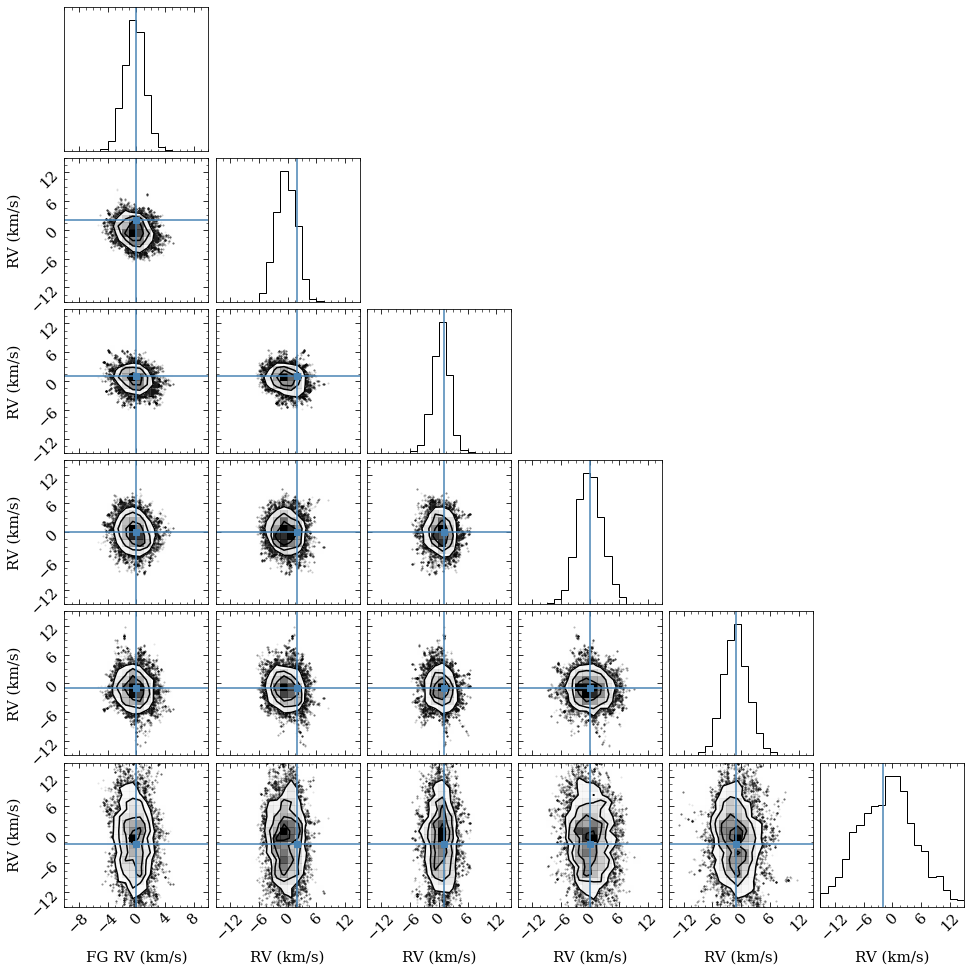

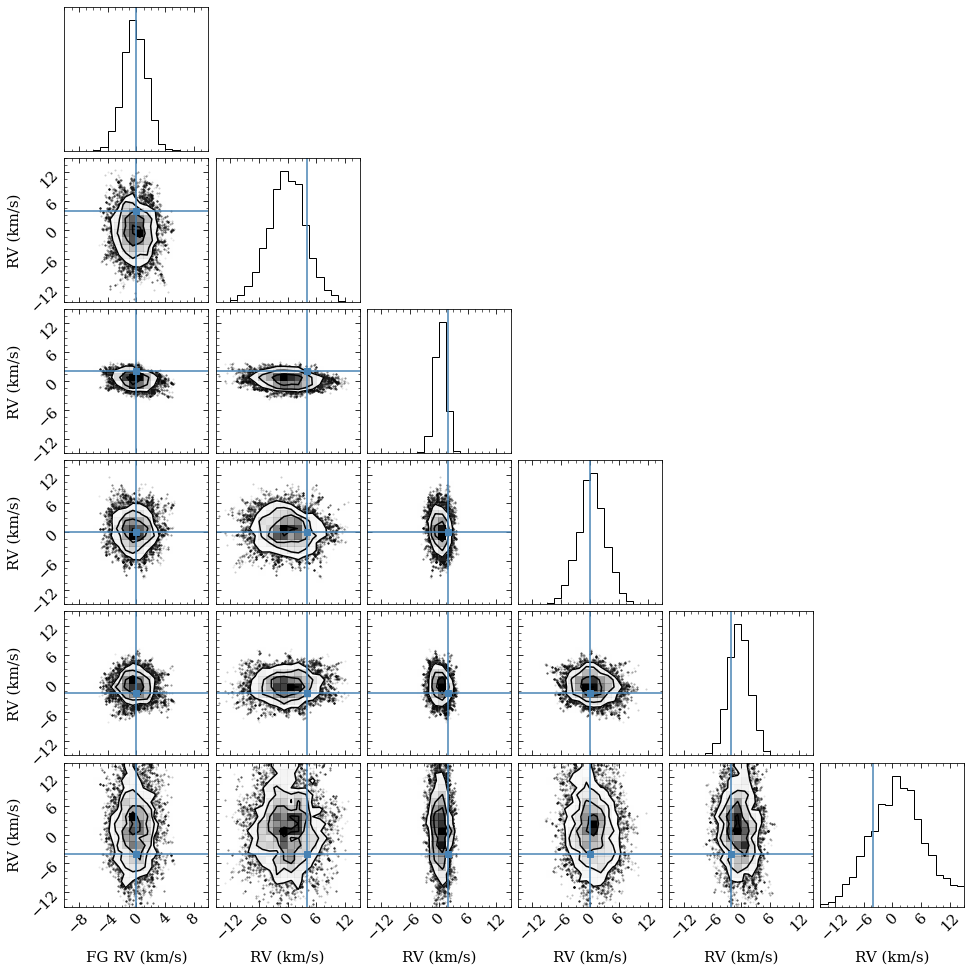

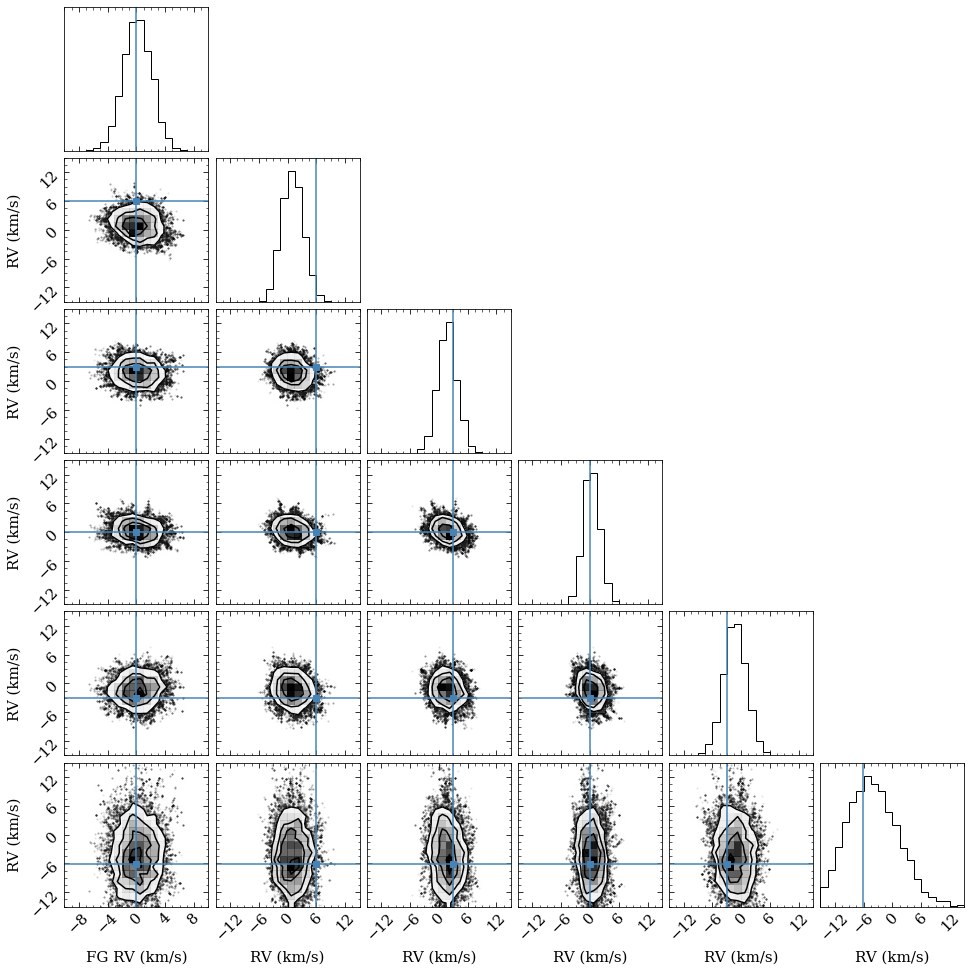

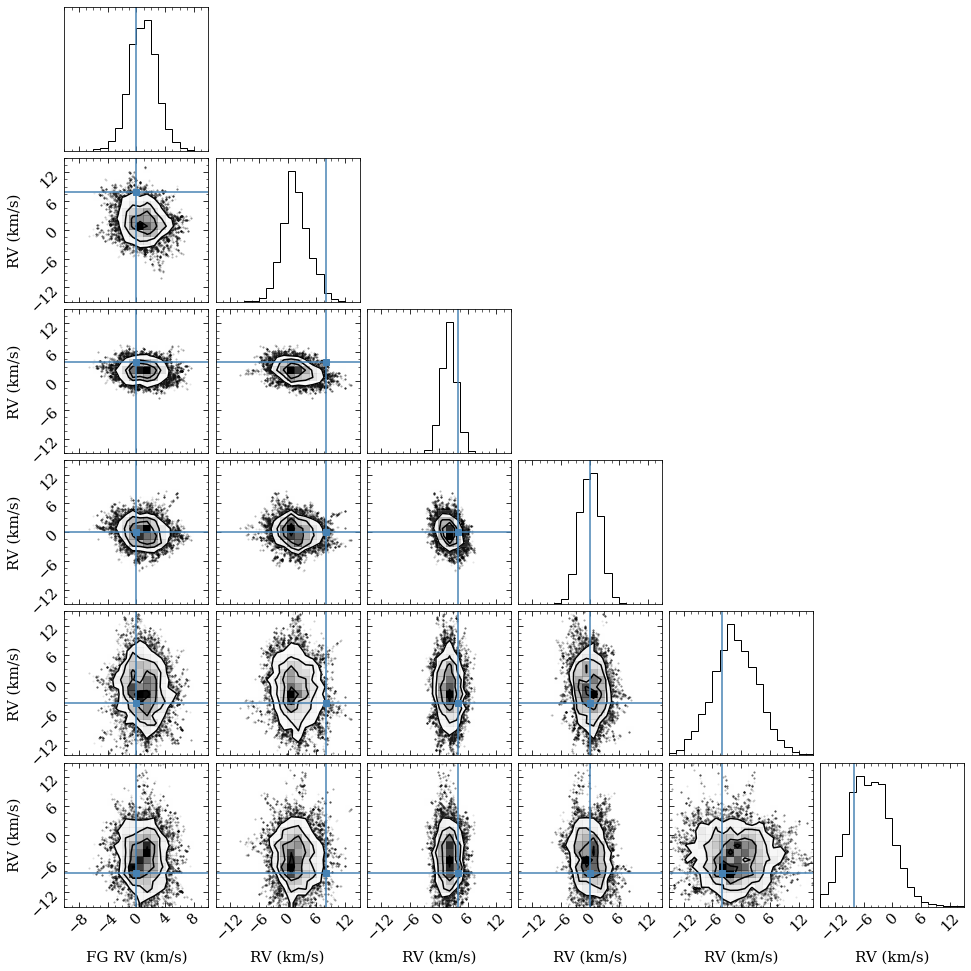

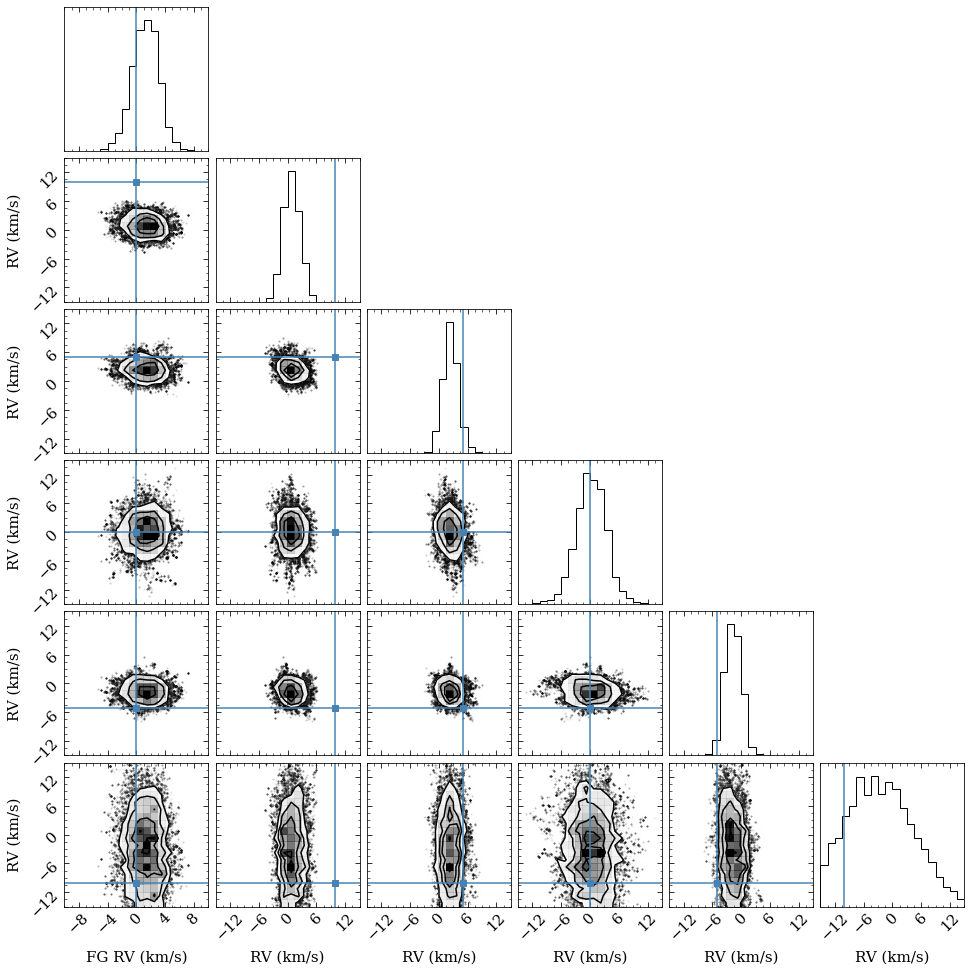

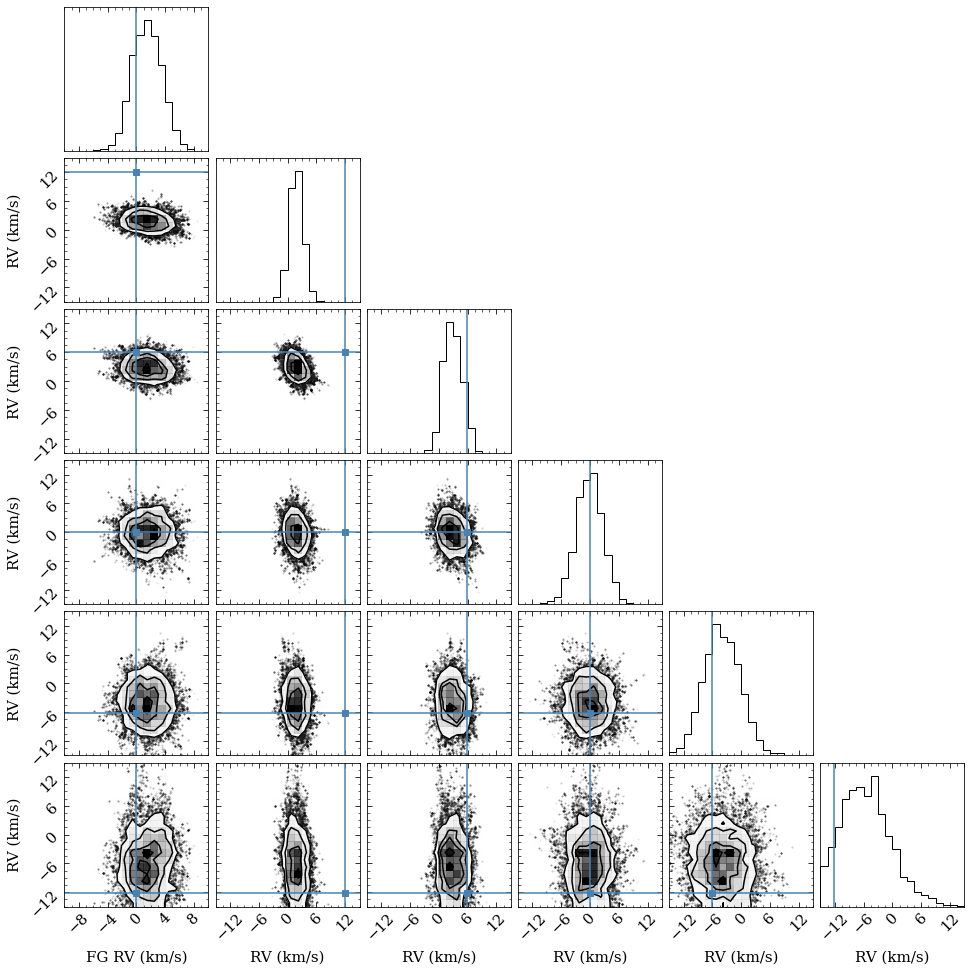

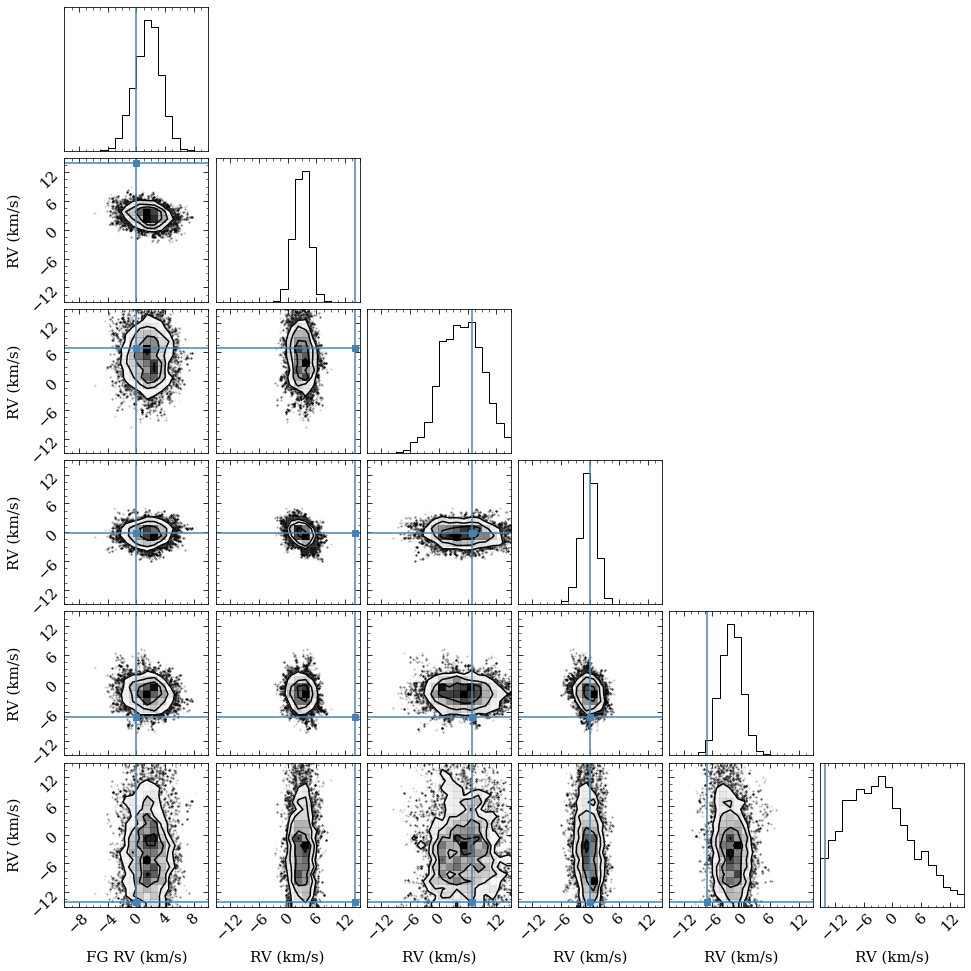

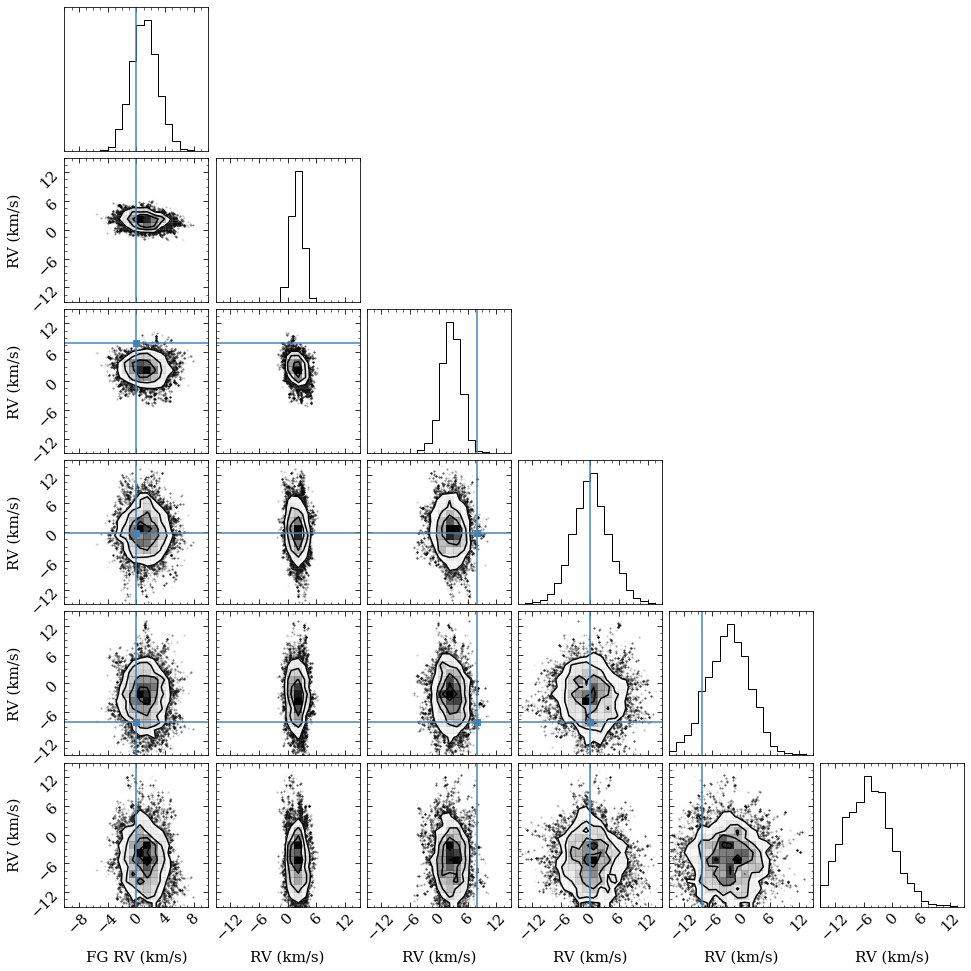

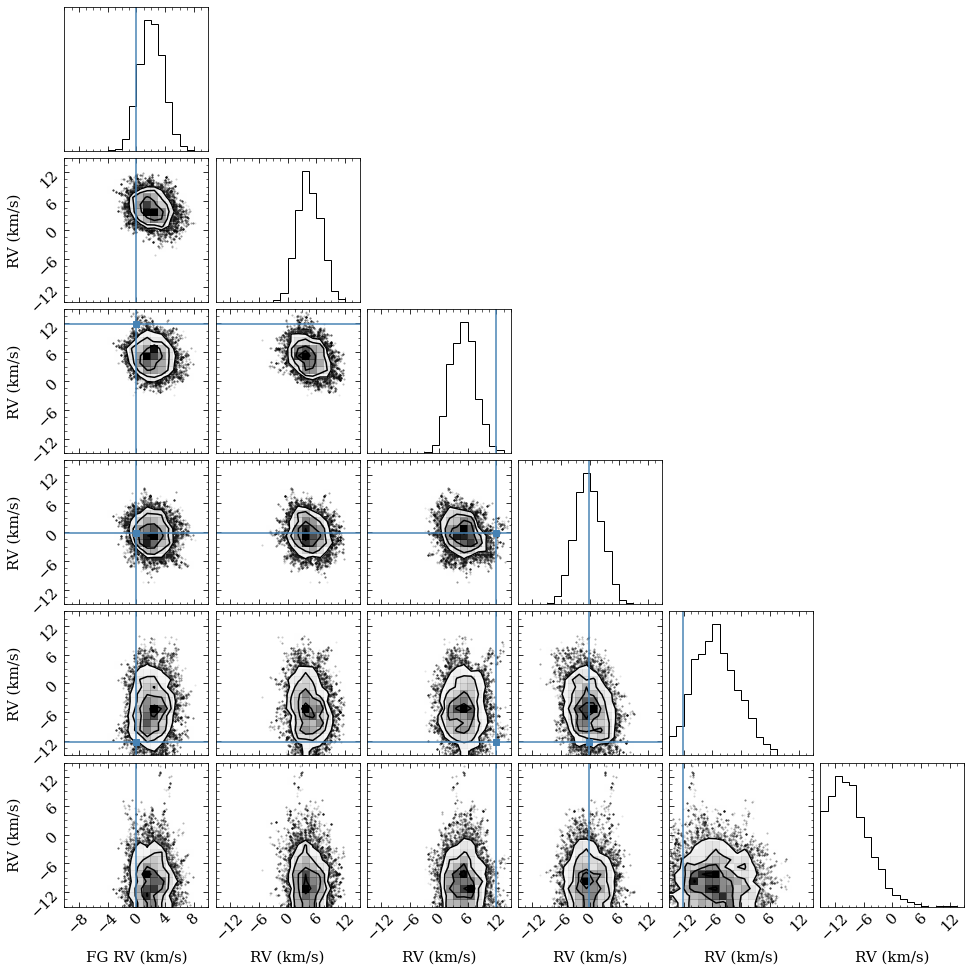

In [ ]:
for i in range(0, len(sightlines), 4):
    chain = chains[i]
    avg_velo = average_velocities[i]
    velocity_samples = chain[-100:, :, :6].reshape(-1, 6)
    fig = corner.corner(velocity_samples, labels = ['FG RV (km/s)', 'RV (km/s)', 'RV (km/s)', 'RV (km/s)', 'RV (km/s)','RV (km/s)'], 
                        range = [(-10, 10), (-15, 15), (-15, 15),(-15, 15),(-15, 15),(-15, 15)], truths = avg_velo)
    
    plt.show()


N 0
ndim 6
nstars 5
medians shape (36,)
med_velo shape (6,)
med_dAV_dd shape (5, 6)
order_inds [0 1 2 3 4]
signal_recreated.shape (5, 95)
0
1
2
3
4


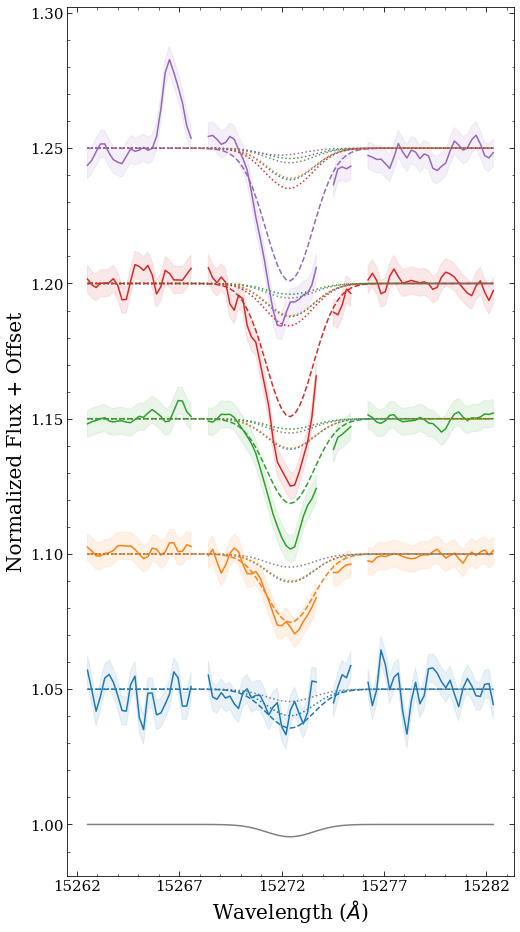

N 1
ndim 6
nstars 5
medians shape (36,)
med_velo shape (6,)
med_dAV_dd shape (5, 6)
order_inds [0 1 2 3 4]
signal_recreated.shape (5, 95)
0
1
2
3
4


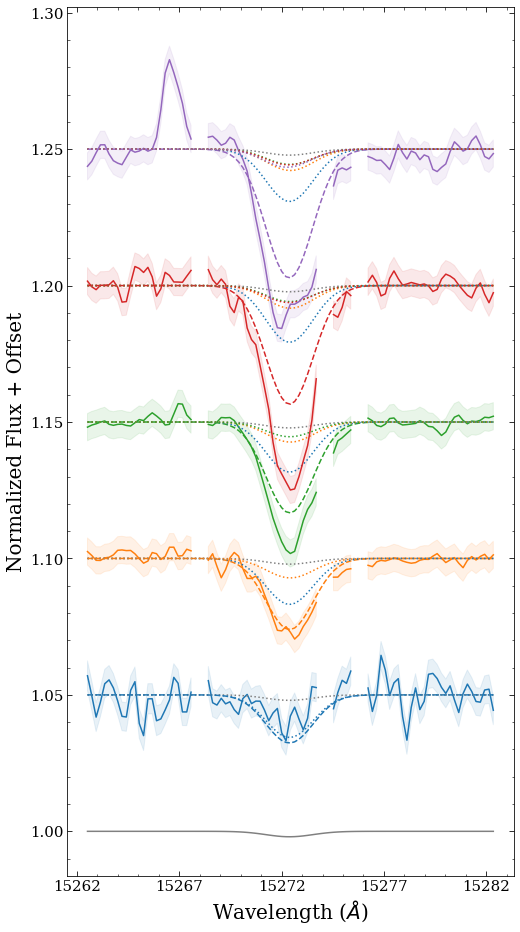

N 2
ndim 6
nstars 5
medians shape (36,)
med_velo shape (6,)
med_dAV_dd shape (5, 6)
order_inds [0 1 2 3 4]
signal_recreated.shape (5, 95)
0
1
2
3
4


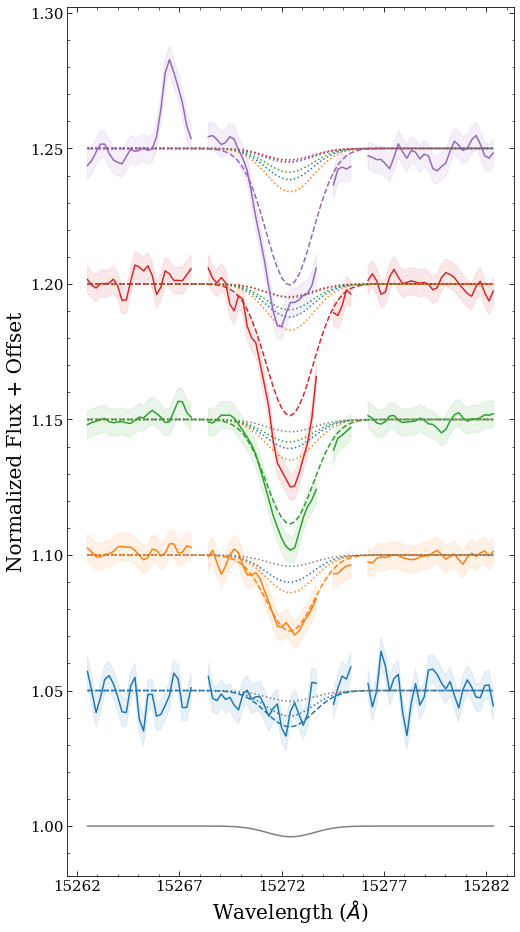

N 3
ndim 6
nstars 5
medians shape (36,)
med_velo shape (6,)
med_dAV_dd shape (5, 6)
order_inds [0 1 2 3 4]
signal_recreated.shape (5, 95)
0
1
2
3
4


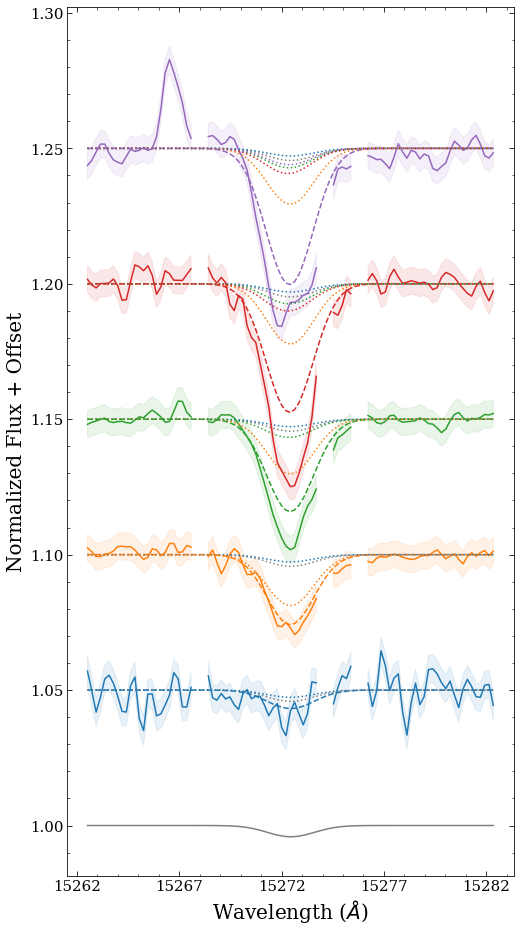

N 4
ndim 6
nstars 5
medians shape (36,)
med_velo shape (6,)
med_dAV_dd shape (5, 6)
order_inds [0 1 2 3 4]
signal_recreated.shape (5, 95)
0
1
2
3
4


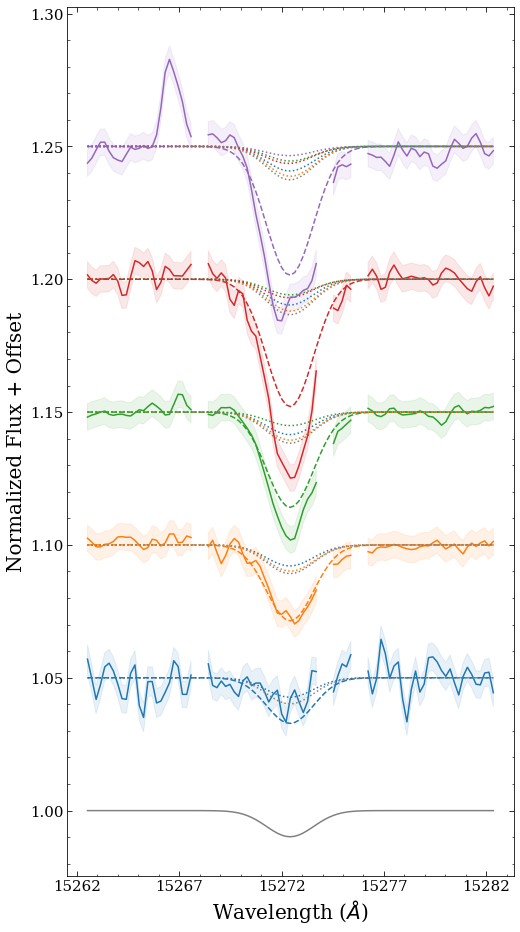

N 5
ndim 6
nstars 5
medians shape (36,)
med_velo shape (6,)
med_dAV_dd shape (5, 6)
order_inds [0 1 2 3 4]
signal_recreated.shape (5, 95)
0
1
2
3
4


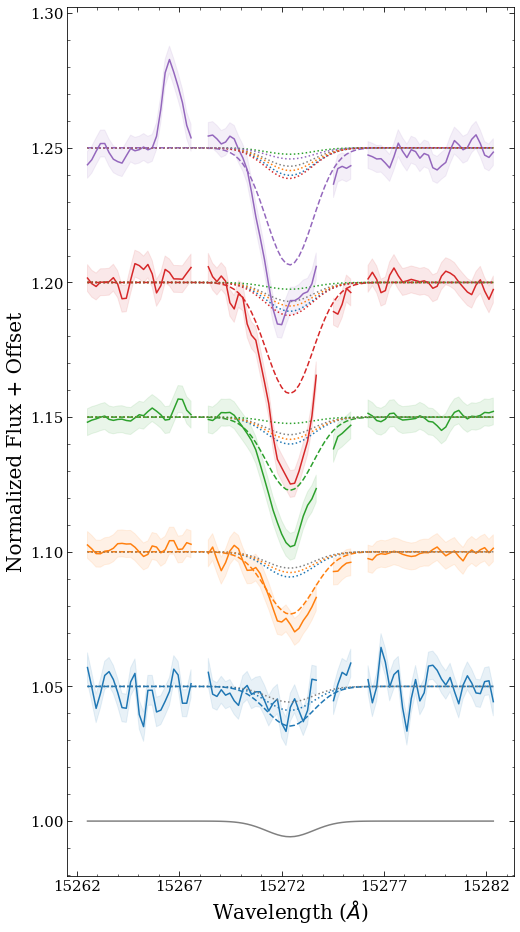

N 6
ndim 6
nstars 5
medians shape (36,)
med_velo shape (6,)
med_dAV_dd shape (5, 6)
order_inds [0 1 2 3 4]
signal_recreated.shape (5, 95)
0
1
2
3
4


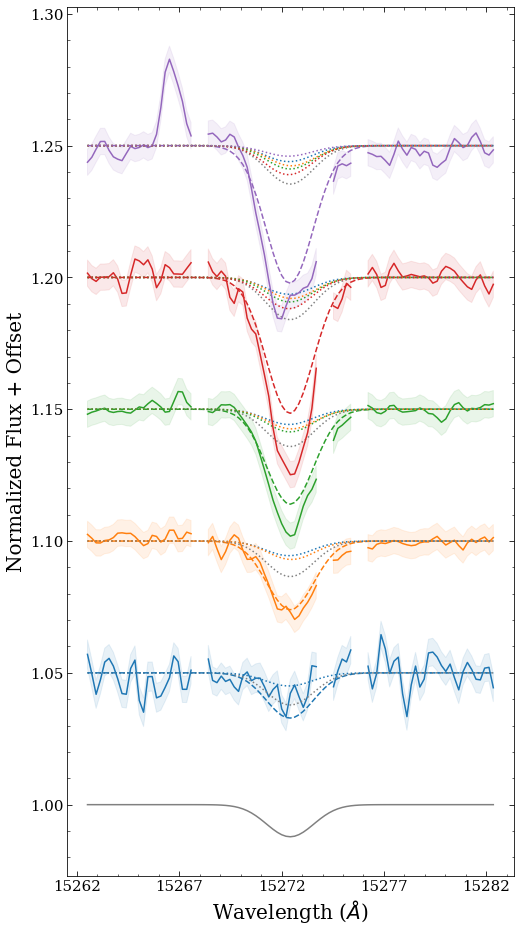

N 7
ndim 6
nstars 5
medians shape (36,)
med_velo shape (6,)
med_dAV_dd shape (5, 6)
order_inds [0 1 2 3 4]
signal_recreated.shape (5, 95)
0
1
2
3
4


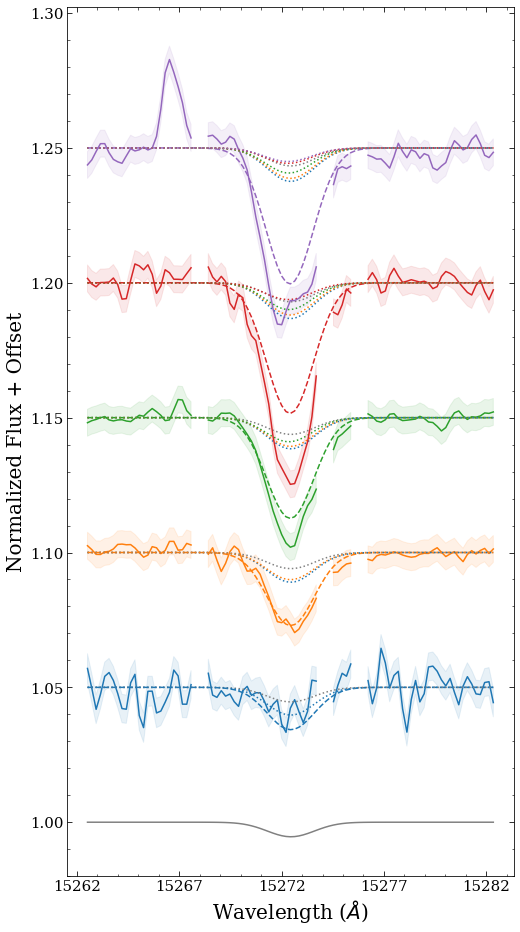

N 8
ndim 6
nstars 5
medians shape (36,)
med_velo shape (6,)
med_dAV_dd shape (5, 6)
order_inds [0 1 2 3 4]
signal_recreated.shape (5, 95)
0
1
2
3
4


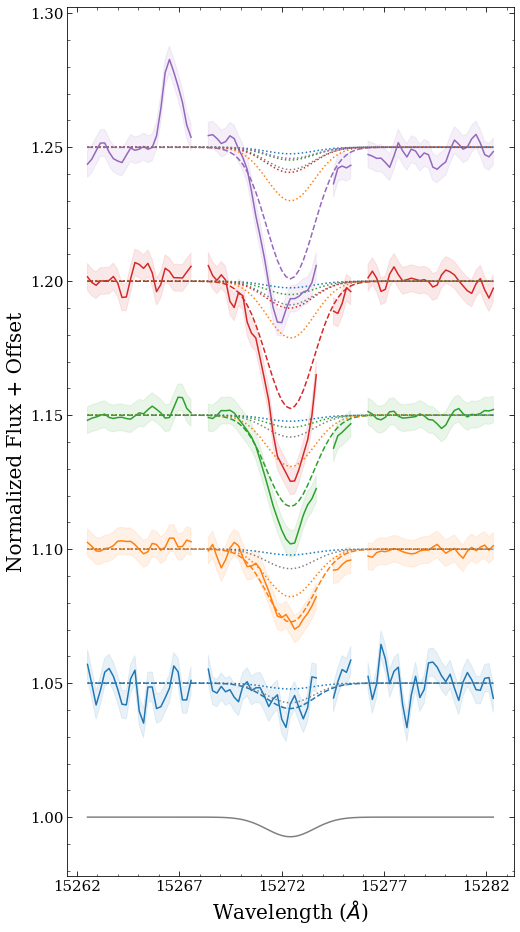

N 9
ndim 6
nstars 5
medians shape (36,)
med_velo shape (6,)
med_dAV_dd shape (5, 6)
order_inds [0 1 2 3 4]
signal_recreated.shape (5, 95)
0
1
2
3
4


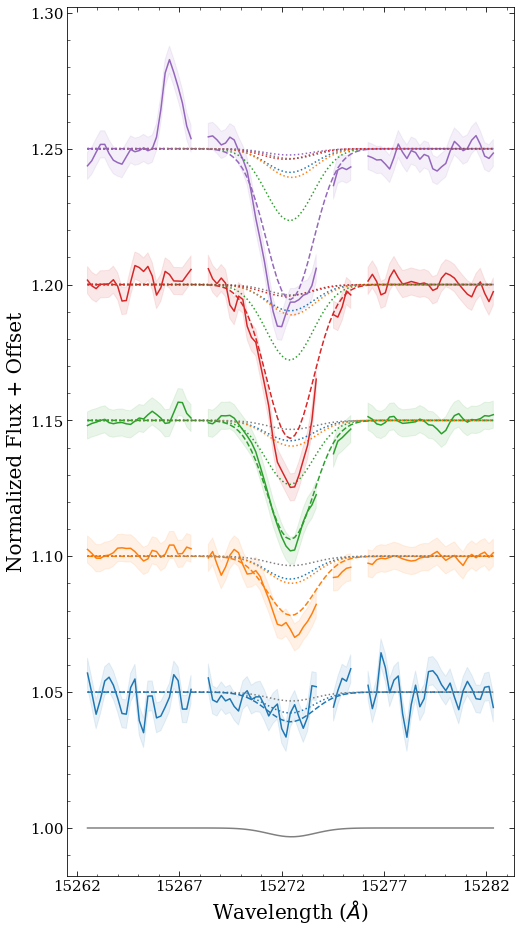

N 10
ndim 6
nstars 5
medians shape (36,)
med_velo shape (6,)
med_dAV_dd shape (5, 6)
order_inds [0 1 2 3 4]
signal_recreated.shape (5, 95)
0
1
2
3
4


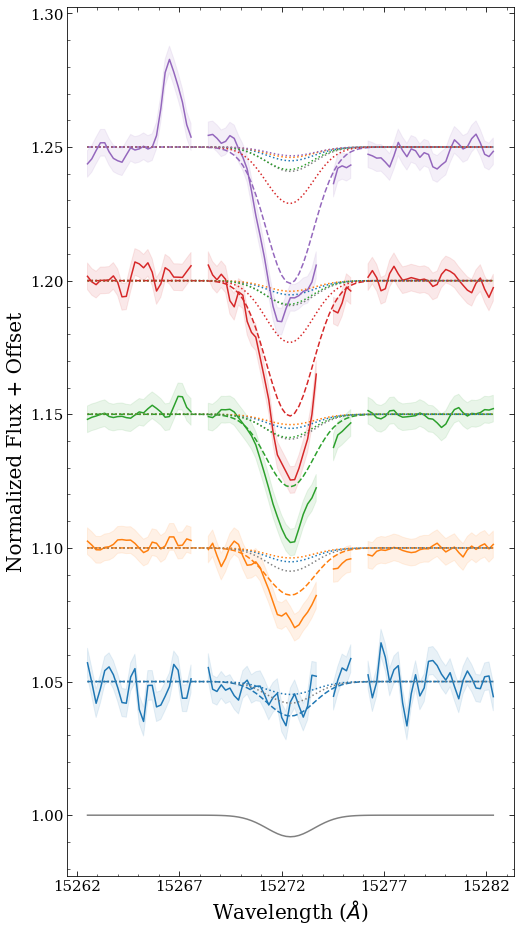

N 11
ndim 6
nstars 5
medians shape (36,)
med_velo shape (6,)
med_dAV_dd shape (5, 6)
order_inds [0 1 2 3 4]
signal_recreated.shape (5, 95)
0
1
2
3
4


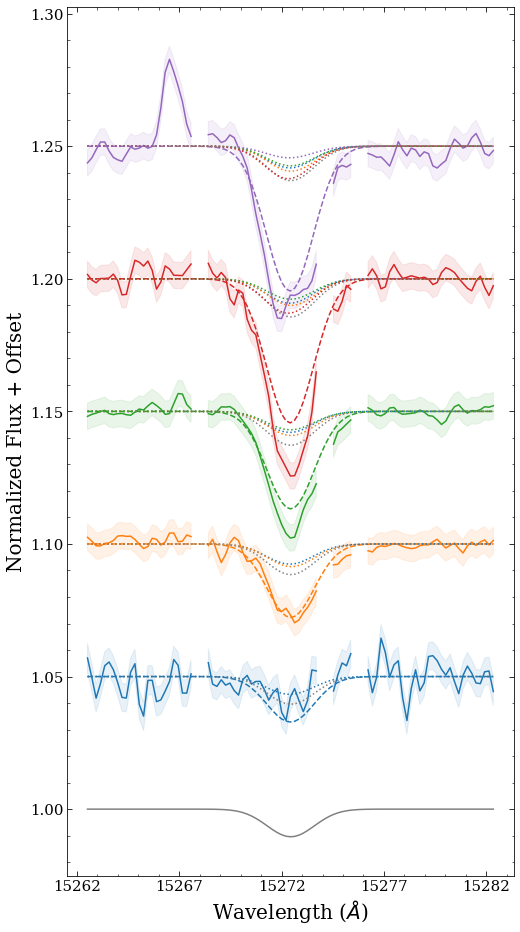

N 12
ndim 6
nstars 5
medians shape (36,)
med_velo shape (6,)
med_dAV_dd shape (5, 6)
order_inds [0 1 2 3 4]
signal_recreated.shape (5, 95)
0
1
2
3
4


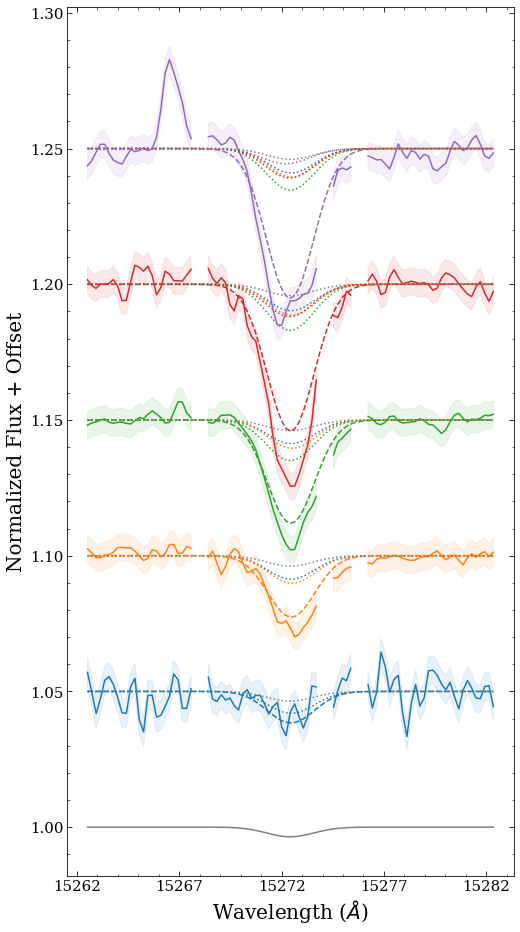

N 13
ndim 6
nstars 5
medians shape (36,)
med_velo shape (6,)
med_dAV_dd shape (5, 6)
order_inds [0 1 2 3 4]
signal_recreated.shape (5, 95)
0
1
2
3
4


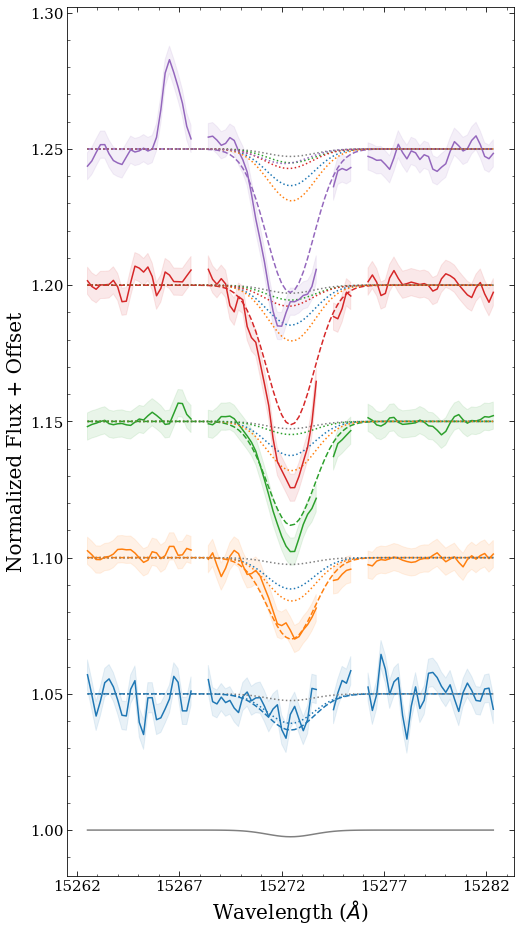

N 14
ndim 6
nstars 5
medians shape (36,)
med_velo shape (6,)
med_dAV_dd shape (5, 6)
order_inds [0 1 2 3 4]
signal_recreated.shape (5, 95)
0
1
2
3
4


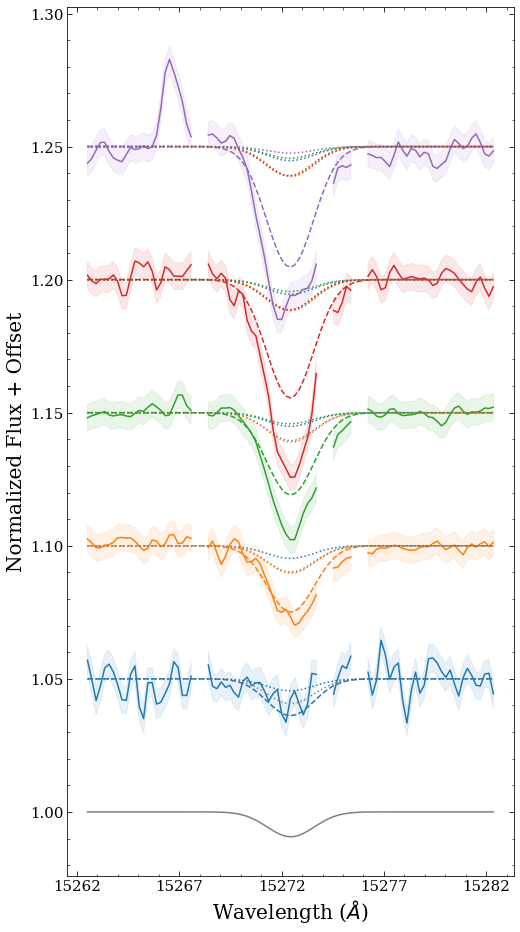

N 15
ndim 6
nstars 5
medians shape (36,)
med_velo shape (6,)
med_dAV_dd shape (5, 6)
order_inds [0 1 2 3 4]
signal_recreated.shape (5, 95)
0
1
2
3
4


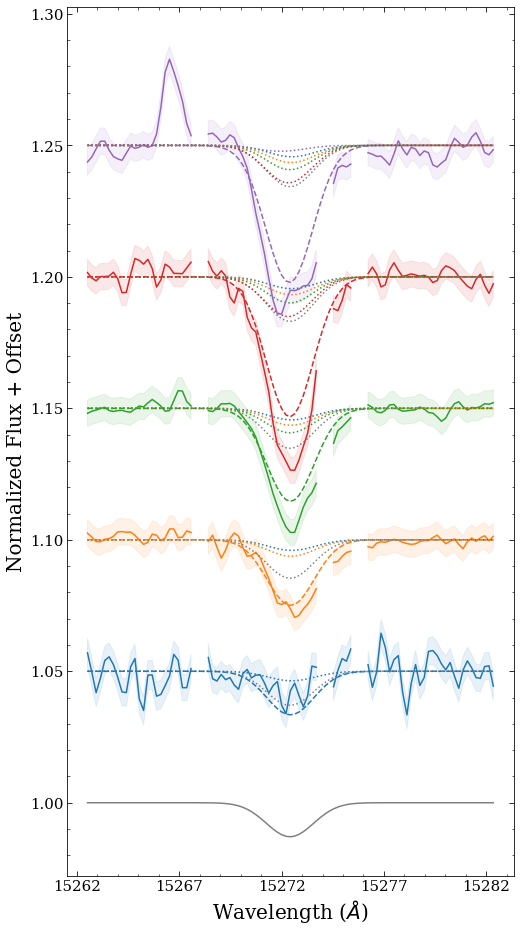

N 16
ndim 6
nstars 5
medians shape (36,)
med_velo shape (6,)
med_dAV_dd shape (5, 6)
order_inds [0 1 2 3 4]
signal_recreated.shape (5, 95)
0
1
2
3
4


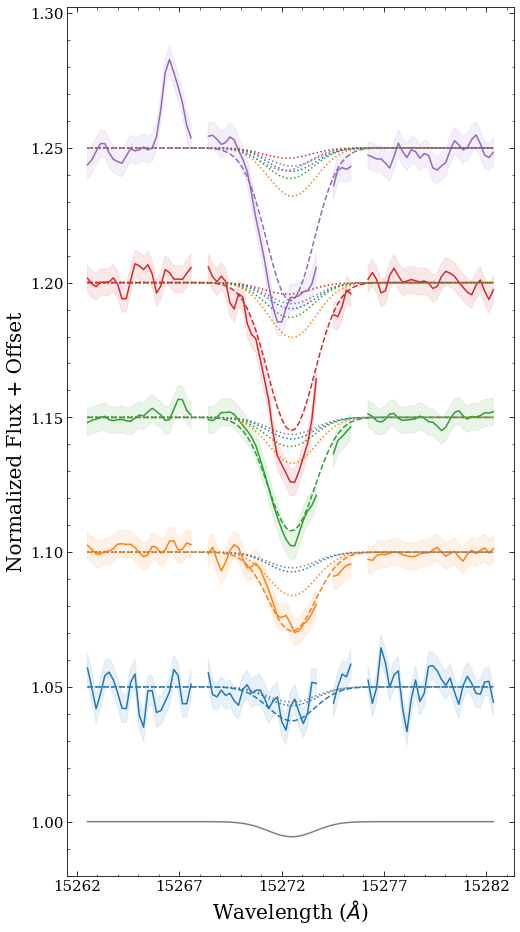

N 17
ndim 6
nstars 5
medians shape (36,)
med_velo shape (6,)
med_dAV_dd shape (5, 6)
order_inds [0 1 2 3 4]
signal_recreated.shape (5, 95)
0
1
2
3
4


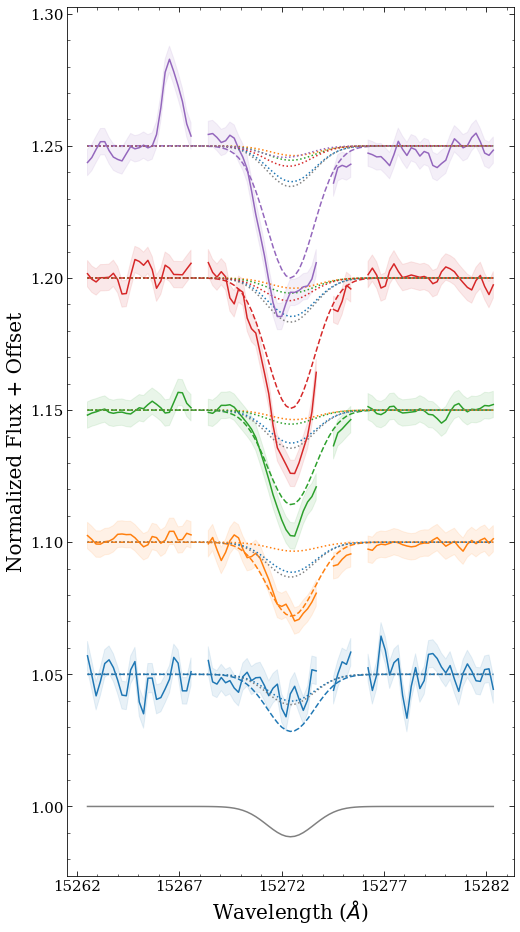

N 18
ndim 6
nstars 5
medians shape (36,)
med_velo shape (6,)
med_dAV_dd shape (5, 6)
order_inds [0 1 2 3 4]
signal_recreated.shape (5, 95)
0
1
2
3
4


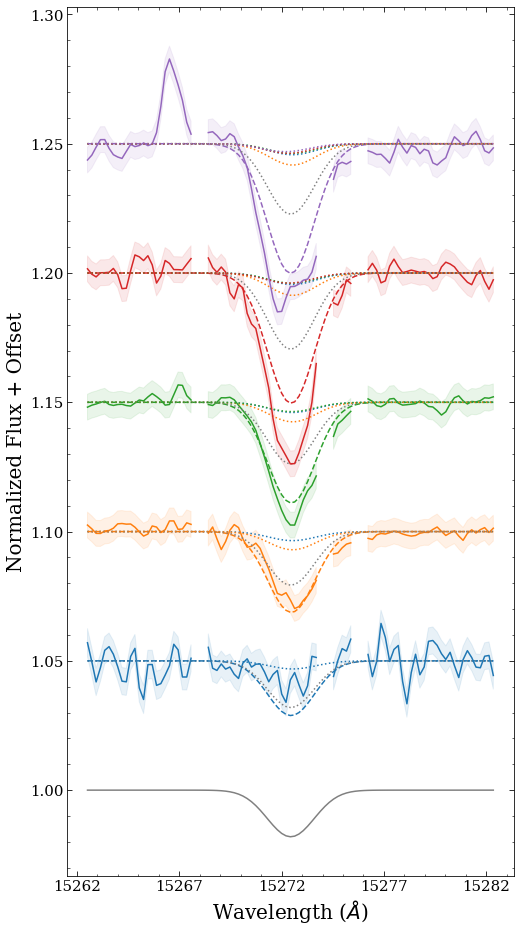

N 19
ndim 6
nstars 5
medians shape (36,)
med_velo shape (6,)
med_dAV_dd shape (5, 6)
order_inds [0 1 2 3 4]
signal_recreated.shape (5, 95)
0
1
2
3
4


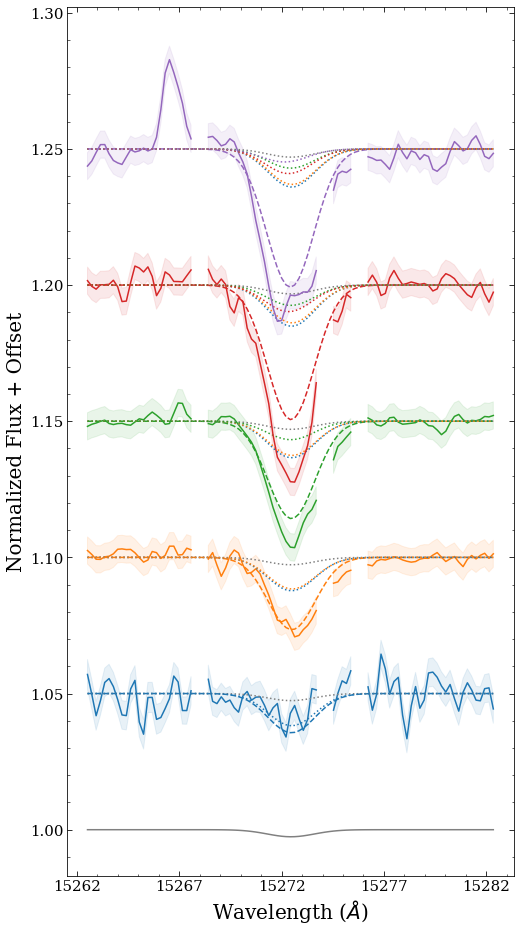

N 20
ndim 6
nstars 5
medians shape (36,)
med_velo shape (6,)
med_dAV_dd shape (5, 6)
order_inds [0 1 2 3 4]
signal_recreated.shape (5, 95)
0
1
2
3
4


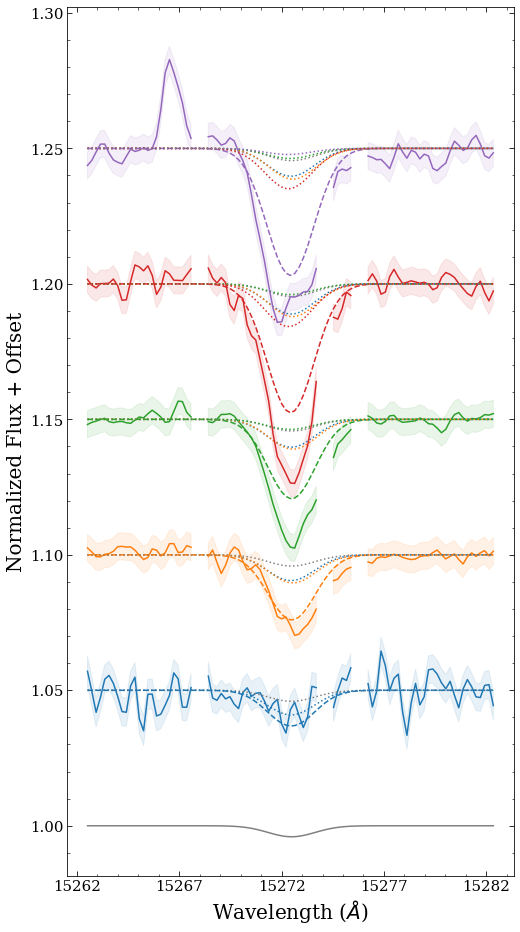

N 21
ndim 6
nstars 5
medians shape (36,)
med_velo shape (6,)
med_dAV_dd shape (5, 6)
order_inds [0 1 2 3 4]
signal_recreated.shape (5, 95)
0
1
2
3
4


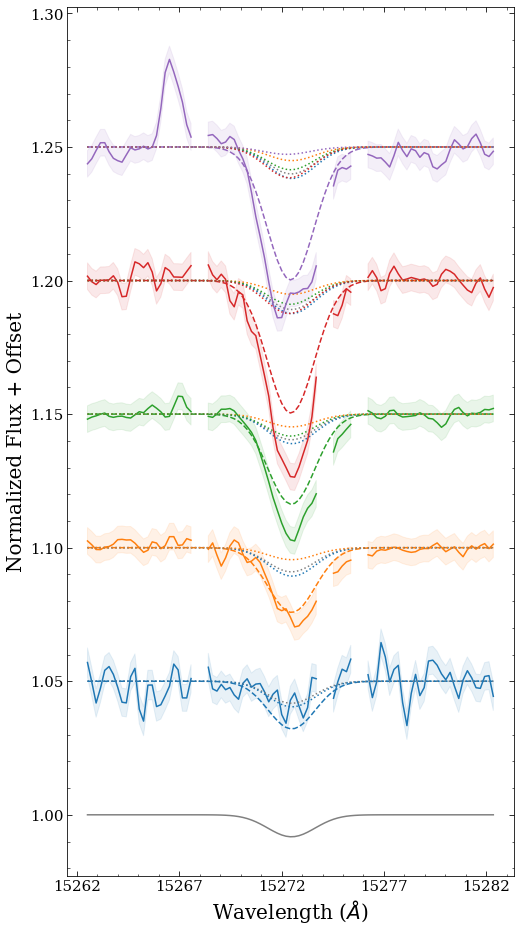

N 22
ndim 6
nstars 5
medians shape (36,)
med_velo shape (6,)
med_dAV_dd shape (5, 6)
order_inds [0 1 2 3 4]
signal_recreated.shape (5, 95)
0
1
2
3
4


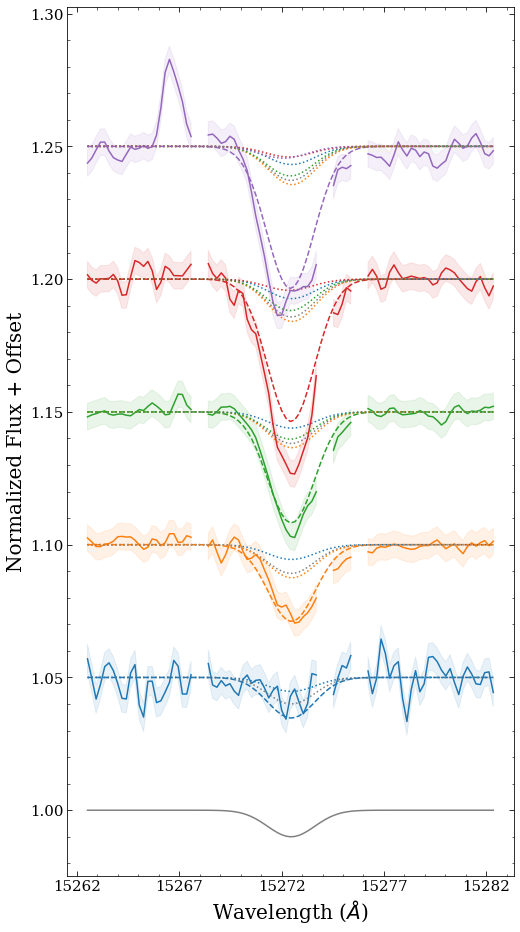

N 23
ndim 6
nstars 5
medians shape (36,)
med_velo shape (6,)
med_dAV_dd shape (5, 6)
order_inds [0 1 2 3 4]
signal_recreated.shape (5, 95)
0
1
2
3
4


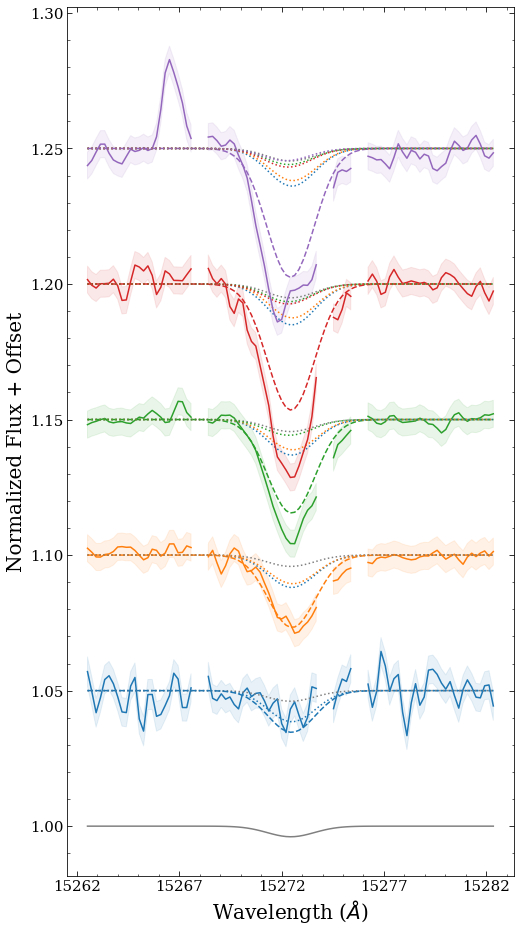

N 24
ndim 6
nstars 5
medians shape (36,)
med_velo shape (6,)
med_dAV_dd shape (5, 6)
order_inds [0 1 2 3 4]
signal_recreated.shape (5, 95)
0
1
2
3
4


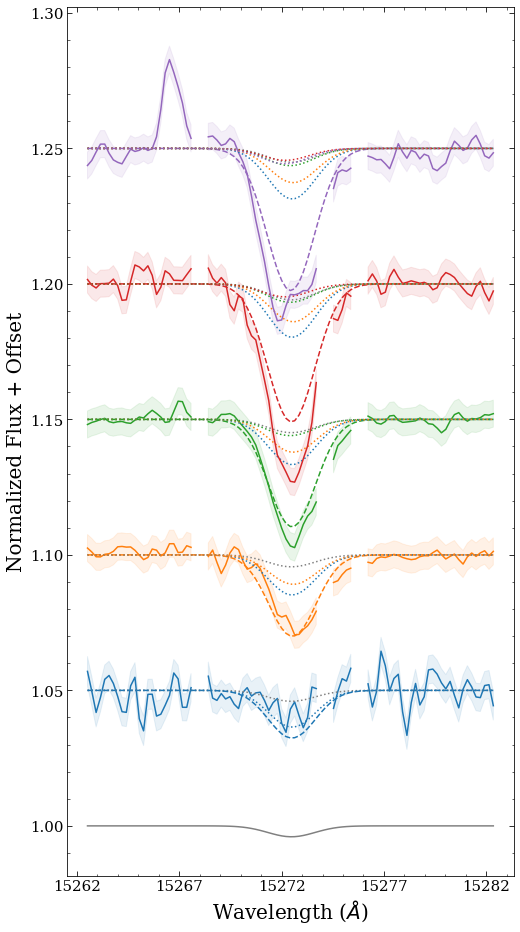

N 25
ndim 6
nstars 5
medians shape (36,)
med_velo shape (6,)
med_dAV_dd shape (5, 6)
order_inds [0 1 2 3 4]
signal_recreated.shape (5, 95)
0
1
2
3
4


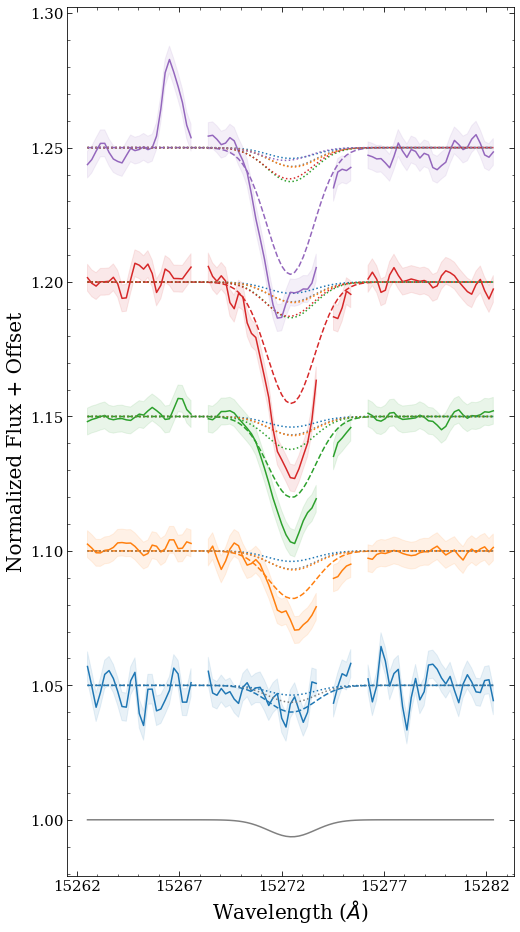

N 26
ndim 6
nstars 5
medians shape (36,)
med_velo shape (6,)
med_dAV_dd shape (5, 6)
order_inds [0 1 2 3 4]
signal_recreated.shape (5, 95)
0
1
2
3
4


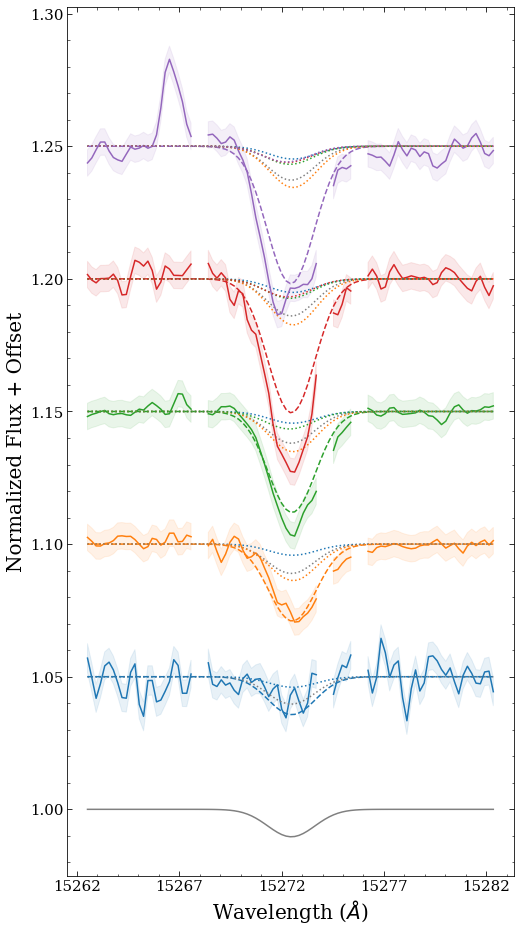

N 27
ndim 6
nstars 5
medians shape (36,)
med_velo shape (6,)
med_dAV_dd shape (5, 6)
order_inds [0 1 2 3 4]
signal_recreated.shape (5, 95)
0
1
2
3
4


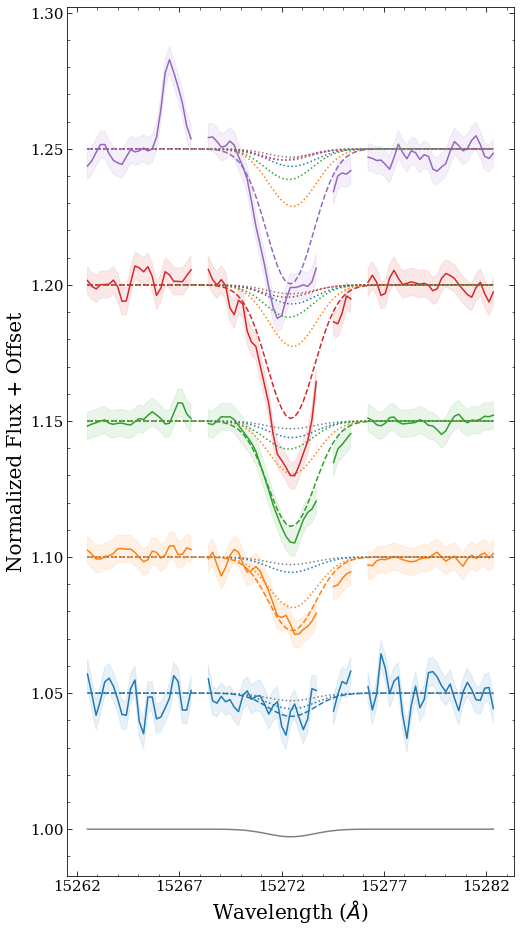

N 28
ndim 6
nstars 5
medians shape (36,)
med_velo shape (6,)
med_dAV_dd shape (5, 6)
order_inds [0 1 2 3 4]
signal_recreated.shape (5, 95)
0
1
2
3
4


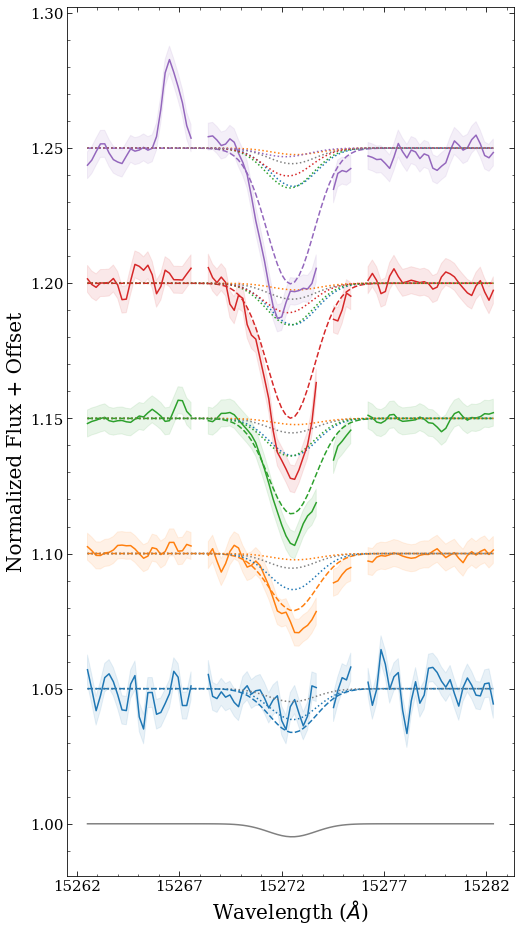

N 29
ndim 6
nstars 5
medians shape (36,)
med_velo shape (6,)
med_dAV_dd shape (5, 6)
order_inds [0 1 2 3 4]
signal_recreated.shape (5, 95)
0
1
2
3
4


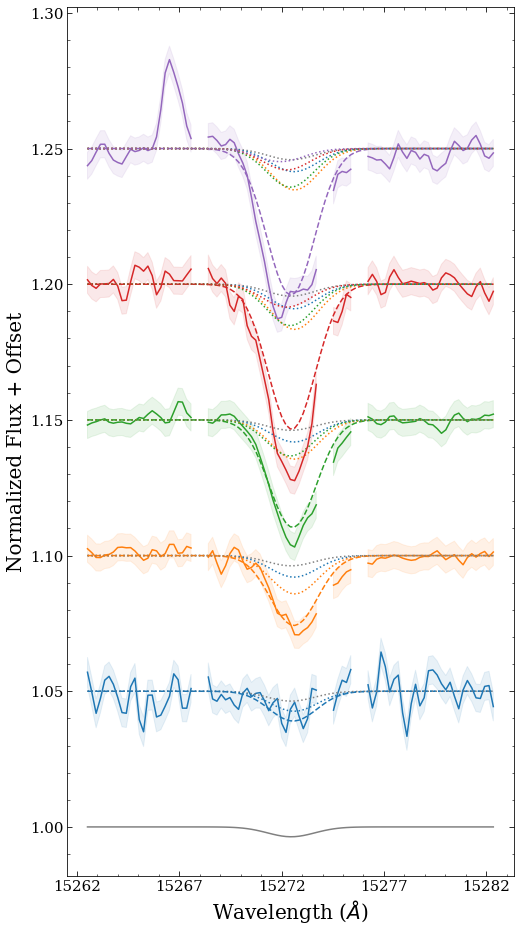

N 30
ndim 6
nstars 5
medians shape (36,)
med_velo shape (6,)
med_dAV_dd shape (5, 6)
order_inds [0 1 2 3 4]
signal_recreated.shape (5, 95)
0
1
2
3
4


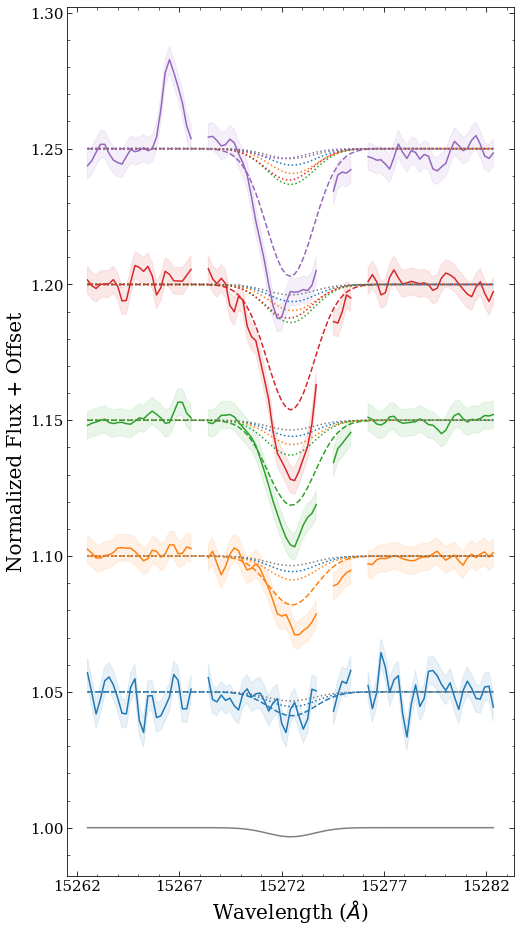

N 31
ndim 6
nstars 5
medians shape (36,)
med_velo shape (6,)
med_dAV_dd shape (5, 6)
order_inds [0 1 2 3 4]
signal_recreated.shape (5, 95)
0
1
2
3
4


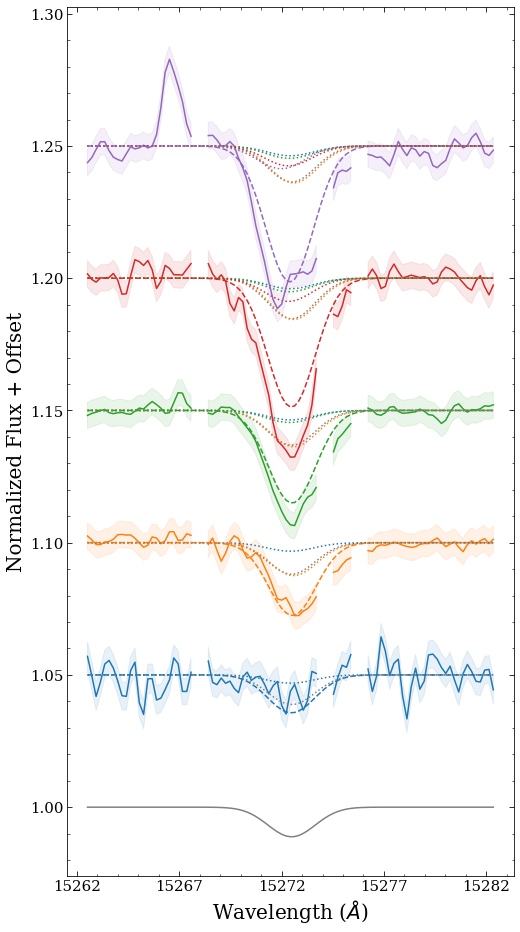

N 32
ndim 6
nstars 5
medians shape (36,)
med_velo shape (6,)
med_dAV_dd shape (5, 6)
order_inds [0 1 2 3 4]
signal_recreated.shape (5, 95)
0
1
2
3
4


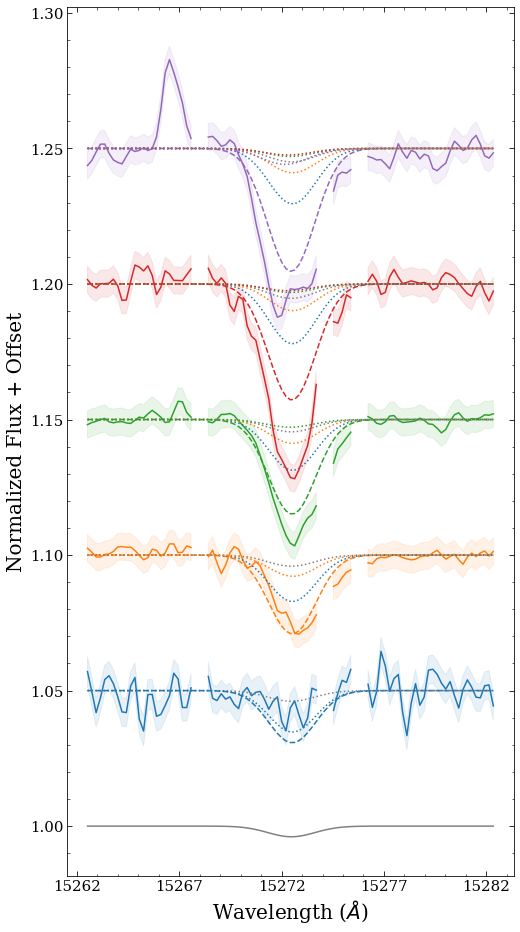

N 33
ndim 6
nstars 5
medians shape (36,)
med_velo shape (6,)
med_dAV_dd shape (5, 6)
order_inds [0 1 2 3 4]
signal_recreated.shape (5, 95)
0
1
2
3
4


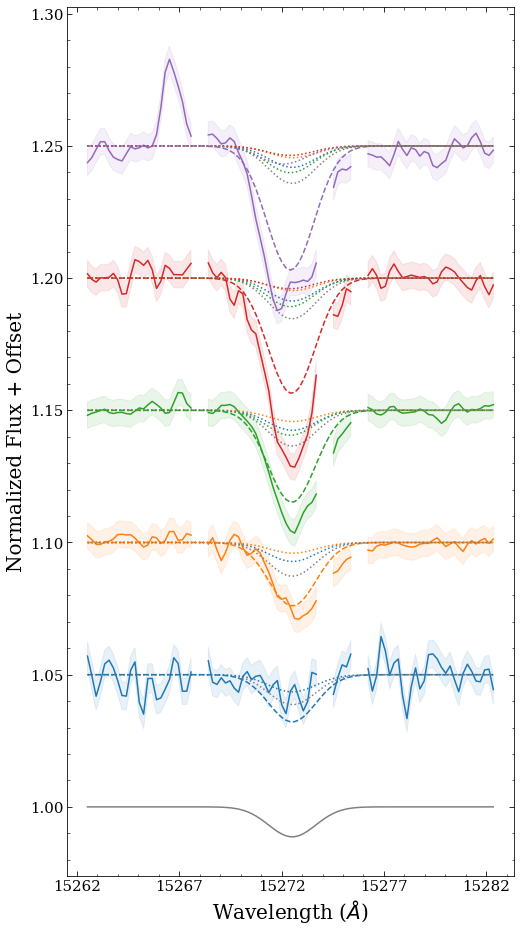

N 34
ndim 6
nstars 5
medians shape (36,)
med_velo shape (6,)
med_dAV_dd shape (5, 6)
order_inds [0 1 2 3 4]
signal_recreated.shape (5, 95)
0
1
2
3
4


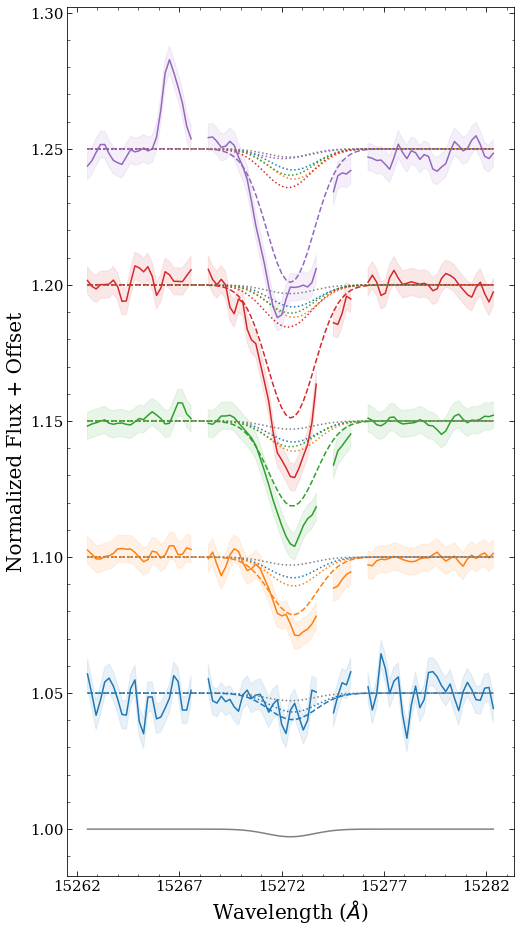

N 35
ndim 6
nstars 5
medians shape (36,)
med_velo shape (6,)
med_dAV_dd shape (5, 6)
order_inds [0 1 2 3 4]
signal_recreated.shape (5, 95)
0
1
2
3
4


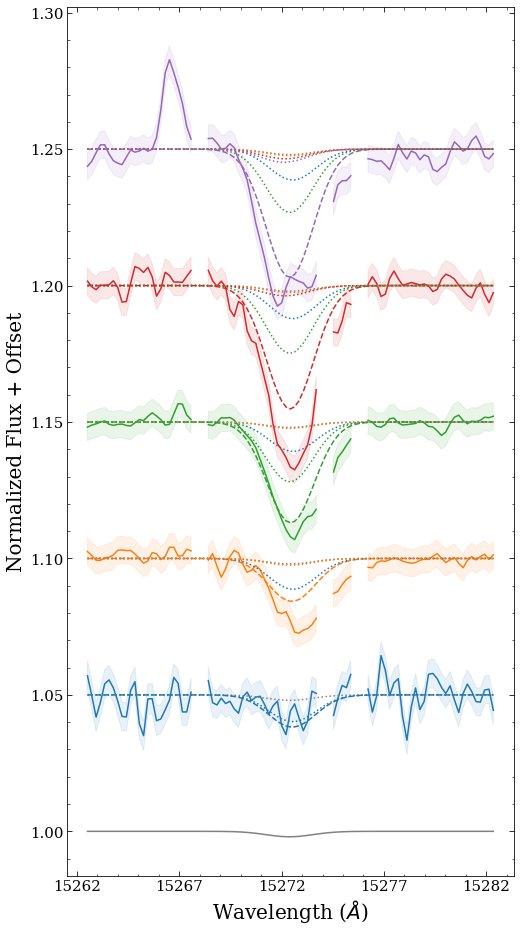

N 36
ndim 6
nstars 5
medians shape (36,)
med_velo shape (6,)
med_dAV_dd shape (5, 6)
order_inds [0 1 2 3 4]
signal_recreated.shape (5, 95)
0
1
2
3
4


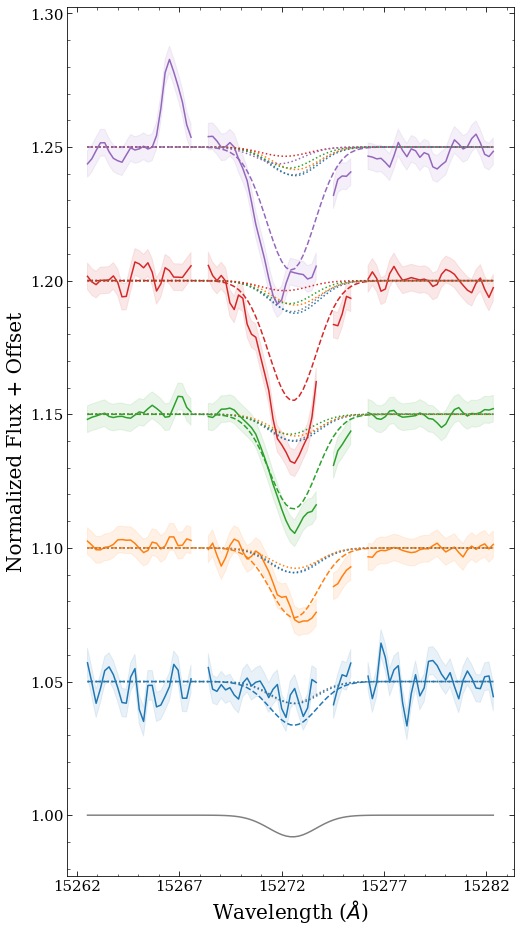

N 37
ndim 6
nstars 5
medians shape (36,)
med_velo shape (6,)
med_dAV_dd shape (5, 6)
order_inds [0 1 2 3 4]
signal_recreated.shape (5, 95)
0
1
2
3
4


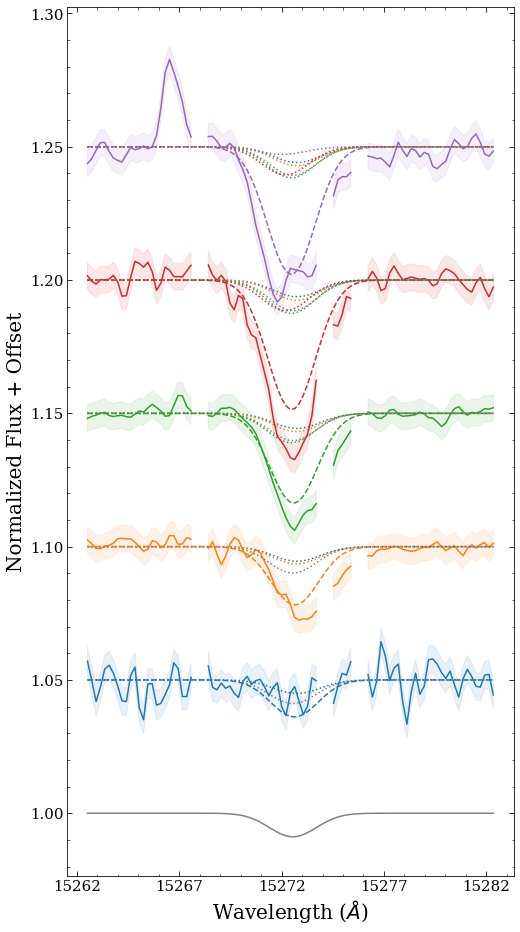

N 38
ndim 6
nstars 5
medians shape (36,)
med_velo shape (6,)
med_dAV_dd shape (5, 6)
order_inds [0 1 2 3 4]
signal_recreated.shape (5, 95)
0
1
2
3
4


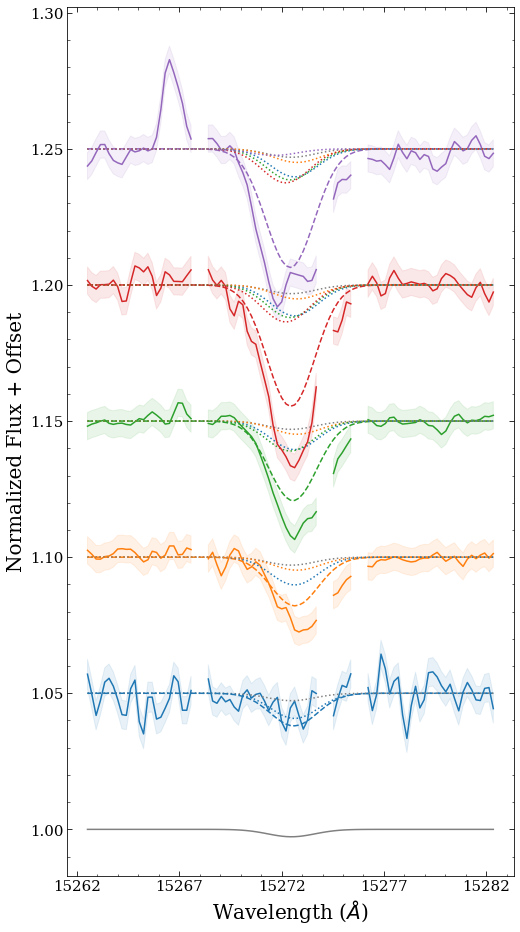

N 39
ndim 6
nstars 5
medians shape (36,)
med_velo shape (6,)
med_dAV_dd shape (5, 6)
order_inds [0 1 2 3 4]
signal_recreated.shape (5, 95)
0
1
2
3
4


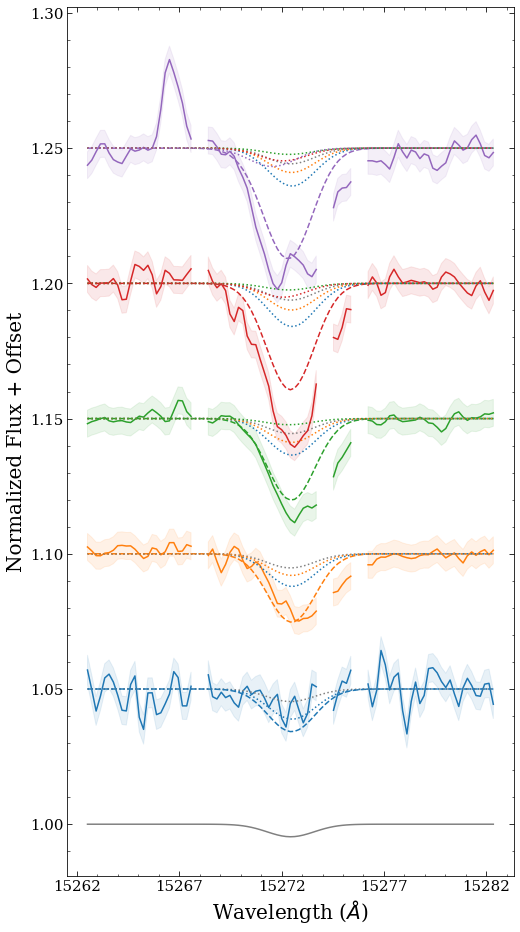

In [ ]:
def model_signals_fg(rvelo, sl, dAVdd):
    # dAVdd = sl.dAVdd
    voxeldiffDIB = np.zeros((len(sl.stars), len(wavs_window)))
    unsummed_signals = np.zeros((len(sl.stars), len(sl.bins)-1,len(wavs_window)))
    # unsummed_signals = np.zeros((len(sl.bins)-1, len(sl.bins)-1,len(wavs_window)))

#     print(voxeldiffDIB.shape, unsummed_signals.shape, sl.dAVdd.shape)
    peak_wavelength = dopplershift(rvelo)
    wavs_grid = np.tile(wavs_window, (len(sl.bins) - 1, 1))
    voxel_DIB_unscaled = np.exp(-(wavs_grid - peak_wavelength[:, np.newaxis])**2 / (2 * sigma0**2))
    amp = differentialAmplitude(dAVdd, sl.bins[1:]-sl.bins[:-1])

    def single_signal(amp, bindex):

        amp[bindex:] = 0 # THIS MIGHT NEED TO BE -1
        # print(amp)

        voxel_DIB_scaled = -voxel_DIB_unscaled *  amp[:, np.newaxis] 
        summed_DIB = np.sum(voxel_DIB_scaled, axis = 0)
        # continuum = lambda x, m, b : m * (x - lambda0) + b
        # cont = continuum(wavs_window, 0, b)
        return summed_DIB  + 1, voxel_DIB_scaled 

    fgdiffDIB = np.zeros((len(sl.stars), len(wavs_window)))
    

    for i in range(len(sl.stars)): # Iterate over each star in dAVdd array
#         print(dAVdd)
        dAVdd_bin = dAVdd[i, :] 

        amp = differentialAmplitude(dAVdd_bin, 1)

        bin_index = np.concatenate([sl.bin_inds]).astype(int)[i] # this only goes to 
        # signals[i, :] = single_signal(bin_index)
        voxeldiffDIB[i, :], unsummed_signals[i, :, :] = single_signal(amp, bin_index)
        fgdiffDIB[i, :], _ = single_signal(amp, 1)


    return voxeldiffDIB, unsummed_signals, fgdiffDIB

def plot_DIBS_fg(chain, sl, plot_objs = None, bestprob = False, lnprob = None):
    if plot_objs == None:
        fig, ax = plt.subplots(figsize = (8, 16))
    else:
        fig, ax = plot_objs

    ndim = len(sl.voxel_dAVdd)
    print('ndim', ndim)
    nstars = len(sl.stars)
    print('nstars', nstars)

    samples = chain[:, :, :].reshape((-1, chain.shape[-1]))

    medians = np.nanmedian(samples[-100:, :], axis = 0)
    print('medians shape', medians.shape)

    ## NEW THING
    if bestprob:
        lp =lnprob
        lp[:, :-100] = -np.infty
        w_ind, stp_ind = np.unravel_index(np.argmax(lp), lp.shape)

        medians = chain[w_ind, stp_ind, :]

    med_velo = medians[:ndim]

    med_dAV_dd = medians[ndim:].reshape(-1, ndim)
#     print(med_dAV_dd)
    print('med_velo shape', med_velo.shape)
    print('med_dAV_dd shape', med_dAV_dd.shape)
    # med_dAV_dd = np.tile(med_dAV_dd, len(sl.stars)).reshape(len(sl.stars), -1)

    order_inds = np.array(np.argsort(sl.stars['DIST']))
    # order_inds = (np.array(np.argsort(sl.stars['DIST'])))
    print('order_inds', order_inds)

    signal_recreated, signal_recreated_unsummed, fg_dibs = model_signals_fg(med_velo, sl, med_dAV_dd) 

    print('signal_recreated.shape', signal_recreated.shape)


    ax.plot(wavs[window], fg_dibs[0, :], linestyle = 'solid', color ='grey')

    for i in range(len(order_inds)):
        ii = order_inds[i]
        print(ii)
        offset_i = i+1

        # signal_recreated_here = sl.model_signals(med_velo[i], dAVdd = med_dAV_dd[i, :])

        ax.plot(wavs_window, sl.signals[ii, :] + 0.05 * offset_i, color = 'C{}'.format(i))
        ax.fill_between(wavs_window, sl.signals[ii, :] + sl.signal_errs[ii, :] + 0.05 * offset_i,
                         sl.signals[ii, :] - sl.signal_errs[ii, :] + 0.05 * offset_i, color = 'C{}'.format(i), alpha = 0.1)

        ax.plot(wavs_window, signal_recreated[ii, :] + 0.05 * offset_i , color = 'C{}'.format(i), linestyle = 'dashed',)# label = 'recreated signal')

        for j in range(len(sl.bins)-1):
            if j==0:
                col = 'grey'
            else:
                col = 'C{}'.format(j-1)
            if j > i+1:
                continue
            ax.plot(wavs_window, signal_recreated_unsummed[ii, j, : ] + 1  + 0.05 * offset_i, color=col, linestyle = 'dotted', alpha = 1)

    # ax.legend(loc = 'lower left', fontsize = 20)

    ax.set_xlabel('Wavelength ($\AA$)', fontsize = 20)
    ax.set_ylabel('Normalized Flux + Offset', fontsize = 20)
    fig.set_facecolor('white')

    # ax.set_xticks(np.arange(lambda0-10, lambda0 + 12, 4))
    ax.set_xticks(np.linspace(15272-10, 15272 + 10, 5))

    # ax.set_yticklabels('')

    return signal_recreated, sl.signals, sl.signal_errs

chi2s = np.zeros(len(sightlines))
sl_lensignals = np.zeros(len(sightlines))

recreated_signals = []

for i in range(len(sightlines)):
    print('N', i)
    fig, ax = plt.subplots(figsize = (8, 16))

    sl_i = sightlines[i]
    sl_lensignals[i] = sl_i.nsig
    chain_i = chains[i]
    lp_i = probabilities[i]
    reproducedDIBs, realDIBs, realDIBerrs = plot_DIBS_fg(chain_i, sl_i, plot_objs = (fig, ax), lnprob = lp_i)

    chi2 = np.nansum((realDIBs-reproducedDIBs)**2 / realDIBerrs**2) / np.sum(np.isnan(realDIBs) == False)
    chi2s[i] = chi2

    # ymin, ymax = ax.get_ylim()
    # ax.text(lambda0, ymax - .01, str(chi2))

    # lp_i = sampler_i.lnprobability
    lp_med_i = np.nanmedian(lp_i[:, -100:])
    # ax.text(lambda0, ymax - .01, 'sl index {}'.format(i) )
    # ax.text(lambda0, ymax - .015, 'lnprob {}'.format(lp_med_i) )

    name_i = 'dibs_' + str(i)
#     fig.savefig('RUNS_H5/figures_0602a/0602a_DIBmodels/model_sl{}.png'.format(name_i))

    plt.show()

    ### Added 05.13 ###
    recreated_signals.append(reproducedDIBs)


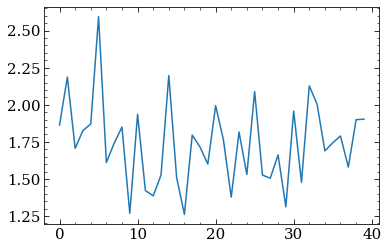

In [ ]:
fig, ax = plt.subplots()
ax.plot(chi2s)

[ 0.   0.   0.   0.   2.5  2.5  2.5  2.5  5.   5.   5.   5.   7.5  7.5
  7.5  7.5 10.  10.  10.  10.  12.5 12.5 12.5 12.5 15.  15.  15.  15.
 17.5 17.5 17.5 17.5 20.  20.  20.  20. ]
[ 0  5 10 25  0  5 10 25  0  5 10 25  0  5 10 25  0  5 10 25  0  5 10 25
  0  5 10 25  0  5 10 25  0  5 10 25]


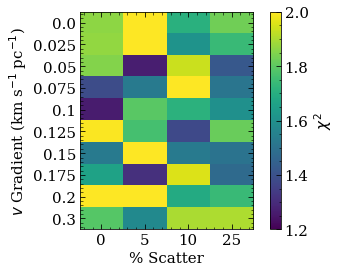

In [ ]:
vv, ss = np.meshgrid(velocity_range, scale_range)
vv = vv.T.flatten()
ss = ss.T.flatten()
print(vv)
print(ss)

fig, ax = plt.subplots()
im = ax.imshow(chi2s.reshape(len(velocity_range)+1,len(scale_range)), cmap = 'viridis', aspect = 0.5, vmin = 1.2, vmax = 2)
ax.set_xlabel(r'% Scatter')
ax.set_ylabel('$v$ Gradient (km s$^{-1}$ pc$^{-1}$)')
ax.set_xticks([0, 1, 2, 3])
ax.set_yticks([0, 1, 2 ,3, 4, 5, 6, 7, 8, 9])
ax.set_xticklabels(scale_range)
ax.set_yticklabels(2 * np.concatenate([velocity_range, [30]]) / 200)
# ax.set_xticks(velocity_range)
# ax.set_yticks(scale_range)
fig.colorbar(im, label = '$\chi^2$')
fig.set_facecolor('white')
plt.show()

In [ ]:
scale_range

[0, 5, 10, 25]

0


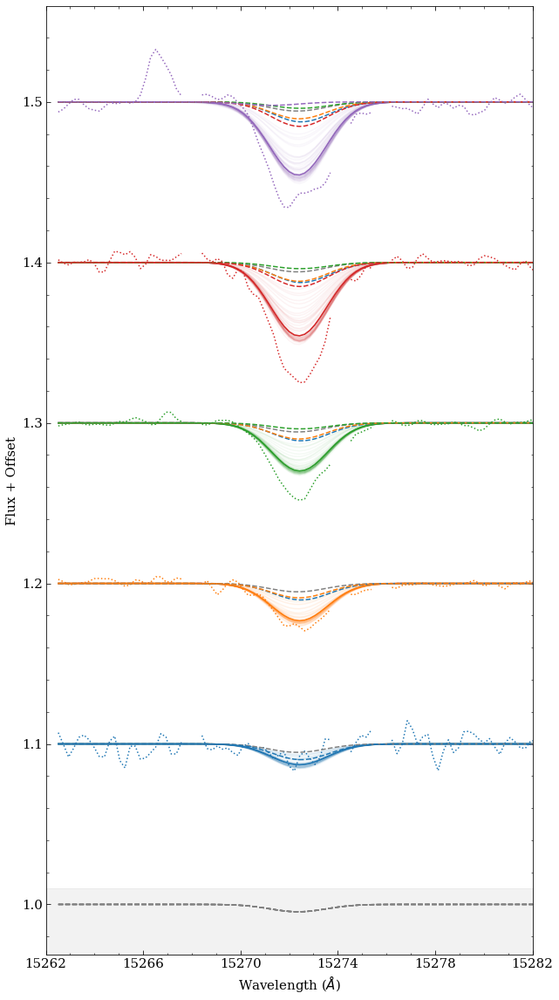

1


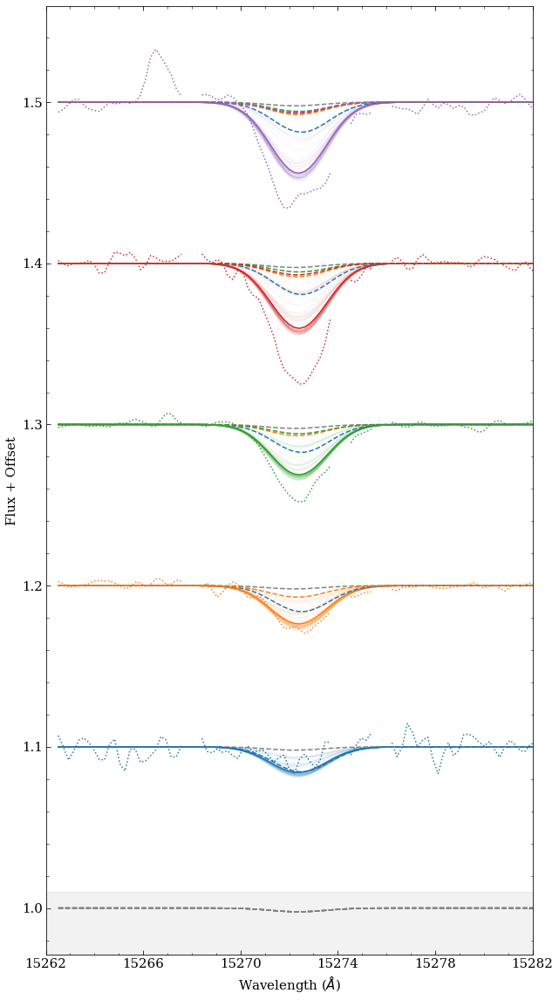

2


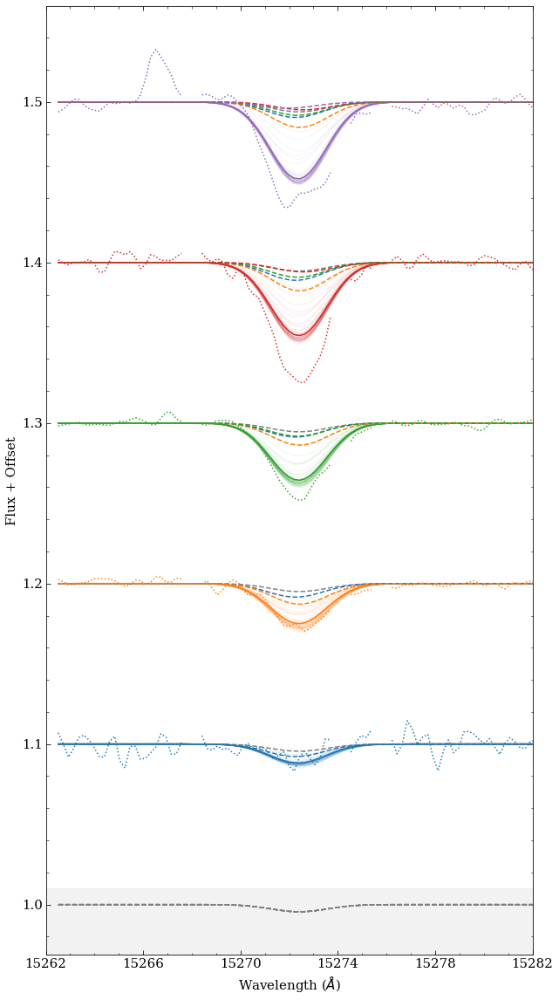

3


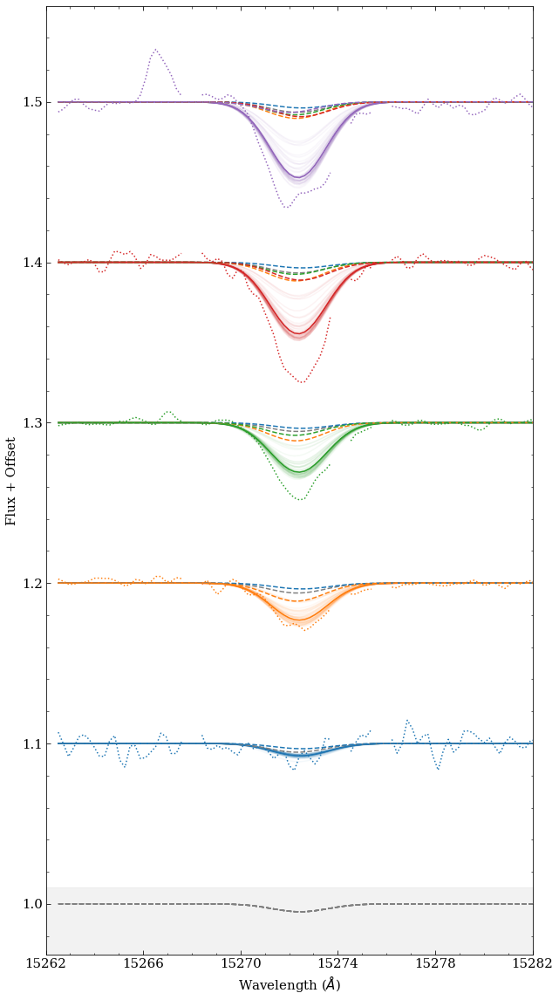

4


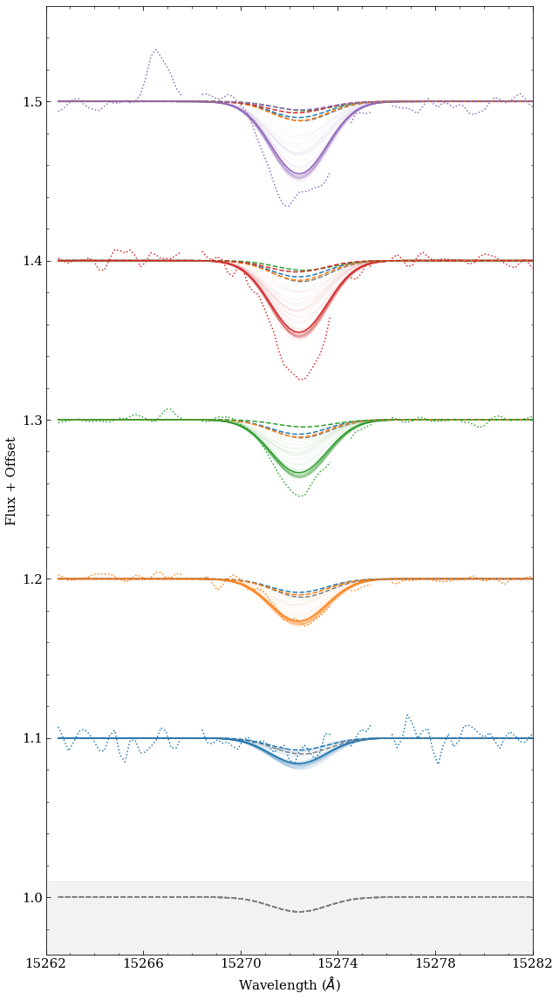

5


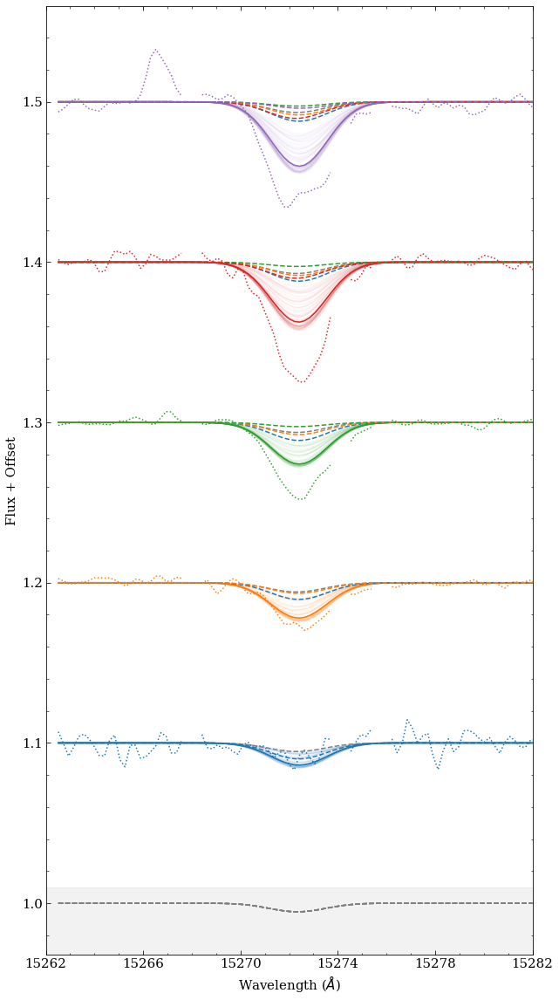

6


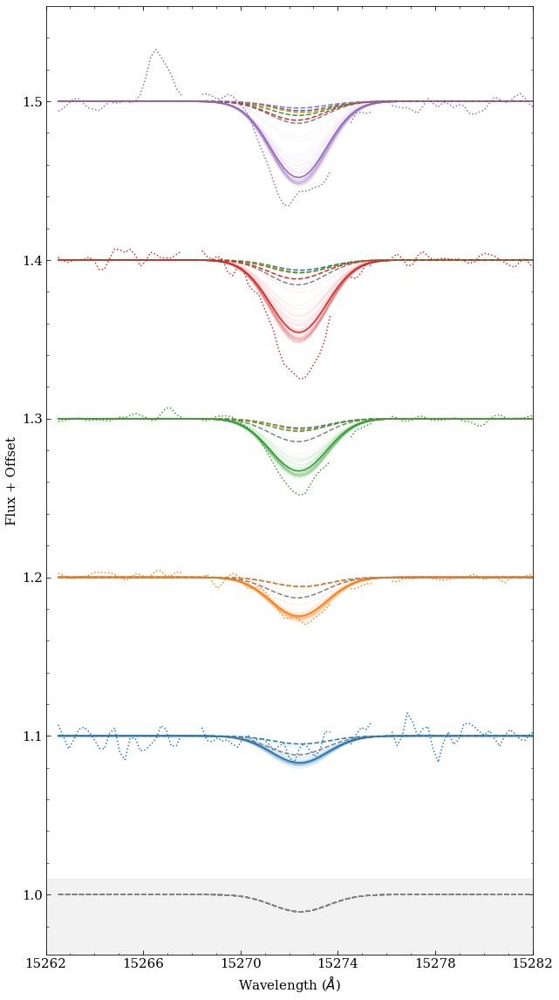

7


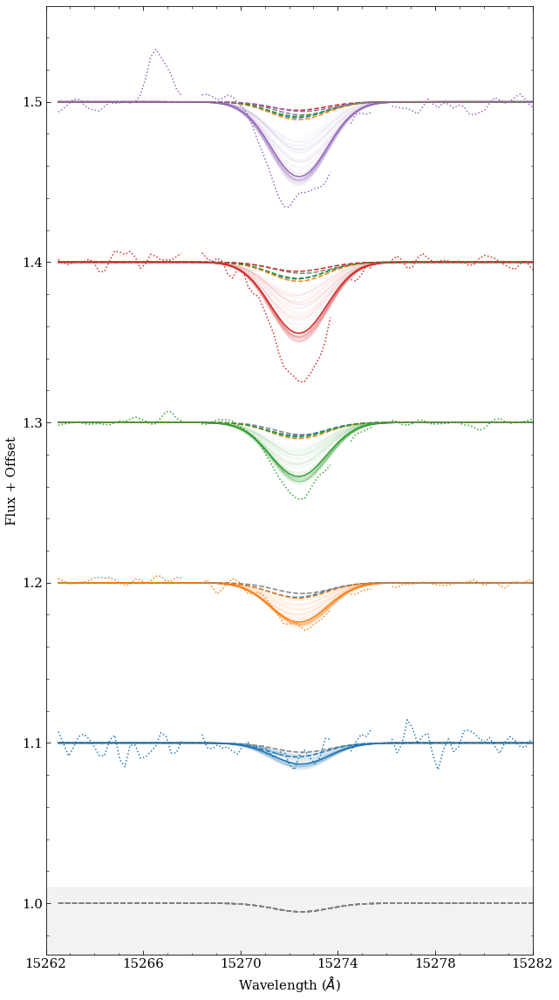

8


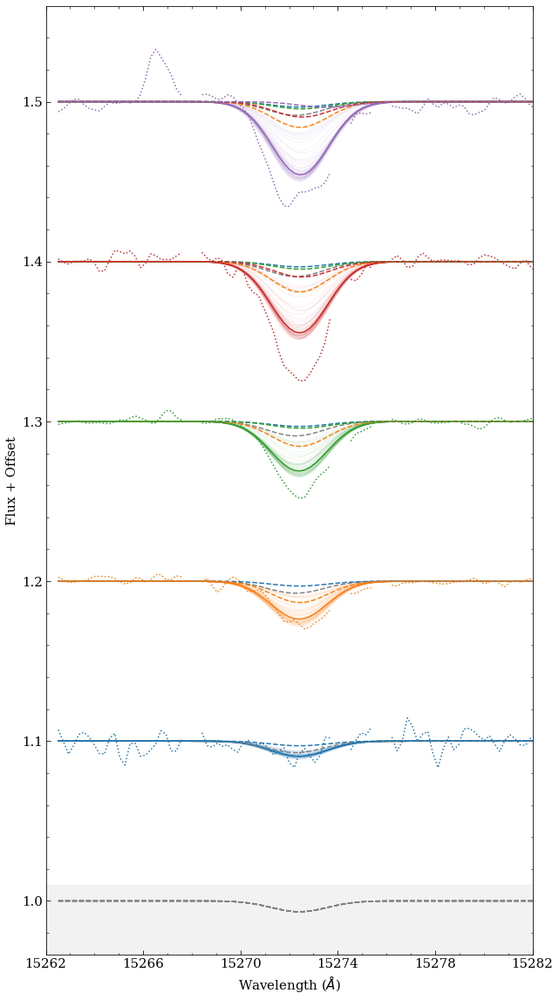

9


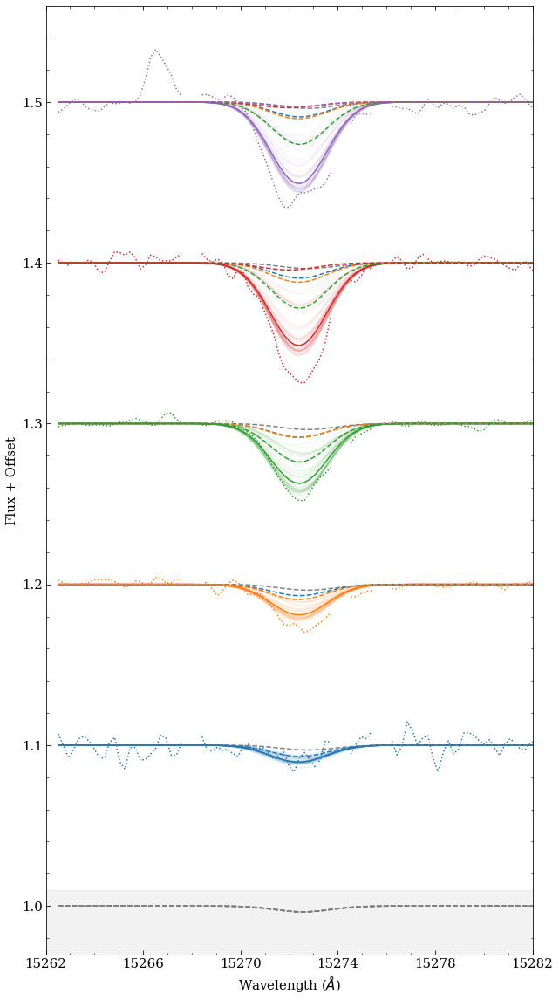

10


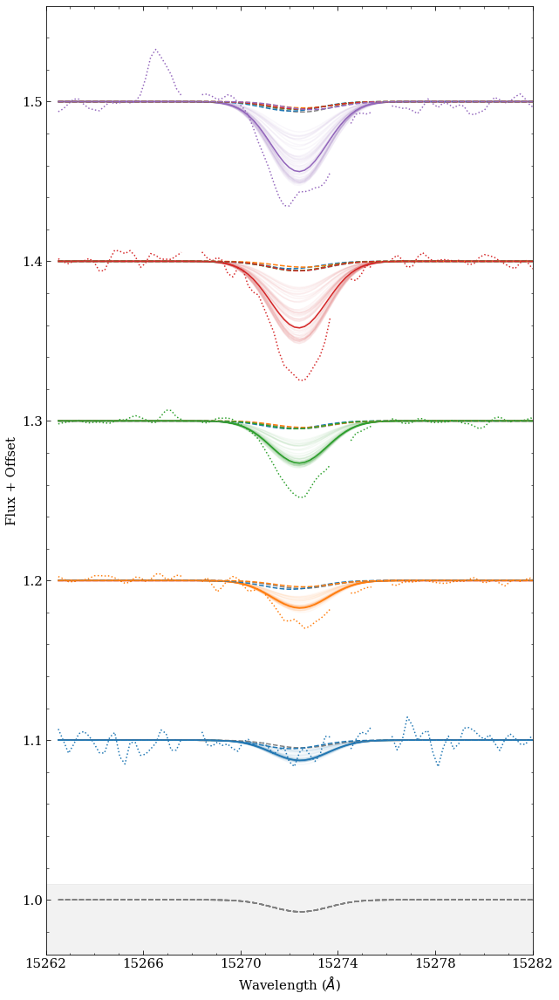

11


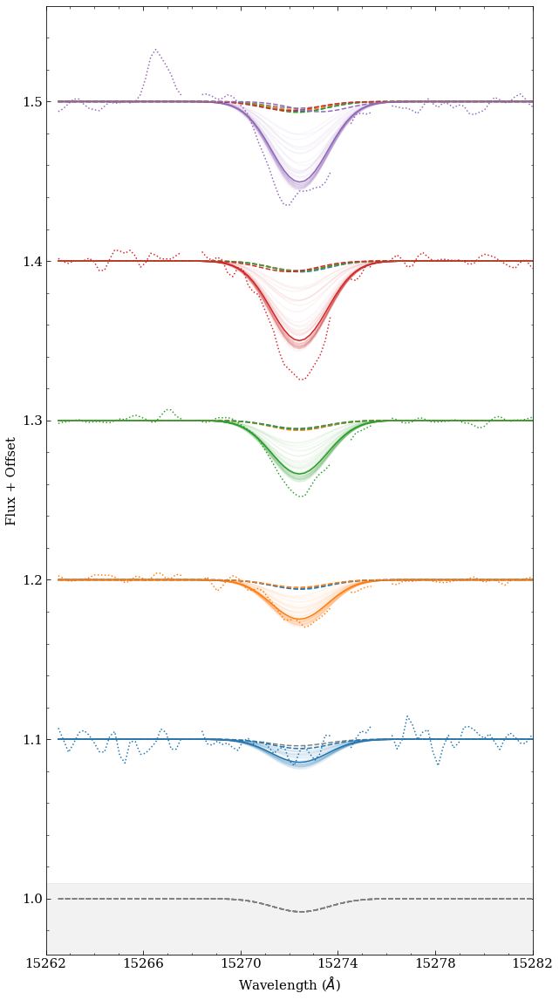

12


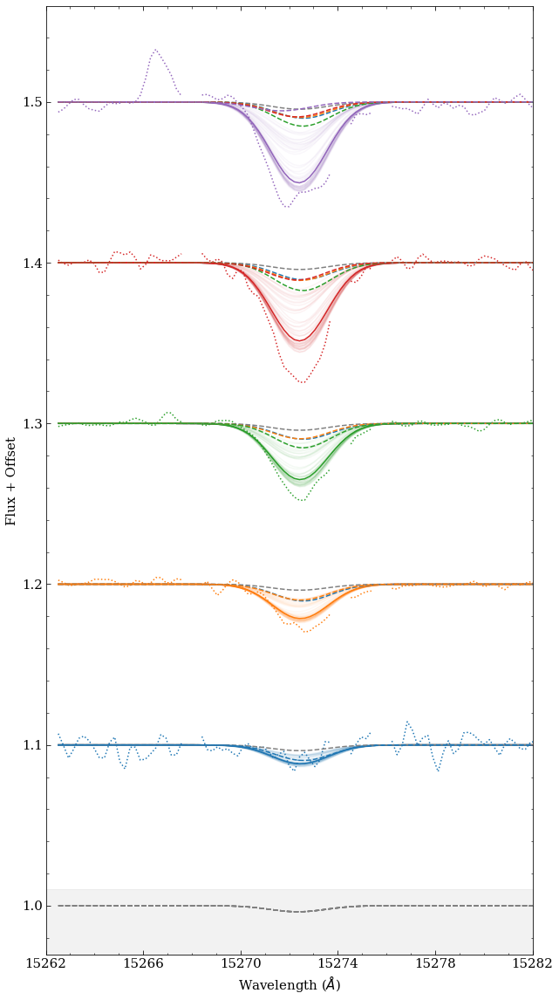

13


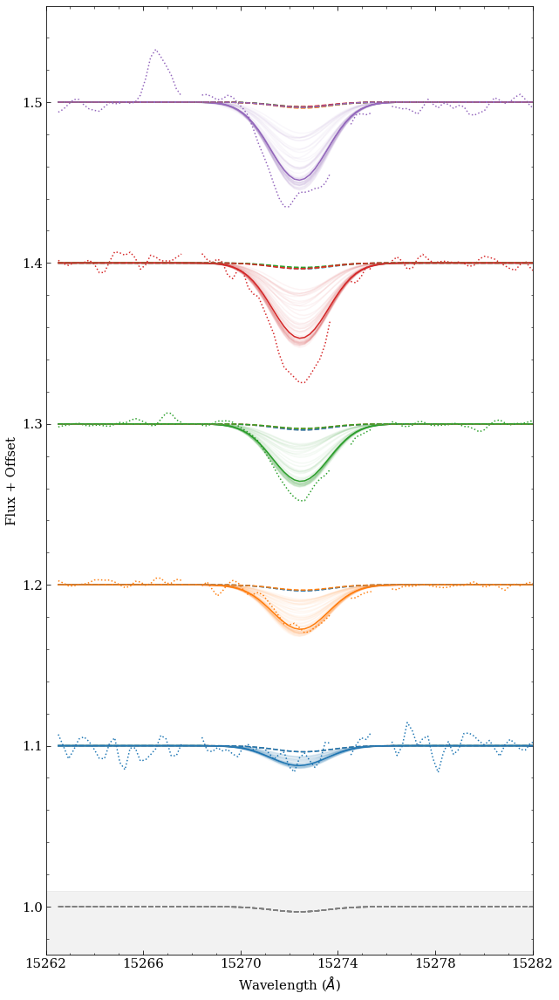

14


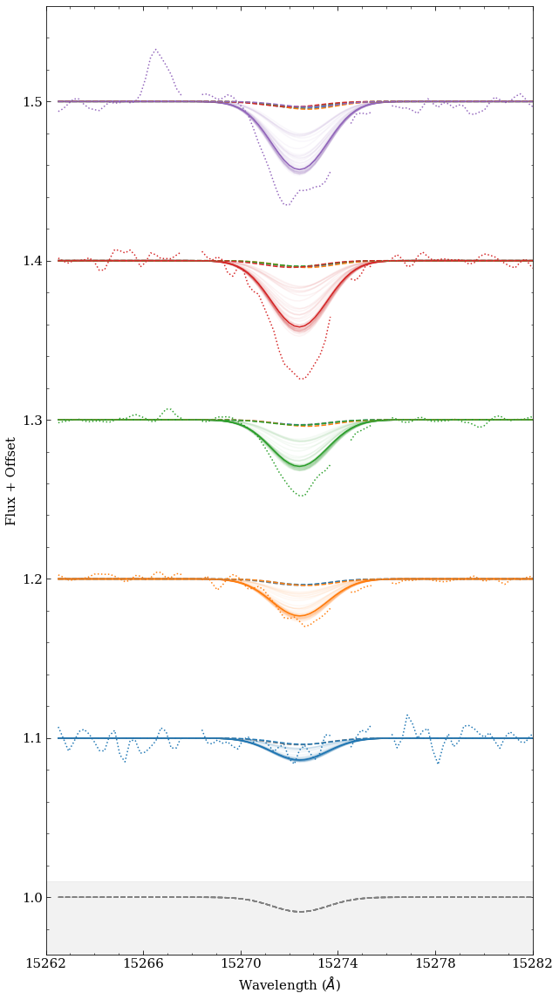

15


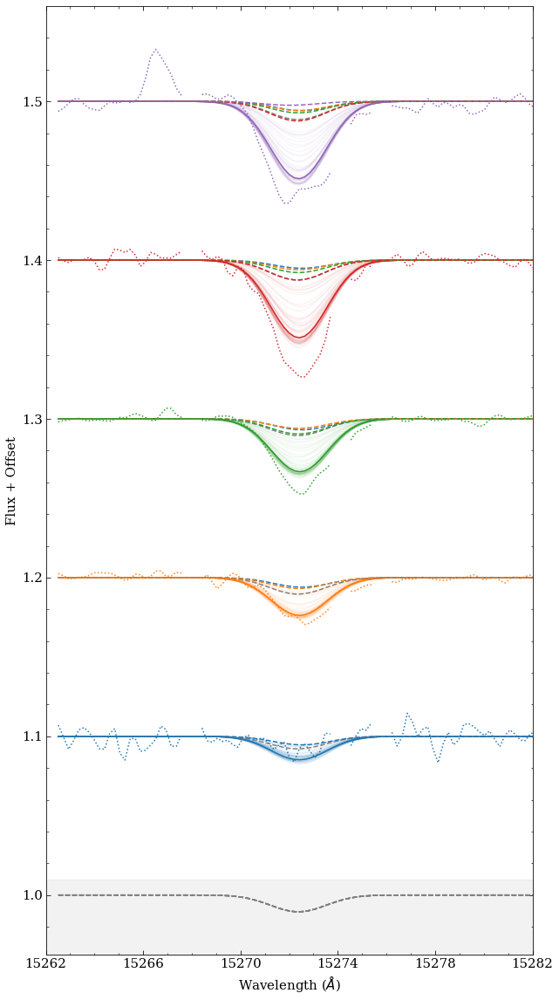

16


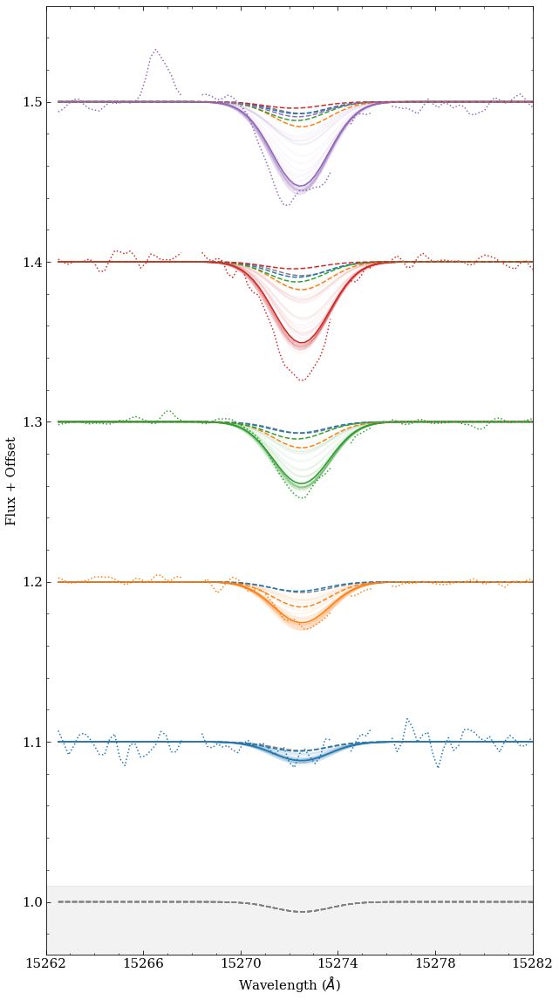

17


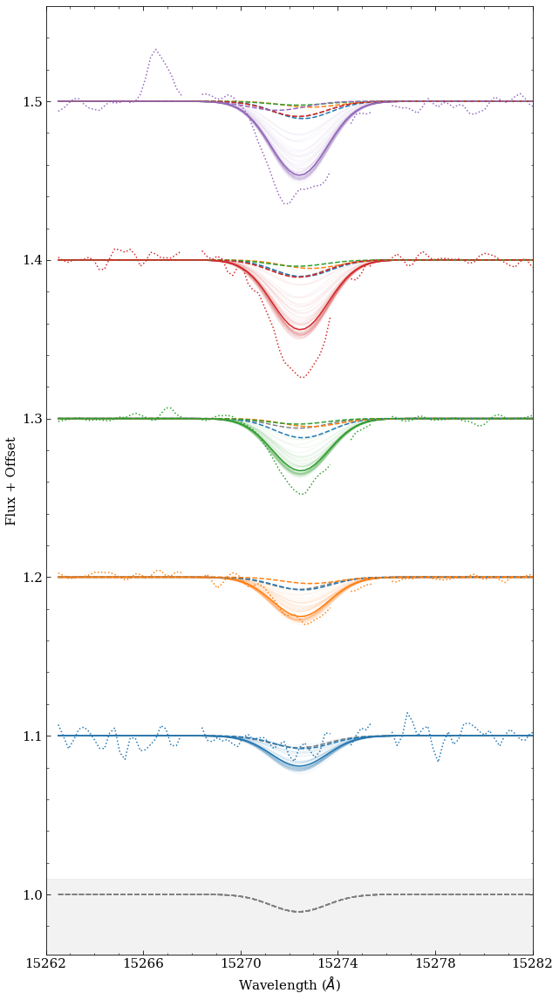

18


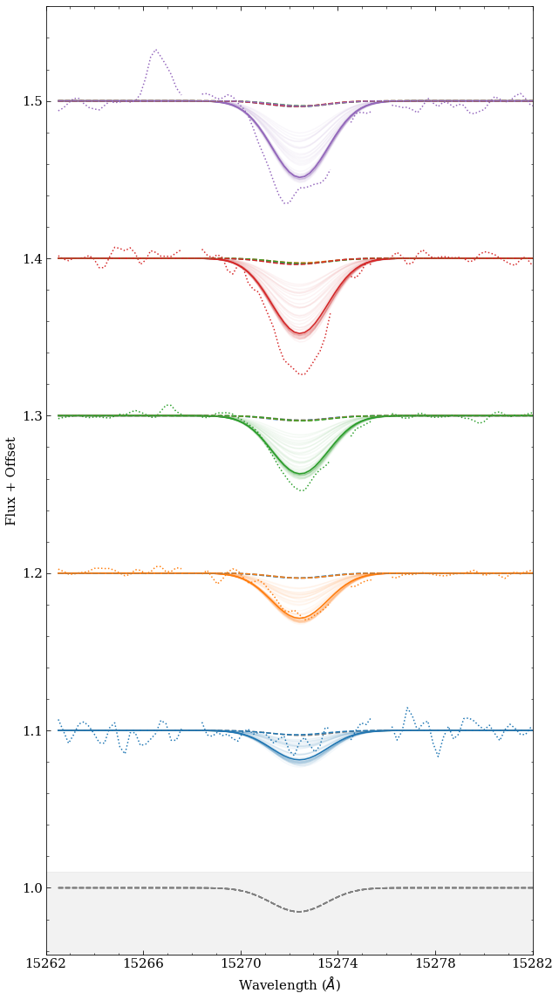

19


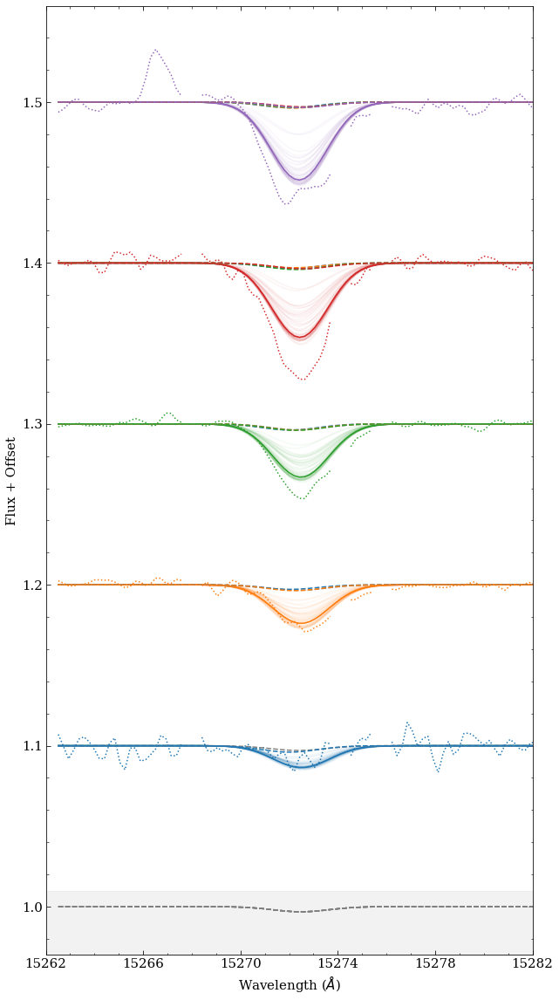

20


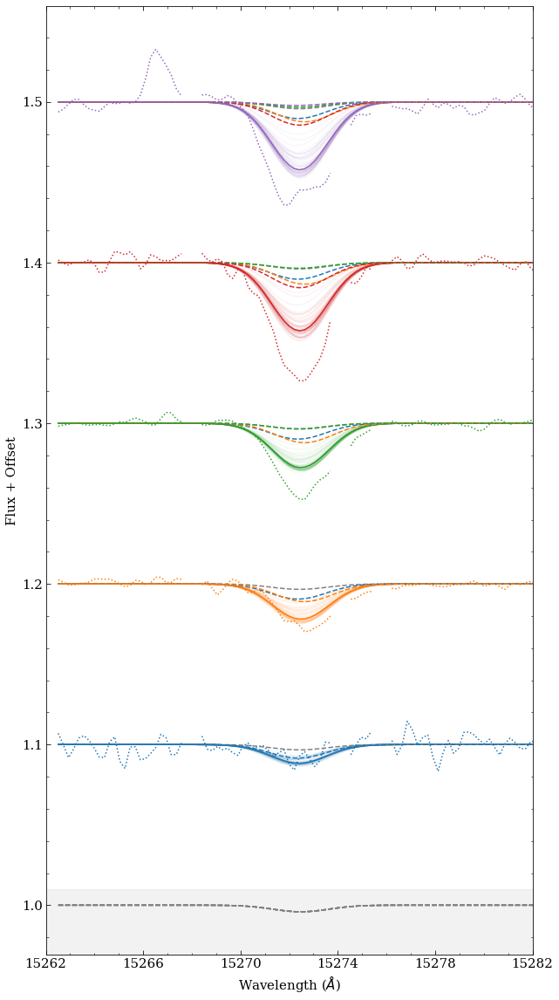

21


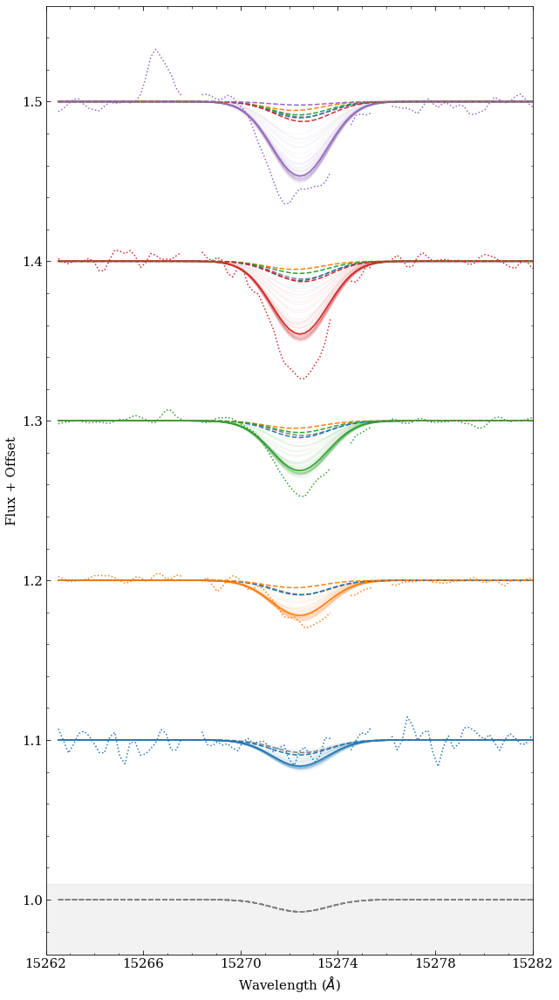

22


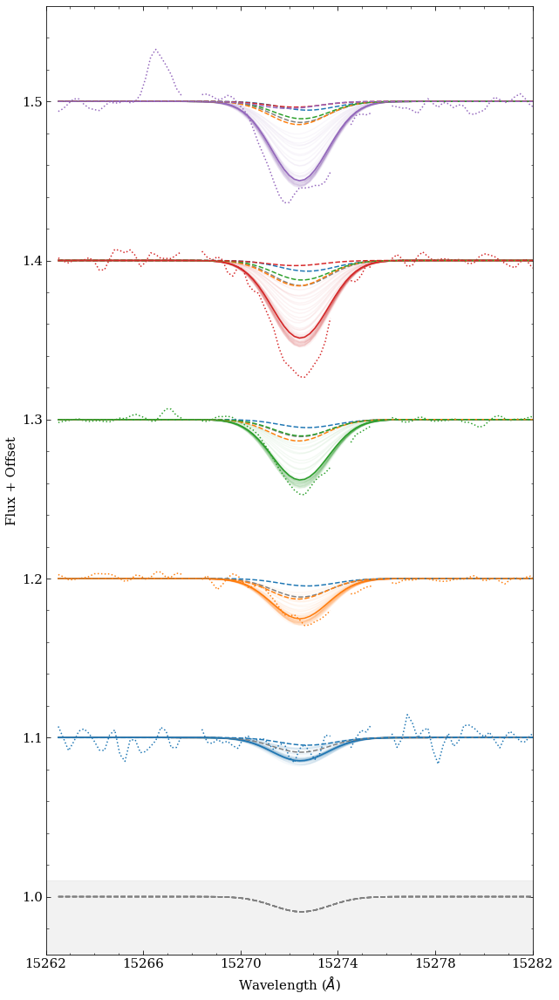

23


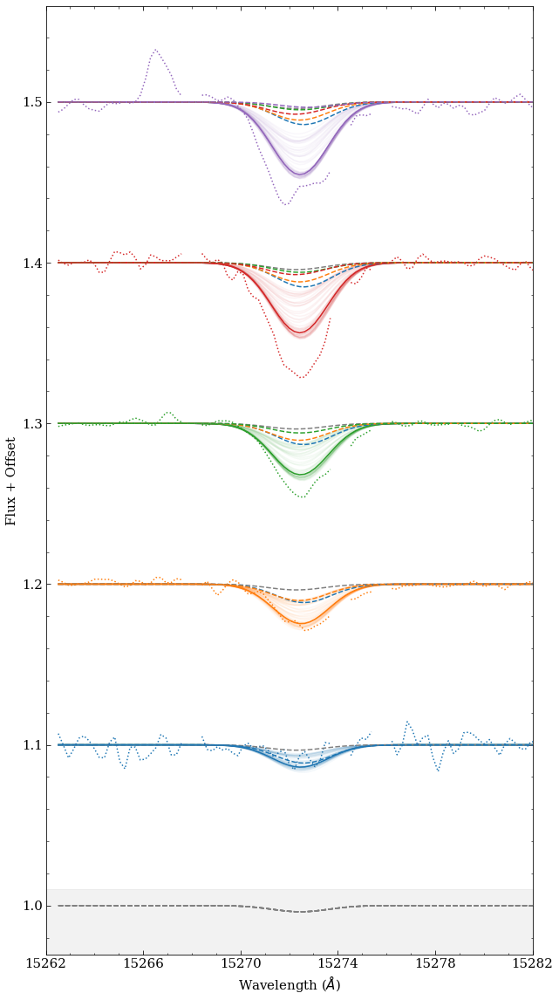

24


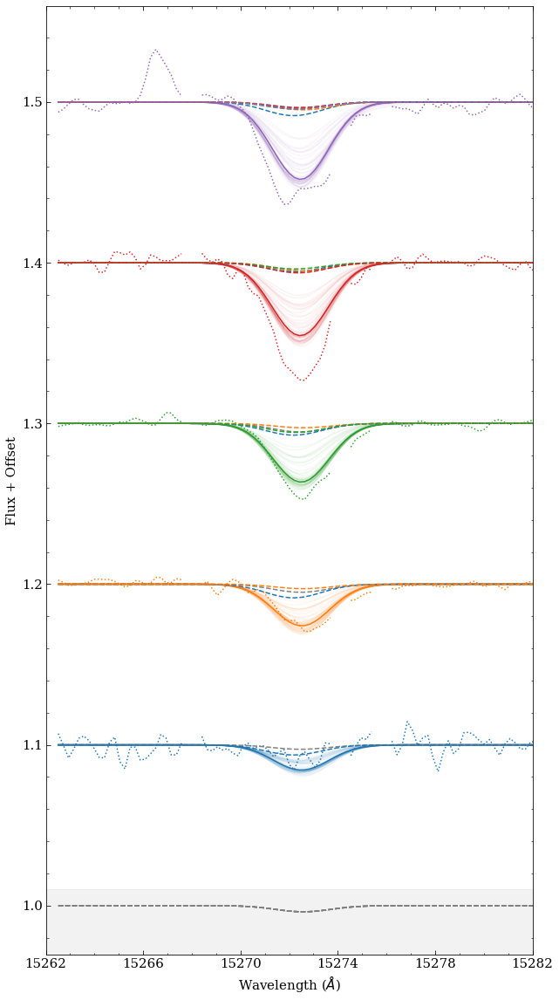

25


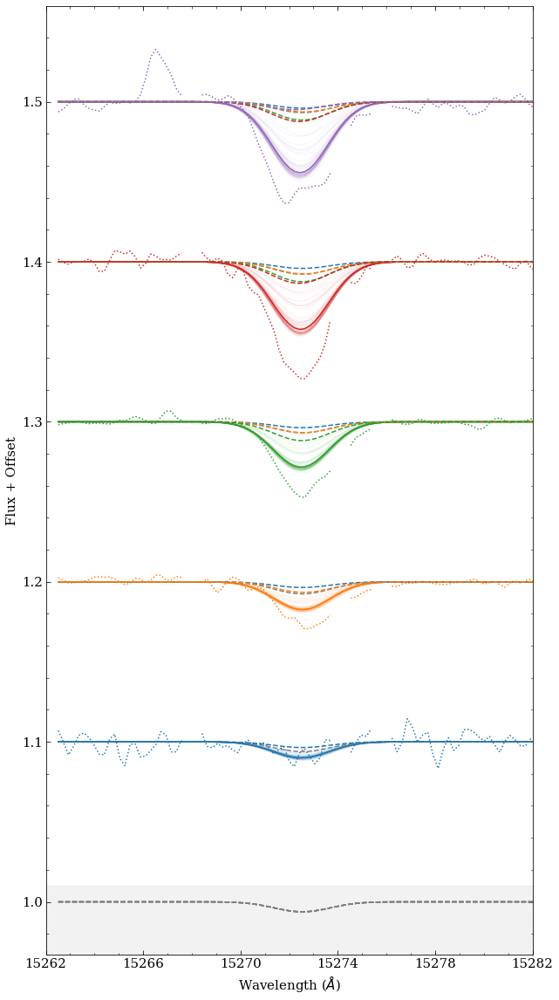

26


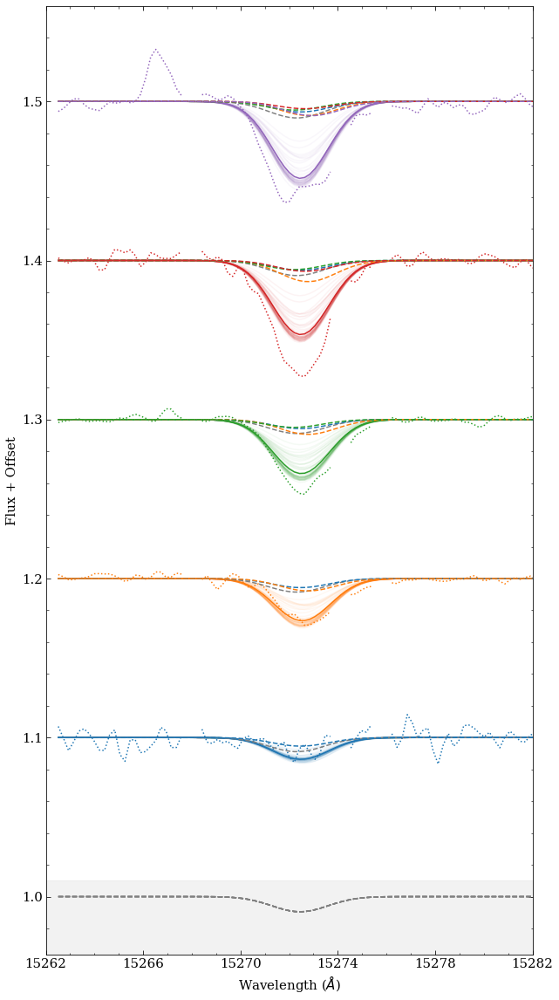

27


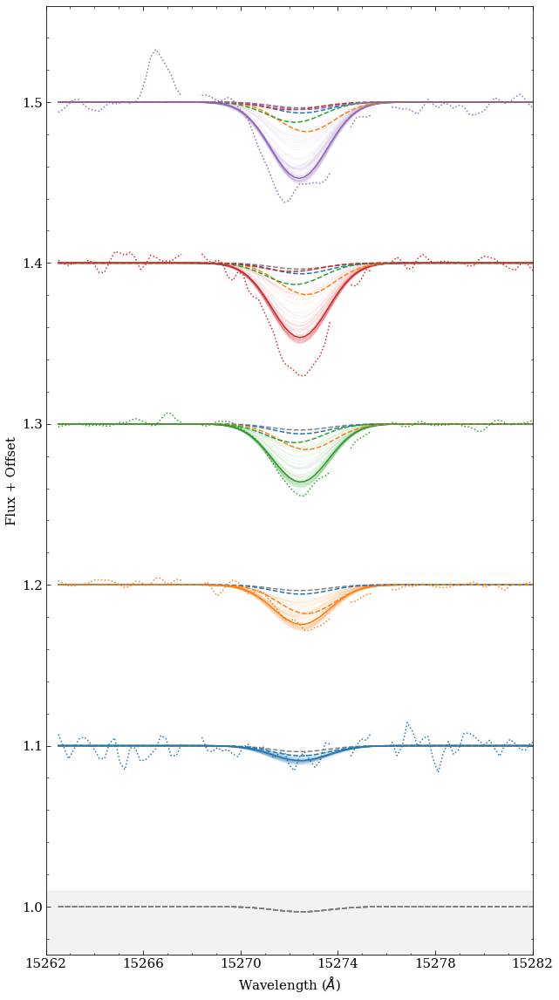

28


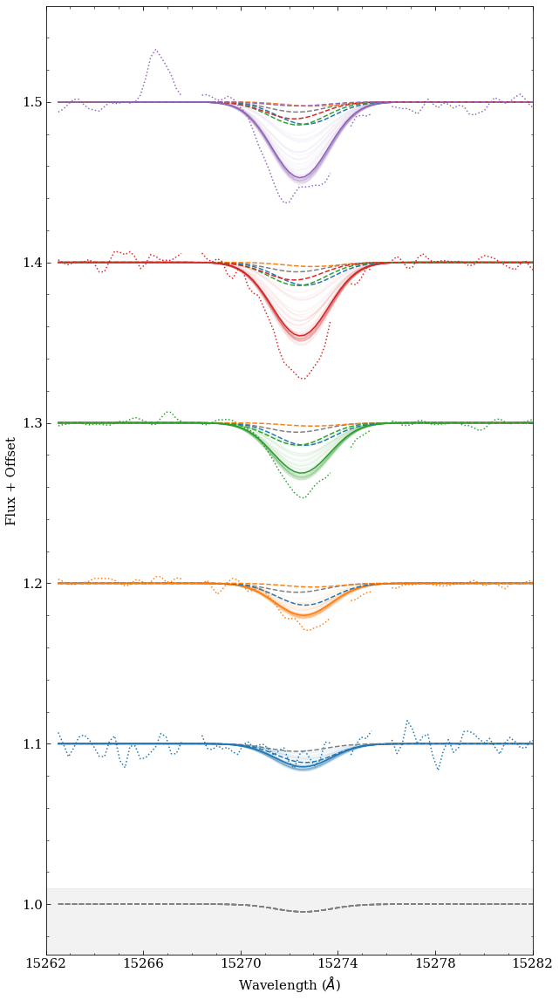

29


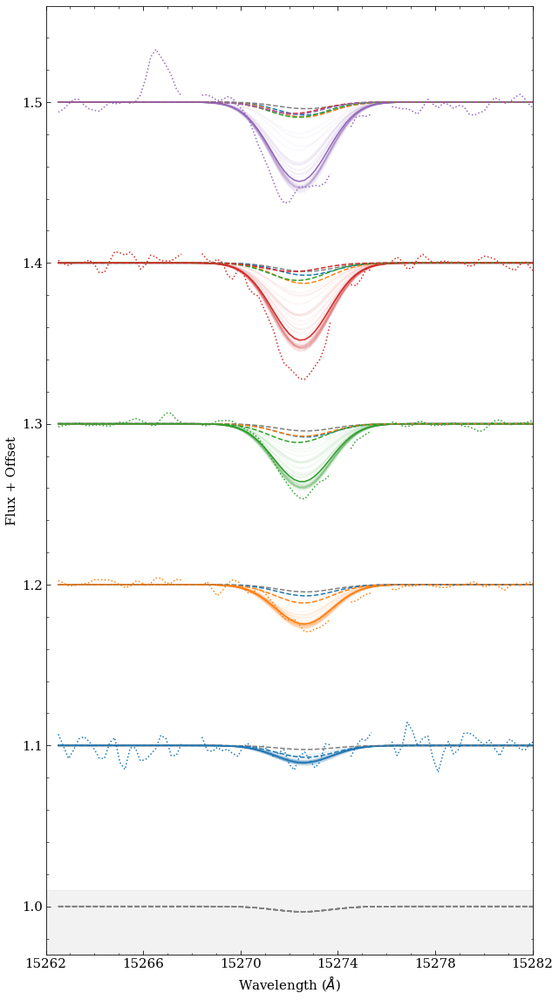

30


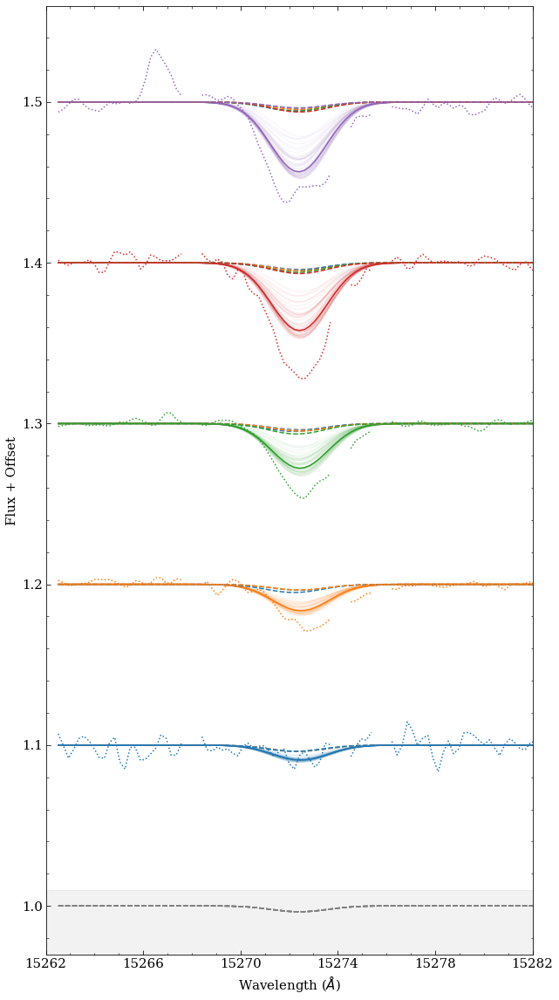

31


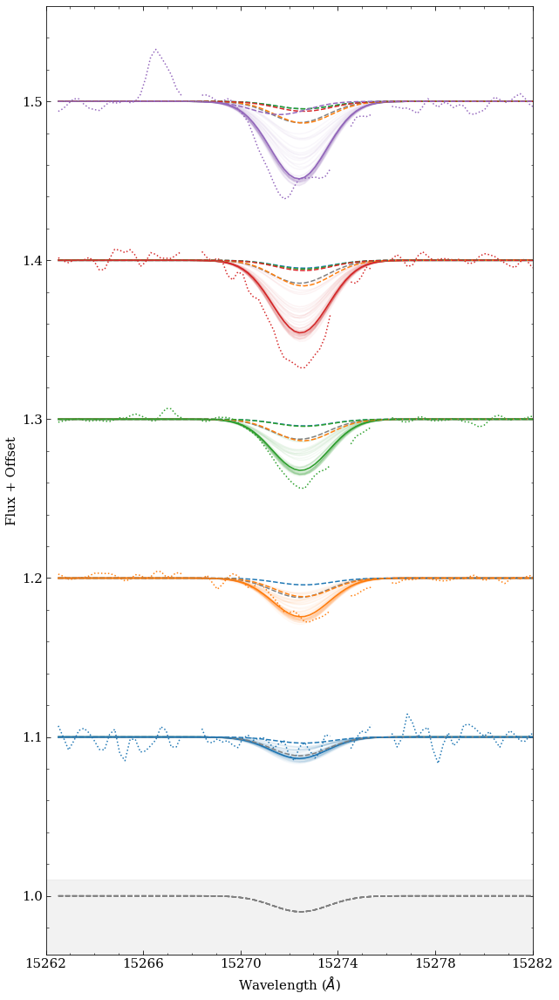

32


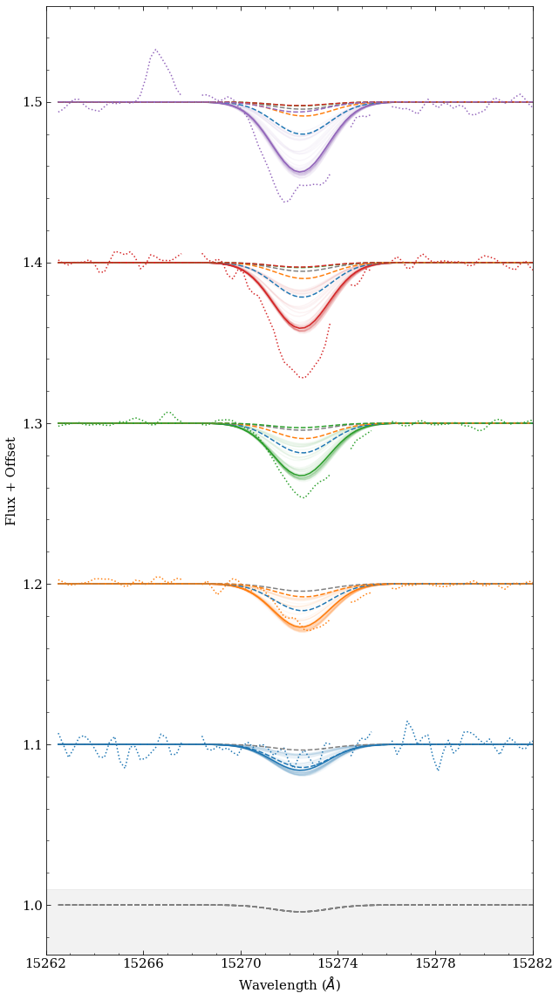

33


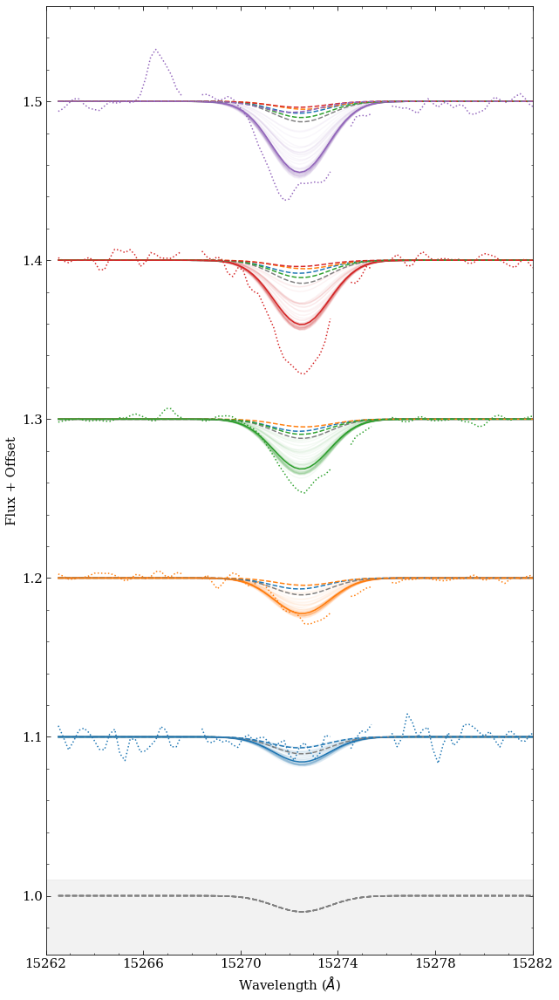

34


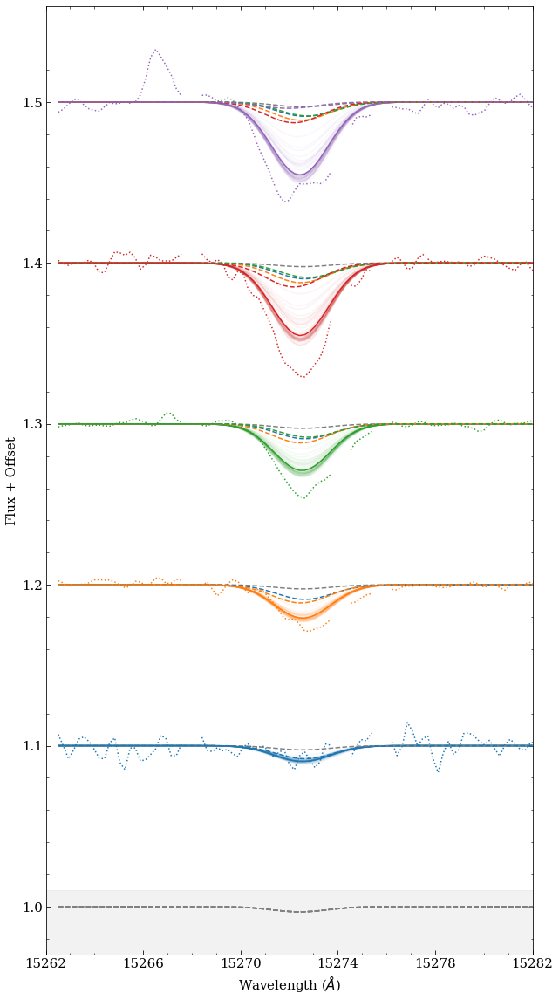

35


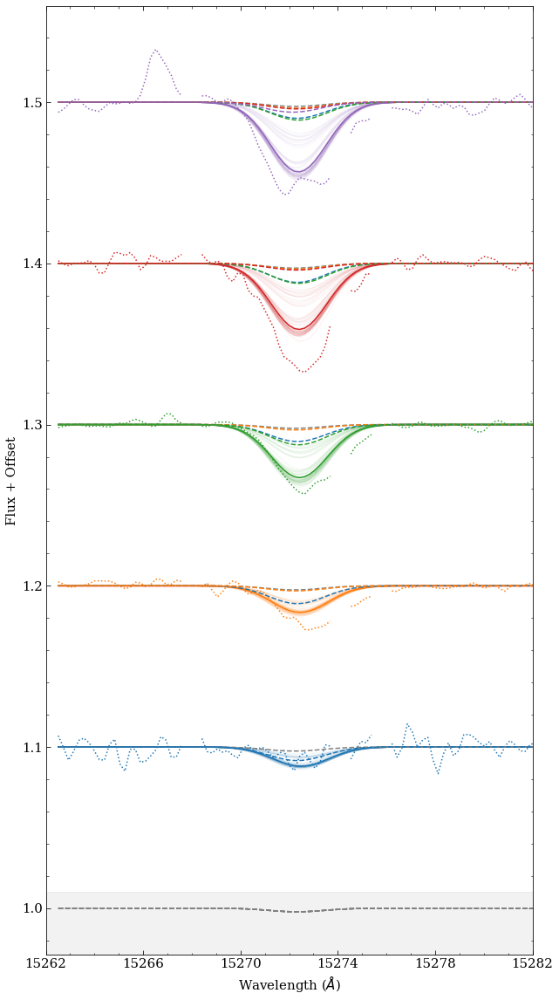

36


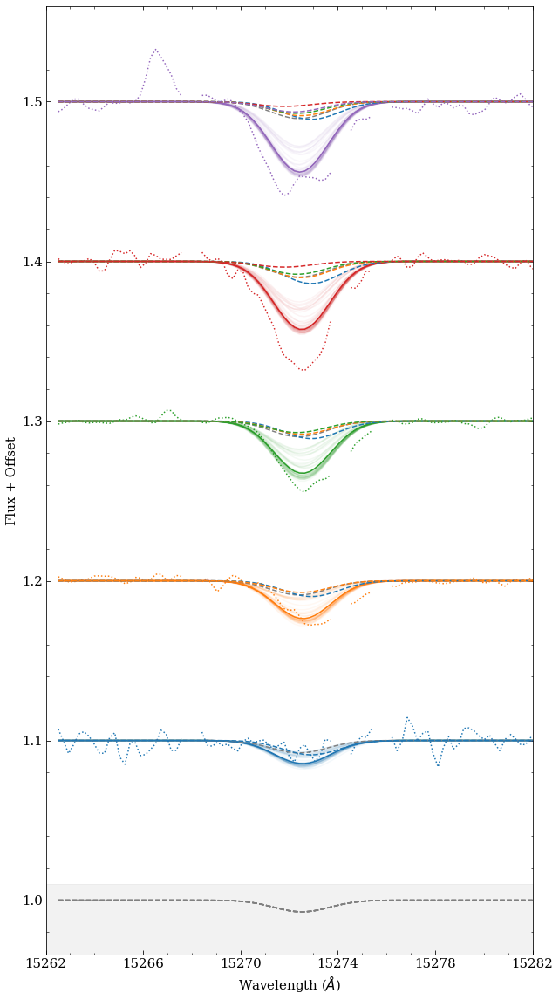

37


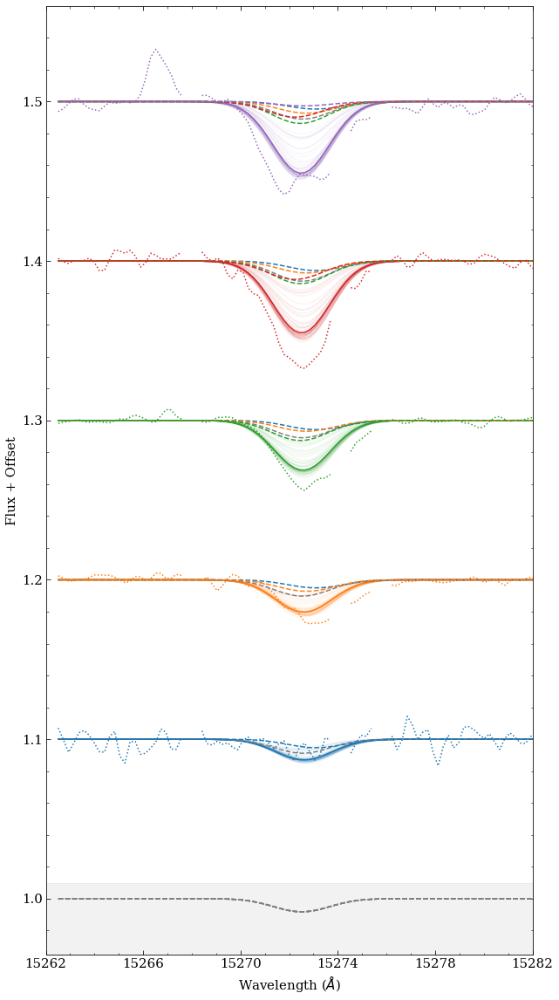

38


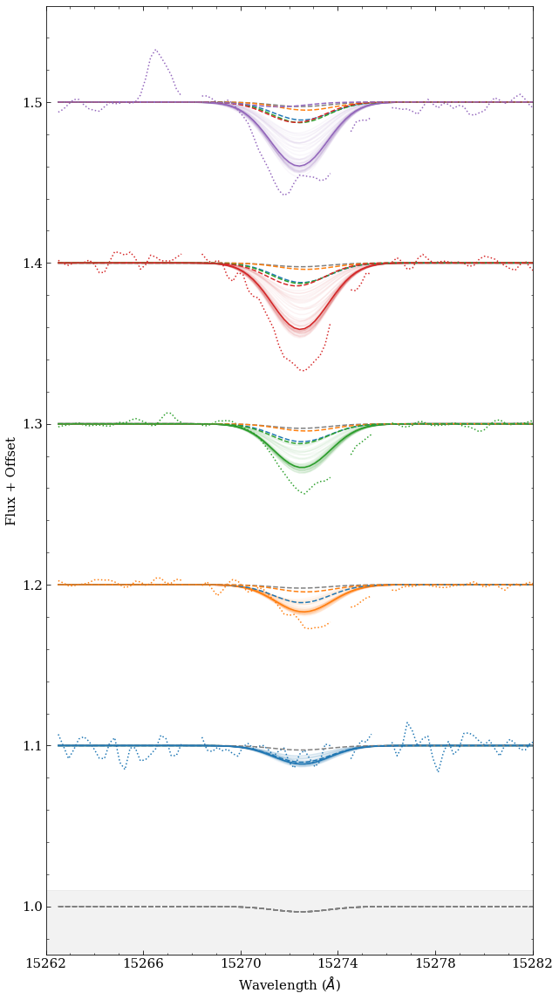

39


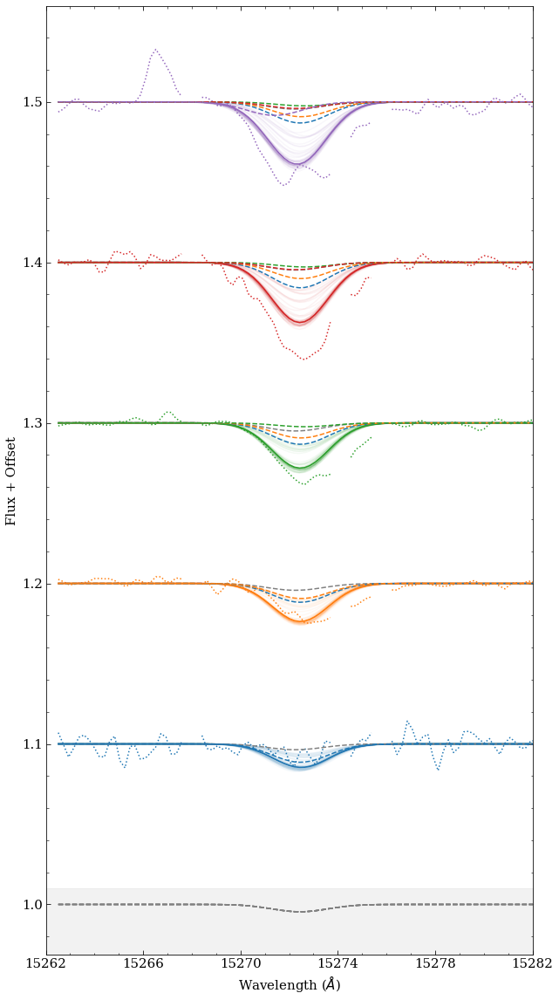

In [ ]:
def model_signals_fg(rvelo, sl, dAVdd):
    # dAVdd = sl.dAVdd
    voxeldiffDIB = np.zeros((len(sl.stars), len(wavs_window)))
    unsummed_signals = np.zeros((len(sl.stars), len(sl.bins)-1,len(wavs_window)))
    # unsummed_signals = np.zeros((len(sl.bins)-1, len(sl.bins)-1,len(wavs_window)))

#     print(voxeldiffDIB.shape, unsummed_signals.shape, sl.dAVdd.shape)
    peak_wavelength = dopplershift(rvelo)
    wavs_grid = np.tile(wavs_window, (len(sl.bins) - 1, 1))
    voxel_DIB_unscaled = np.exp(-(wavs_grid - peak_wavelength[:, np.newaxis])**2 / (2 * sigma0**2))
    amp = differentialAmplitude(dAVdd, sl.bins[1:]-sl.bins[:-1])

    def single_signal(amp, bindex):

        amp[bindex:] = 0 # THIS MIGHT NEED TO BE -1
        # print(amp)

        voxel_DIB_scaled = -voxel_DIB_unscaled *  amp[:, np.newaxis] 
        summed_DIB = np.sum(voxel_DIB_scaled, axis = 0)
        # continuum = lambda x, m, b : m * (x - lambda0) + b
        # cont = continuum(wavs_window, 0, b)
        return summed_DIB  + 1, voxel_DIB_scaled 

    fgdiffDIB = np.zeros((len(sl.stars), len(wavs_window)))
    

    for i in range(len(sl.stars)): # Iterate over each star in dAVdd array
#         print(dAVdd)
        dAVdd_bin = dAVdd[i, :] 

        amp = differentialAmplitude(dAVdd_bin, 1)

        bin_index = np.concatenate([sl.bin_inds]).astype(int)[i] # this only goes to 
        # signals[i, :] = single_signal(bin_index)
        voxeldiffDIB[i, :], unsummed_signals[i, :, :] = single_signal(amp, bin_index)
        fgdiffDIB[i, :], _ = single_signal(amp, 1)


    return voxeldiffDIB, unsummed_signals, fgdiffDIB


def make_plots_sample(samples, sl, logprob = None, chain = None):
    v = np.nanmedian(samples[:, :sl.ndim], axis = 0)
    davdd = np.nanmedian(samples[:, sl.ndim:], axis = 0).reshape(-1, sl.ndim)
    # av_offset = np.nanmedian(samples[:, 2*sl.ndim:], axis = 0)
    # davdd_all = np.ones((sl.nsig, sl.ndim)) * davdd + av_offset.reshape((sl.nsig, sl.ndim))

    if False: 
        best_step, best_walker = np.unravel_index(np.argmax(logprob), logprob.shape)
        davdd = chain[best_step, best_walker, sl.ndim:2*sl.ndim]
#         print(davdd.shape)
        davdd_all = davdd * np.ones((sl.nsig, sl.ndim)) + av_offset.reshape((sl.nsig, sl.ndim))

    def sample_signal():
        idx = (np.random.choice(samples.shape[0]))
        v = samples[idx, :sl.ndim]
        av = samples[idx, sl.ndim:].reshape(-1, sl.ndim)
        # av_scatter = samples[idx, 2*sl.ndim:]
        # davdd_all = av * np.ones((sl.nsig, sl.ndim)) + av_scatter.reshape((sl.nsig, sl.ndim))
        voxeldiffDIB, unsummed_signals, fgdiffDIB  = model_signals_fg(v, sl, av)
        return voxeldiffDIB, unsummed_signals, fgdiffDIB

    model_signals, signal_recreated_unsummed, fg_unsummed = model_signals_fg(v, sl, davdd)
#     print( model_signals.shape)

    fig, ax = plt.subplots(figsize = (10, 20))

    samp_signal = np.zeros((50, len(sl.stars), len(wavs_window)))
    samp_unsummed = np.zeros((50, len(sl.stars), len(sl.bins)-1, len(wavs_window)))
    samp_fgdiffDIB = np.zeros((50, len(sl.stars), len(wavs_window)))

    for idx in range(50):
        voxeldiffDIB, unsummed_signals, fgdiffDIB = sample_signal()
        samp_signal[idx, :, :] = voxeldiffDIB
        samp_unsummed[idx, :, :] = unsummed_signals
        samp_fgdiffDIB[idx, : :] = fgdiffDIB

    order_inds = np.array(np.argsort(sl.stars['DIST']))

    sep = 0.1
    offset = 0.1

    # signal_recreated, signal_recreated_unsummed = model_signals_thing(med_velo, sl, med_dAV_dd) 
    for i in range(len(order_inds)):
        ii = order_inds[i]
        # bindex = sl.bin_inds[ii]
        # ax.plot(wavs_window, sl.signals[ii, :] + 0.05 * i, color = 'C{}'.format(i))
        # ax.fill_between(wavs_window, sl.signals[ii, :] + sl.signal_errs[ii, :] + 0.05 * i,
        #                  sl.signals[ii, :] - sl.signal_errs[ii, :] + 0.05 * i, color = 'C{}'.format(bindex), alpha = 0.1)


        ax.plot(wavs[window], model_signals[ii, :] + sep * i + offset, color = 'C{}'.format(i))        
        ax.plot(wavs[window], sl.signals[ii, :]+ sep * i + offset, linestyle = 'dotted', color = 'C{}'.format(i))
        for k in range(50):
            # samp, _, _ = sample_signal()
            ax.plot(wavs[window], samp_signal[k, ii, :] + sep * i + offset, alpha = 0.05, color ='C{}'.format(i))
        for j in range(len(sl.bins)-1):
            if j==0:
                col = 'grey'
            else:
                col = 'C{}'.format(j-1)
            if j > i+1:
                continue
            ax.plot(wavs_window, unsummed_signals[ii, j, : ] + 1  + sep * i + offset, color=col, linestyle = 'dashed', alpha = 1)
        


        ax.set_xlabel('Wavelength ($\AA$)')
        ax.set_ylabel('Flux + Offset')
        ax.plot(wavs[window], fg_unsummed[0, :]  -sep + offset, linestyle = 'dashed', color ='grey',)
    ymin, ymax = ax.get_ylim()
    ax.set_ylim(ymin, ymax)
    ax.set_xlim(15272-10, 15272 + 10)
    ax.fill_between([15272-10, 15272+10], [1 + 0.1 * sep, 1 + 0.1 * sep], [ymin, ymin], color = 'grey', alpha = 0.1)
        
    ax.set_xticks(np.arange(15272-10, 15272+14, 4))
    return fig, ax        



for i in range(len(sightlines)):
    print(i)
    samples = chains[i].swapaxes(0,1)[-100:, :, :].reshape(-1, chains[i].shape[-1])

    fig, ax = make_plots_sample(samples, sightlines[i])
#     fig.savefig('RUNS_H5/figures_0602a/0602a_DIBmodels/model_realizations_sl{}.png'.format(name_i))

    plt.show()

In [ ]:
print(chains[0].shape)

(1500, 500, 36)


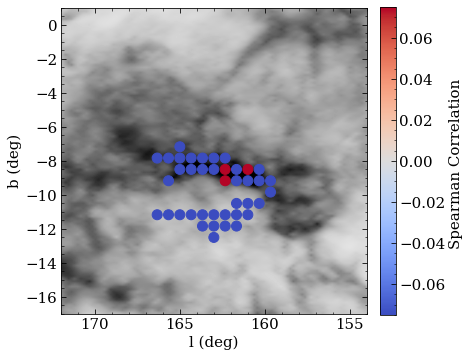

In [ ]:
from scipy.stats import spearmanr
start = 0
stop = None
def gradientmetric_deriv(array, dist):    
    a, b = np.meshgrid(array, array)
    c, d = np.meshgrid(dist, dist)
    grad_matrix = np.triu(b - a)
    deltadist = np.triu(d - c)
    nz = grad_matrix != 0
    grad_matrix[nz] = grad_matrix[nz] / deltadist[nz]
    shape = grad_matrix.shape[0]
    return np.sum(grad_matrix) / (0.5 * shape * (shape - 1))

sl_metrics = np.zeros(len(sightlines))
sl_spearman = np.zeros((len(sightlines), 2))

# sl_spearman_samples = np.zeros((len(sightlines), 2))


v_all = np.array([], dtype = float)
verr_all = np.array([], dtype = float)
d_all = np.array([], dtype = float)
l_sightline = np.array([], dtype = float)
sl_counts = np.zeros(len(sightlines))
median_velo_sightline = np.zeros(len(sightlines))

v_samp = []

velocity_samples_all = np.array([])
distance_samples_all = np.array([])

vperc16_all = np.array([], dtype = float)
vperc84_all = np.array([], dtype = float)

spearman_stats_sampledraw = np.zeros((20 * len(sightlines), 2))


for i in range(len(sightlines)):
    sl_i = sightlines[i]
    chain = chains[i]
    ndim = len(sl_i.voxel_dAVdd)
    walker_max = chain.shape[0]
    min_walker_val = walker_max - 100
    samples = chain[min_walker_val:, :, :].reshape((-1, chain.shape[-1]))
    
    medians = np.nanmedian(samples[min_walker_val:, :], axis = 0)
    stdevs = np.nanstd(samples[min_walker_val:, :], ddof = 1, axis = 0)
    perc16= np.percentile(samples[min_walker_val:, :], 16, axis = 0)
    perc84 = np.percentile(samples[min_walker_val:, :], 16, axis = 0)

    med_velo = medians[:ndim]
    std_velo = stdevs[:ndim]
    perc16_velo = perc16[:ndim]
    perc84_velo = perc84[:ndim]
    bin_dist = sl_i.bins[1:]
    vperc16_all = np.concatenate([vperc16_all, perc16_velo])
    vperc84_all = np.concatenate([vperc84_all, perc84_velo])

    select_cloud = bin_dist > 401

    median_velo_sightline[i] = np.nanmedian(samples[:, :ndim])

    metric = np.sum(gradientmetric_deriv(med_velo[select_cloud], bin_dist[select_cloud]))
    sl_metrics[i] = metric

    spearman_correlation = spearmanr(bin_dist[select_cloud], med_velo[select_cloud])
    sl_spearman[i, 0] = spearman_correlation.correlation
    sl_spearman[i, 1] = spearman_correlation.pvalue

    v_all = np.concatenate([v_all,med_velo])
    verr_all = np.concatenate([verr_all, std_velo]) 
    d_all = np.concatenate([d_all, bin_dist])

    l_sightline = np.concatenate([l_sightline, l_sample[i] * np.ones(len(med_velo))])
    sl_counts[i] = len(med_velo)
    
    velocity_samples = (samples[:, :ndim])
    distance_samples = (np.ones(velocity_samples.shape) * bin_dist)
    # select_cloud_samples = distance_samples > 401
    # spearman_samples = spearmanr(distance_samples[select_cloud_samples].flatten(), velocity_samples[select_cloud_samples].flatten(),)
    # sl_spearman_samples[i, 0] = spearman_samples.correlation
    # sl_spearman_samples[i, 1] = spearman_samples.pvalue
    
    # distance_samples_all = np.concatenate([distance_samples_all, distance_samples.flatten()])
    # velocity_samples_all = np.concatenate([velocity_samples_all, velocity_samples.flatten()])
    
    
    v_samp.append(velocity_samples)

    for j in range(20):
        idx = np.random.choice(samples.shape[0], size = 100)
        select_cloud_walkers = bin_dist > 401
        draws= np.array([np.random.choice(velocity_samples[:, k]) for k in range(velocity_samples.shape[1])])
        spearman_samples = spearmanr(bin_dist[select_cloud_walkers], draws[select_cloud_walkers],)
        spearman_stats_sampledraw[i*20 + j, 0] = spearman_samples.correlation
        spearman_stats_sampledraw[i*20 + j, 1] = spearman_samples.pvalue


fig, ax = plt.subplots(figsize = (6,6))
im = ax.imshow(np.nansum(dust_data.dustmap, axis = 2), origin = 'lower', cmap = 'binary', vmin = 0, vmax = 3, extent = (dust_data.l0-9, dust_data.l0+9, dust_data.b0-9, dust_data.b0+9))
points = ax.scatter(l_sample[:len(sightlines)], b_sample[:len(sightlines)], c = sl_spearman[:, 0], s= 100, vmin = -0.075, vmax = 0.075, cmap = 'coolwarm')
ax.set_xlabel('l (deg)')
ax.set_ylabel('b (deg)')
xmin, xmax = ax.get_xlim()
ax.set_xlim(xmax, xmin)
# fig.colorbar(im, label = "A(V)")
fig.colorbar(points, label = 'Spearman Correlation ',fraction=0.046, pad=0.04)
plt.show()

# fig, ax = plt.subplots(figsize = (6,6))
# im = ax.imshow(np.nansum(dust_data.dustmap, axis = 2), origin = 'lower', cmap = 'binary', vmin = 0, vmax = 3, extent = (dust_data.l0-9, dust_data.l0+9, dust_data.b0-9, dust_data.b0+9))
# points = ax.scatter(l_sample[:len(sightlines)], b_sample[:len(sightlines)], c = sl_spearman_samples[:, 0], s= 100 * (1-sl_spearman_samples[:, 1]), vmin = -0.075, vmax = 0.075, cmap = 'coolwarm')
# ax.set_xlabel('l (deg)')
# ax.set_ylabel('b (deg)')
# xmin, xmax = ax.get_xlim()
# ax.set_xlim(xmax, xmin)
# # fig.colorbar(im, label = "A(V)")
# fig.colorbar(points, label = 'Spearman Correlation ')
# plt.show()

# sl_spearman.astype(np.float16)
# fig, ax = plt.subplots()
# fil = np.nansum(crit_filament)
# fil_idx = np.sum(sl_counts[:fil]).astype(int)

# ax.errorbar(d_all[:], v_all[:], yerr = verr_all[:], fmt = '.', capsize = 4, color = 'grey')

# points = ax.scatter(d_all[:], v_all[:], c = l_sightline[:], zorder = 5, )

# ax.set_xlim(380, 600)
# ax.set_xlabel('Distance (pc)')
# ax.set_ylabel('Velocity (km/s)')
# fig.colorbar(points, label = 'l (deg)')
# plt.show()

In [ ]:
sl_metrics = np.zeros(len(sightlines))
sl_spearman = np.zeros((len(sightlines), 2))

v_all = np.array([], dtype = float)
verr_all = np.array([], dtype = float)
d_all = np.array([], dtype = float)

for i in range(len(sightlines)):
    sl_i = sightlines[i]
    chain = chains[i]
    ndim = len(sl_i.voxel_dAVdd)
    walker_max = chain.shape[0]
    min_walker_val = walker_max - 100
    samples = chain[min_walker_val:, :, :].reshape((-1, chain.shape[-1]))
        
    medians = np.nanmedian(samples[min_walker_val:, :], axis = 0)
    stdevs = np.nanstd(samples[min_walker_val:, :], ddof = 1, axis = 0)
    perc16= np.percentile(samples[min_walker_val:, :], 16, axis = 0)
    perc84 = np.percentile(samples[min_walker_val:, :], 84, axis = 0)
    
    med_velo = medians[:ndim]
    std_velo = stdevs[:ndim]
    perc16_velo = perc16[:ndim]
    perc84_velo = perc84[:ndim]
    bin_dist = sl_i.bins[1:]


    v_all = np.concatenate([v_all,med_velo])
    verr_all = np.concatenate([verr_all, std_velo]) 
    d_all = np.concatenate([d_all, bin_dist])
    
    select_cloud = bin_dist > 401

    median_velo_sightline[i] = np.nanmedian(samples[:, :ndim])

    metric = np.sum(gradientmetric_deriv(med_velo[select_cloud], bin_dist[select_cloud]))
    sl_metrics[i] = metric

    spearman_correlation = spearmanr(bin_dist[select_cloud], med_velo[select_cloud])
    sl_spearman[i, 0] = spearman_correlation.correlation
    sl_spearman[i, 1] = spearman_correlation.pvalue

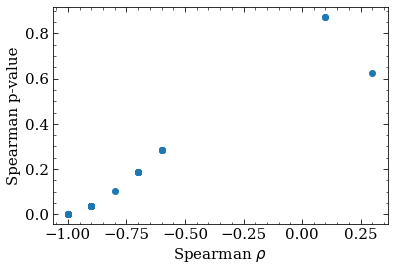

In [ ]:
fig, ax = plt.subplots()
ax.scatter(sl_spearman[:, 0], sl_spearman[:, 1])
ax.set_xlabel(r'Spearman $\rho$')
ax.set_ylabel('Spearman p-value')
plt.show()

In [ ]:
def plot_velo(chain, sl , min_walker = None, plot_objs = None, color = None, plot_lines = False, plot_box = False, plot_violin = False, bestprob = False, lnprob = None):
    if plot_objs == None:
        fig, ax = plt.subplots(figsize = (8,6))
    else:
        fig, ax = plot_objs
    ndim = len(sl.voxel_dAVdd)

    walker_max = chain.shape[0]

    if min_walker is None:
        min_walker_val = -100
    # else:
    min_walker_val = walker_max - min_walker

    samples = chain[min_walker_val:, :, :].reshape((-1, chain.shape[-1]))

    vel_samples = samples[:, :sl.ndim]
    avg_av = np.nansum(np.median(sl.dAVdd, axis = 0))

    medians = np.nanmedian(samples[:, :], axis = 0)
    if bestprob:
        lp = lnprob
        lp[:, :-100] = -np.infty
        w_ind, stp_ind = np.unravel_index(np.argmax(lp), lp.shape)

        medians = chain[w_ind, stp_ind, :]

    stdevs = np.nanstd(samples[min_walker_val:, :], ddof = 1, axis = 0)

    med_velo = medians[:ndim]
    std_velo = stdevs[:ndim]


    med_dAV_dd = medians[ndim:]
    med_dAV_dd = stdevs[ndim:]

    perc16, perc50,  perc84 = (np.percentile(samples[min_walker_val:, :], 16, axis = 0), 
                               np.percentile(samples[min_walker_val:, :], 50, axis = 0),
                               np.percentile(samples[min_walker_val:, :], 84, axis = 0) )
    velo16, velo50, velo84 = (perc16[:ndim], perc50[:ndim], perc84[:ndim])

   
    if color == None:
        color_choice = 'k'
    else:
        color_choice = color
    

    if plot_box:
        # ax.hlines(med_velo, sl.bins[:-1], sl.bins[1:], color = color_choice, linestyle = 'dashed', linewidth = 0.5)
        # ax.hlines(velo50, sl.bins[:-1], sl.bins[1:], color = color_choice)
        ax.hlines(velo50, sl.bins[:-1], sl.bins[1:], color = 'k')


        for j in range(len(sl.bins)-1):
            # ax.fill_between([sl.bins[i], sl.bins[i +1]], med_velo[i]+std_velo[i], med_velo[i]-std_velo[i], 
            #                 alpha = 0.3, color = color_choice, hatch = '/')
            ax.fill_between([sl.bins[j], sl.bins[j +1]], velo84[j], velo16[j], 
                    alpha = 0.3, color = 'C{}'.format(j))

    axmin = 350
    if plot_violin:
        colorlist = ['grey', 'C0', 'C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10']
        bin_pos = sl.bins[:]
        bin_pos[0] = axmin
        pos = (bin_pos[1:] + bin_pos[:-1])/2
        
        w = (bin_pos[1:] - bin_pos[:-1])
        vparts=ax.violinplot(vel_samples, pos, widths = w, showmeans=False, showextrema=False, showmedians=True, side = 'both')
        for vindx, part in enumerate(vparts['bodies']):
            part.set_facecolor(colorlist[vindx])
            
        plot_guides = True
        if plot_guides:
            for pos in bin_pos:
                ax.plot((pos, pos), (-10, 20), color = 'k', linestyle = 'dotted')
                axs[1].plot((pos, pos), (0, 1), color = 'k', linestyle = 'dotted')
    
    plot_violin_half = False
    if plot_violin_half:
        colorlist = ['grey', 'C0', 'C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10']
        bin_pos = sl.bins[:]
        bin_pos[0] = axmin
        pos =  bin_pos[1:]
        
        w = np.min(2* (bin_pos[1:] - bin_pos[:-1]))
        vparts=ax.violinplot(vel_samples, pos, widths = w, showmeans=False, showextrema=False, showmedians=True, side = 'low')
        for vindx, part in enumerate(vparts['bodies']):
            part.set_facecolor(colorlist[vindx])


    # else:  
    #     # ax.errorbar((sl.bins[1:] + sl.bins[:-1] ) /2 , med_velo, yerr = std_velo, fmt = '.', color = color_choice, capsize = 5)
    #     # ax.scatter((sl.bins[1:] + sl.bins[:-1] ) /2 , med_velo, c = color_choice)
    #     ax.errorbar((sl.bins[1:] ) , med_velo, yerr = std_velo, fmt = '.', color = color_choice, capsize = 5)
    #     ax.scatter((sl.bins[1:] ) , med_velo, c = color_choice)
    #     if plot_lines:
    #         ax.hlines(med_velo, sl.bins[:-1], sl.bins[1:], color = color_choice, linestyle = 'solid', linewidth = .5)



    # ax.errorbar((sl.bins[1:]),med_velo, xerr = (sl.bins[1:] - sl.bins[:-1], np.zeros(med_velo.shape)), yerr = std_velo, fmt = '.' )
    ax.set_xlim(axmin, 600)
    ax.set_xlabel('Distance (pc)')
    ax.set_ylabel('Radial Velocity (km/s)')

    dist_xx = (sl.bins[1:] + sl.bins[:-1] ) /2
    # med_velo

    return fig, ax, dist_xx, med_velo, std_velo

In [ ]:
chains[0].shape

(1500, 500, 36)

N  0
[375.005 420.01  460.01  500.01  540.01  580.01 ]
[-0.01472981 -0.39385049  0.31300822  0.23058535 -1.44981839 -7.96874364]
[420.01 460.01 500.01 540.01 580.01]
(array([-0.01307065,  5.66789593]), array([[ 1.08718420e-04, -5.17396894e-02],
       [-5.17396894e-02,  2.48931539e+01]]))


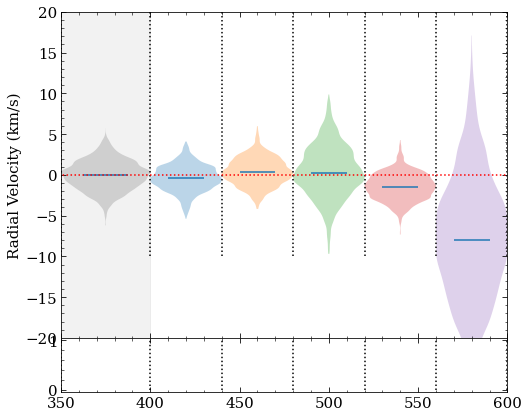

N  1
[375.005 420.01  460.01  500.01  540.01  580.01 ]
[-1.07629266 -0.59541847  0.39447515 -0.47170508 -1.67566727 -2.68397667]
[420.01 460.01 500.01 540.01 580.01]
(array([-0.00807541,  3.07489095]), array([[ 4.63964272e-05, -2.11433337e-02],
       [-2.11433337e-02,  9.74346709e+00]]))


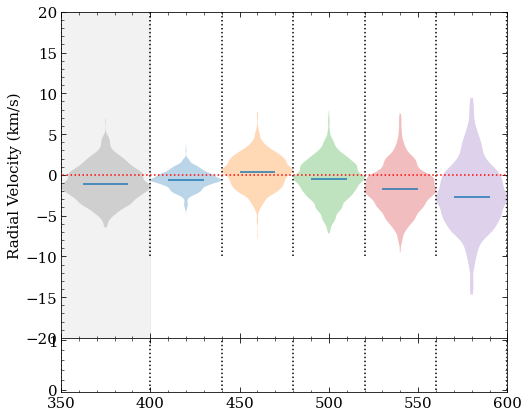

N  2
[375.005 420.01  460.01  500.01  540.01  580.01 ]
[ 0.15479216 -0.79989101  0.31188913 -0.82979743 -1.23149435 -3.25003118]
[420.01 460.01 500.01 540.01 580.01]
(array([-0.00948928,  3.97889662]), array([[ 9.42183366e-05, -4.41011698e-02],
       [-4.41011698e-02,  2.08011943e+01]]))


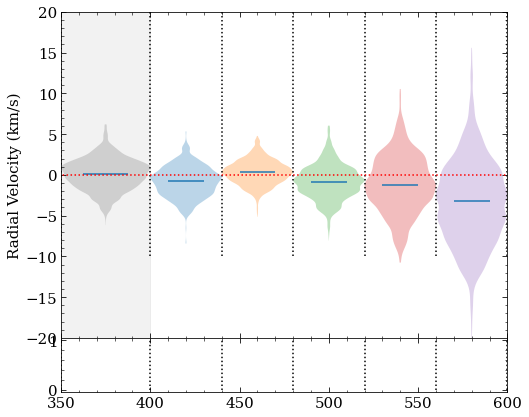

N  3
[375.005 420.01  460.01  500.01  540.01  580.01 ]
[ 0.60257228  0.11780219 -0.02479789 -1.20190548 -2.2050328  -1.2454083 ]
[420.01 460.01 500.01 540.01 580.01]
(array([-0.02029208,  9.16863119]), array([[ 2.92448493e-05, -1.40348399e-02],
       [-1.40348399e-02,  6.77595687e+00]]))


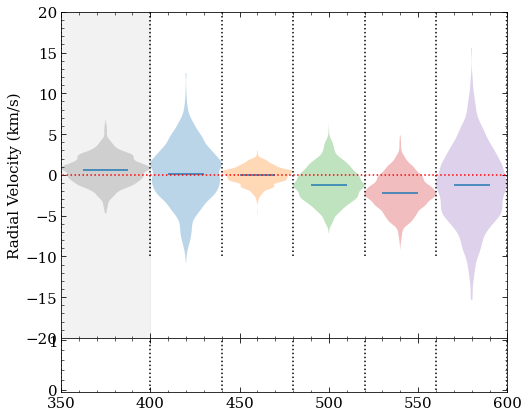

N  4
[375.005 420.01  460.01  500.01  540.01  580.01 ]
[-0.29353953 -0.28077823  0.45171985 -0.08133144 -1.13968378 -0.9568732 ]
[420.01 460.01 500.01 540.01 580.01]
(array([-0.00702269,  3.18863831]), array([[ 3.71666352e-05, -1.75543404e-02],
       [-1.75543404e-02,  8.36449716e+00]]))


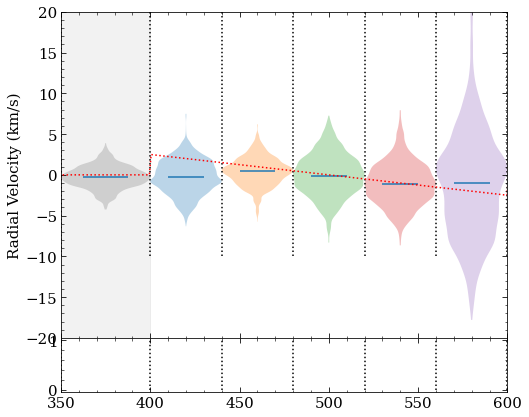

N  5
[375.005 420.01  460.01  500.01  540.01  580.01 ]
[-0.42051527 -0.24398115 -0.06827338 -1.01487756 -1.35192224  0.02791288]
[420.01 460.01 500.01 540.01 580.01]
(array([-0.0078409,  3.1797346]), array([[ 1.68281799e-05, -7.98831052e-03],
       [-7.98831052e-03,  3.83691646e+00]]))


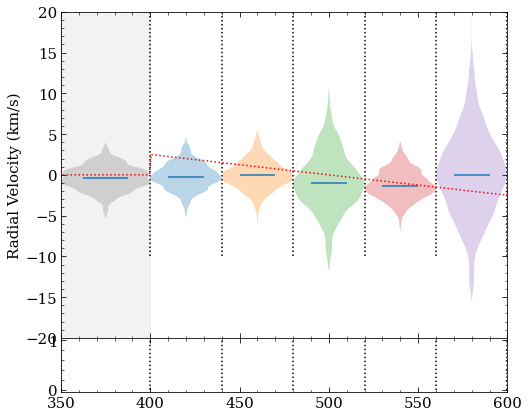

N  6
[375.005 420.01  460.01  500.01  540.01  580.01 ]
[-0.05829354 -1.14373809  1.11485786 -0.55069877 -1.2352379  -1.67386346]
[420.01 460.01 500.01 540.01 580.01]
(array([-0.00862651,  3.78373612]), array([[ 1.29427952e-04, -6.31548179e-02],
       [-6.31548179e-02,  3.10782570e+01]]))


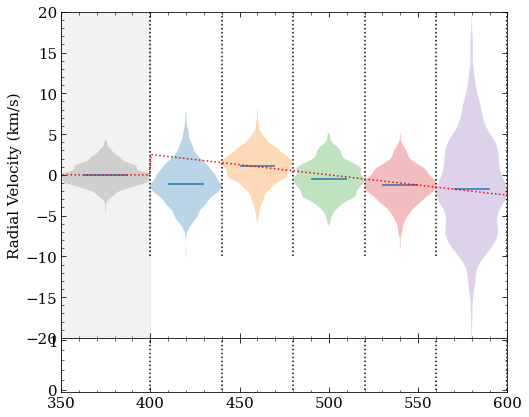

N  7
[375.005 420.01  460.01  500.01  540.01  580.01 ]
[ 0.41034279  0.12055586  0.10039956 -1.24208139 -1.29269684 -1.38943507]
[420.01 460.01 500.01 540.01 580.01]
(array([-0.01345419,  5.89513367]), array([[ 1.71879929e-05, -8.06523635e-03],
       [-8.06523635e-03,  3.81776090e+00]]))


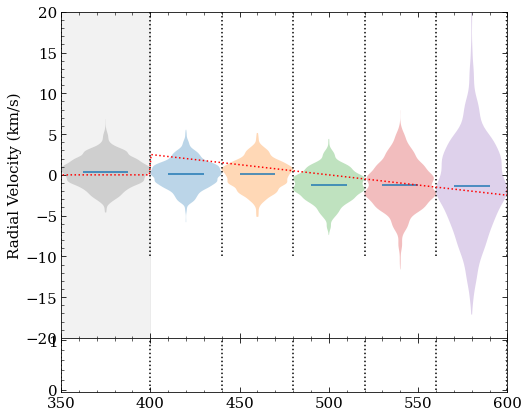

N  8
[375.005 420.01  460.01  500.01  540.01  580.01 ]
[-0.25160981 -0.21606826  0.35139803  0.26695541 -0.71982366  0.8487414 ]
[420.01 460.01 500.01 540.01 580.01]
(array([-0.00645204,  3.21898162]), array([[ 3.00360086e-05, -1.43774229e-02],
       [-1.43774229e-02,  6.92284527e+00]]))


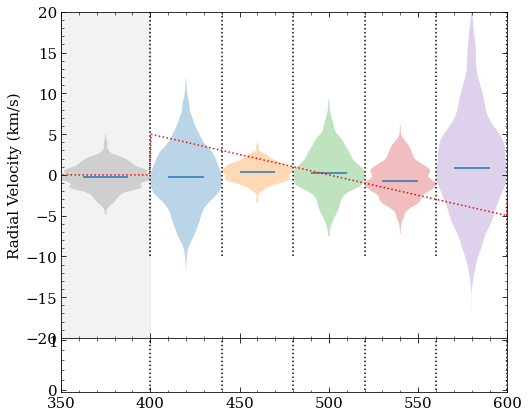

N  9
[375.005 420.01  460.01  500.01  540.01  580.01 ]
[ 0.88548002 -0.61532944  1.37151113 -0.16780041 -3.11768412 -1.29217581]
[420.01 460.01 500.01 540.01 580.01]
(array([-0.00932239,  4.36162306]), array([[ 2.28647527e-04, -1.10242846e-01],
       [-1.10242846e-01,  5.34223317e+01]]))


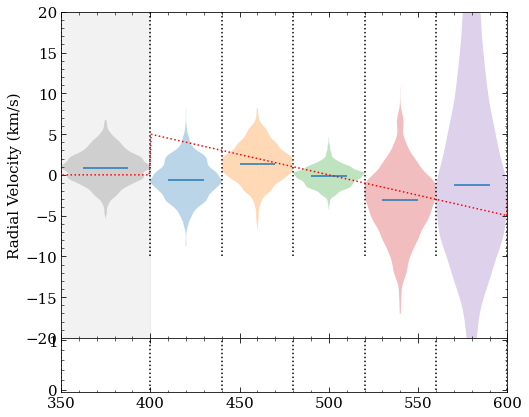

N  10
[375.005 420.01  460.01  500.01  540.01  580.01 ]
[ 0.3829885   0.58476066  0.6277991  -1.19838356 -0.87571546  2.01830438]
[420.01 460.01 500.01 540.01 580.01]
(array([-0.01036155,  4.71991678]), array([[ 6.72524611e-05, -3.40515998e-02],
       [-3.40515998e-02,  1.73736659e+01]]))


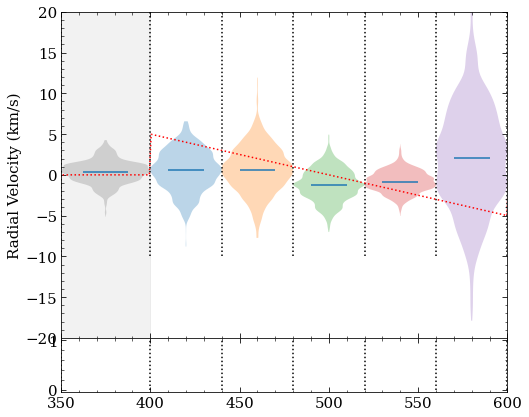

N  11
[375.005 420.01  460.01  500.01  540.01  580.01 ]
[ 0.57751975 -0.17631727  0.8625732  -0.08881463 -1.59624292 -0.76249486]
[420.01 460.01 500.01 540.01 580.01]
(array([-0.01340142,  6.16575099]), array([[ 6.42239287e-05, -3.11164107e-02],
       [-3.11164107e-02,  1.52262969e+01]]))


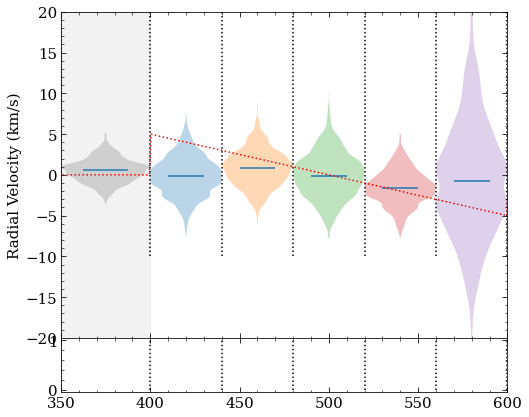

N  12
[375.005 420.01  460.01  500.01  540.01  580.01 ]
[ 0.09303701  1.03787504  1.73253243  0.31182615 -1.20073788 -4.41698658]
[420.01 460.01 500.01 540.01 580.01]
(array([-0.0248423 , 12.41420886]), array([[ 9.54223664e-05, -4.61666573e-02],
       [-4.61666573e-02,  2.25154519e+01]]))


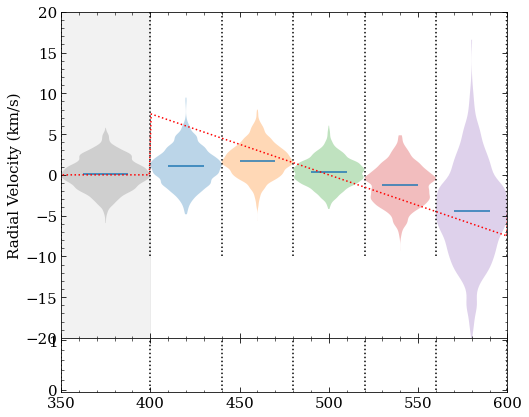

N  13
[375.005 420.01  460.01  500.01  540.01  580.01 ]
[ 0.16839709  0.20125112  1.36577649  0.52146013 -1.6195292  -5.92989884]
[420.01 460.01 500.01 540.01 580.01]
(array([-0.02256492, 10.8490143 ]), array([[ 2.39595479e-04, -1.11449548e-01],
       [-1.11449548e-01,  5.22780936e+01]]))


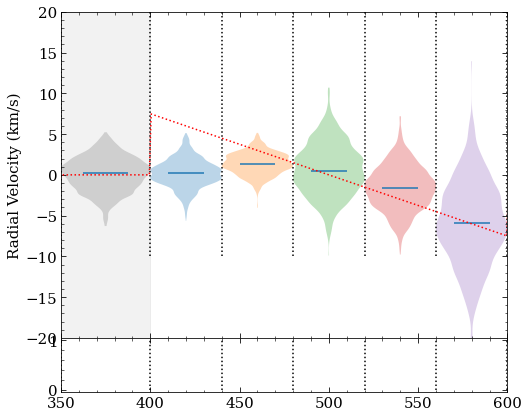

N  14
[375.005 420.01  460.01  500.01  540.01  580.01 ]
[ 0.59960683 -0.01741563  0.65562342 -0.17055382 -1.43560151 -0.8567992 ]
[420.01 460.01 500.01 540.01 580.01]
(array([-0.01531842,  7.22526996]), array([[ 4.46868441e-05, -2.15566242e-02],
       [-2.15566242e-02,  1.04875299e+01]]))


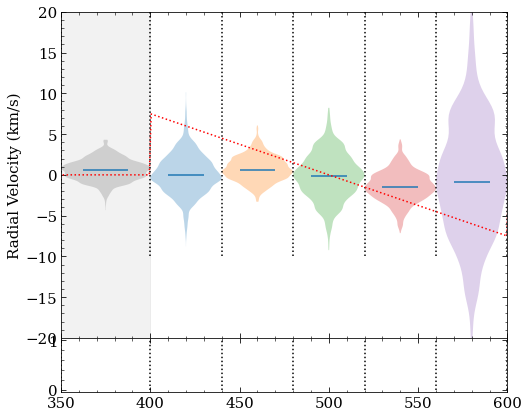

N  15
[375.005 420.01  460.01  500.01  540.01  580.01 ]
[-0.06593077  1.75421203  0.68738327 -0.04328937 -1.79405613 -7.69940654]
[420.01 460.01 500.01 540.01 580.01]
(array([-0.03366656, 16.31838383]), array([[ 8.01101224e-05, -4.00099035e-02],
       [-4.00099035e-02,  2.01260497e+01]]))


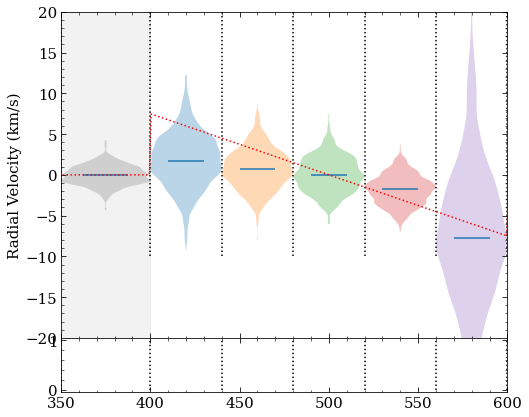

N  16
[375.005 420.01  460.01  500.01  540.01  580.01 ]
[ 9.76759291e-01  1.54457317e+00  2.08949146e+00  1.16787036e-03
 -1.47221205e+00 -5.08744434e+00]
[420.01 460.01 500.01 540.01 580.01]
(array([-0.04009019, 19.91262436]), array([[ 1.52368421e-04, -7.24139657e-02],
       [-7.24139657e-02,  3.46598432e+01]]))


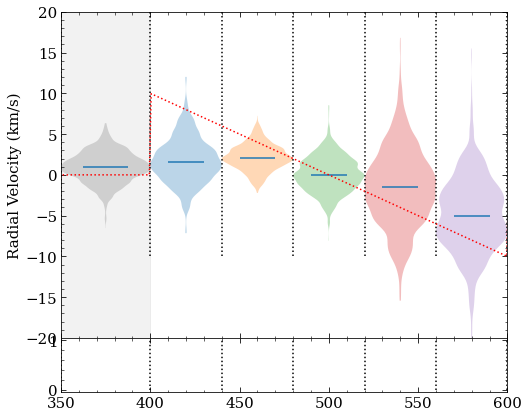

N  17
[375.005 420.01  460.01  500.01  540.01  580.01 ]
[ 0.369777    0.91489249  3.71798026  0.55785242 -1.70026955 -4.61217753]
[420.01 460.01 500.01 540.01 580.01]
(array([-0.02369767, 11.4996653 ]), array([[ 1.94274857e-04, -9.08539909e-02],
       [-9.08539909e-02,  4.30416804e+01]]))


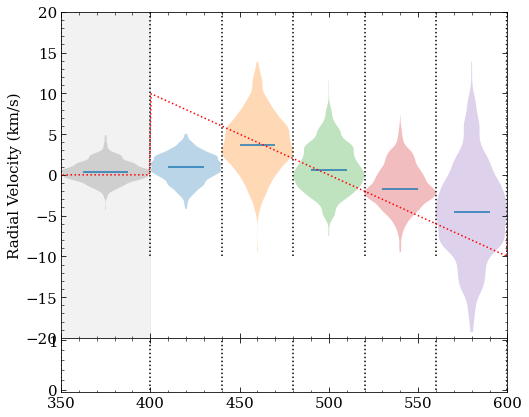

N  18
[375.005 420.01  460.01  500.01  540.01  580.01 ]
[ 0.45784275  1.72171595  2.10894775  1.08752344 -2.47691836 -4.4234832 ]
[420.01 460.01 500.01 540.01 580.01]
(array([-0.04159499, 20.73697551]), array([[ 1.46728486e-04, -7.07355680e-02],
       [-7.07355680e-02,  3.43898990e+01]]))


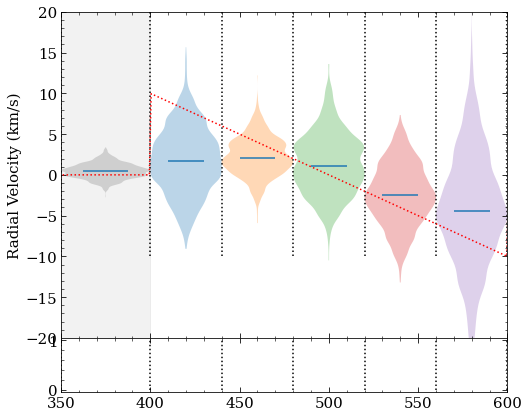

N  19
[375.005 420.01  460.01  500.01  540.01  580.01 ]
[ 0.45664388  1.34714277  1.63907866 -0.0521857  -2.29163508 -4.83163473]
[420.01 460.01 500.01 540.01 580.01]
(array([-0.03152779, 15.2105538 ]), array([[ 8.51468743e-05, -3.98072510e-02],
       [-3.98072510e-02,  1.87972455e+01]]))


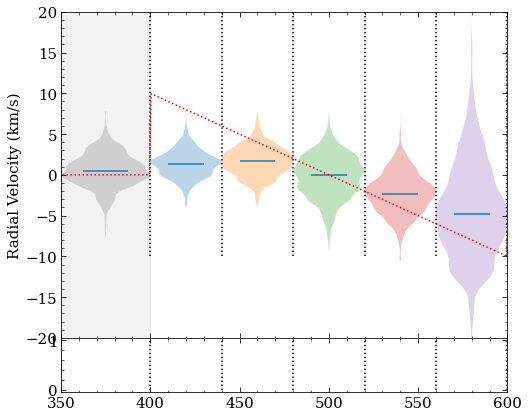

N  20
[375.005 420.01  460.01  500.01  540.01  580.01 ]
[ 1.28057057  0.72928029  2.47459115  0.11565638 -1.64546241 -2.66881573]
[420.01 460.01 500.01 540.01 580.01]
(array([-0.02551539, 12.69564471]), array([[ 1.82741783e-04, -8.73119118e-02],
       [-8.73119118e-02,  4.21472353e+01]]))


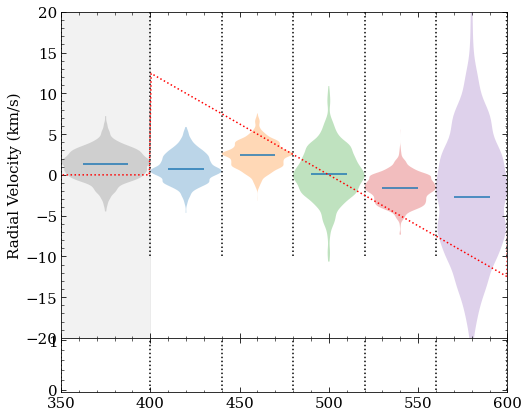

N  21
[375.005 420.01  460.01  500.01  540.01  580.01 ]
[ 0.93076161  1.7109874   1.43332384  0.05575579 -1.23071156 -3.77878157]
[420.01 460.01 500.01 540.01 580.01]
(array([-0.0255593 , 12.64421013]), array([[ 1.35509946e-05, -6.47877931e-03],
       [-6.47877931e-03,  3.13201165e+00]]))


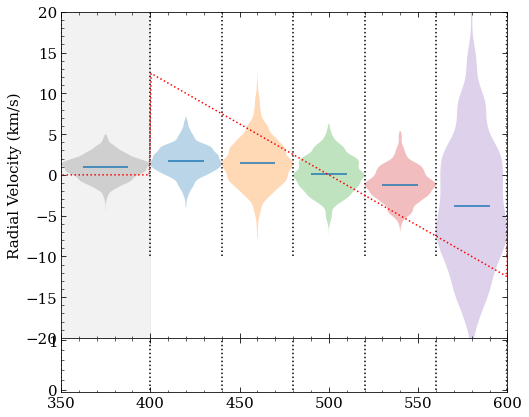

N  22
[375.005 420.01  460.01  500.01  540.01  580.01 ]
[ 0.98684549  1.12710749  1.90528876  0.16186629 -1.29111295 -6.25732893]
[420.01 460.01 500.01 540.01 580.01]
(array([-0.03385006, 16.8289741 ]), array([[ 2.13445421e-04, -1.02015476e-01],
       [-1.02015476e-01,  4.90684029e+01]]))


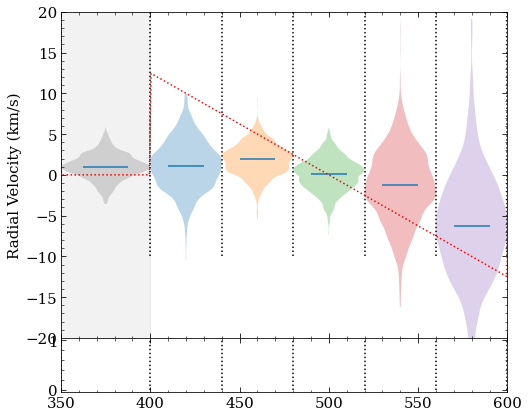

N  23
[375.005 420.01  460.01  500.01  540.01  580.01 ]
[ 0.78704548  1.61128123  2.29604873 -0.48329257 -2.53348938 -4.53317303]
[420.01 460.01 500.01 540.01 580.01]
(array([-0.0348374 , 16.95854071]), array([[ 1.40528865e-04, -6.50627127e-02],
       [-6.50627127e-02,  3.04164173e+01]]))


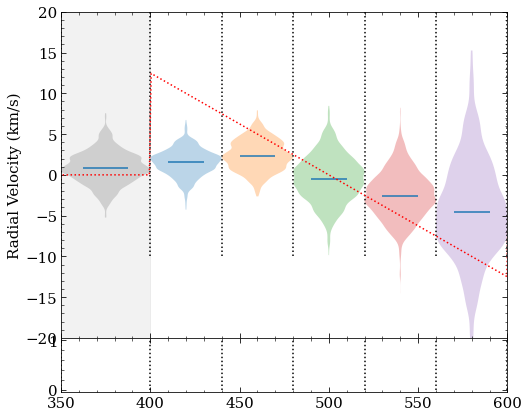

N  24
[375.005 420.01  460.01  500.01  540.01  580.01 ]
[ 1.34453677  1.78179888  2.79998063 -0.21966107 -3.76331617 -6.24870598]
[420.01 460.01 500.01 540.01 580.01]
(array([-0.03982931, 19.26930691]), array([[ 2.81523279e-04, -1.27981503e-01],
       [-1.27981503e-01,  5.87068886e+01]]))


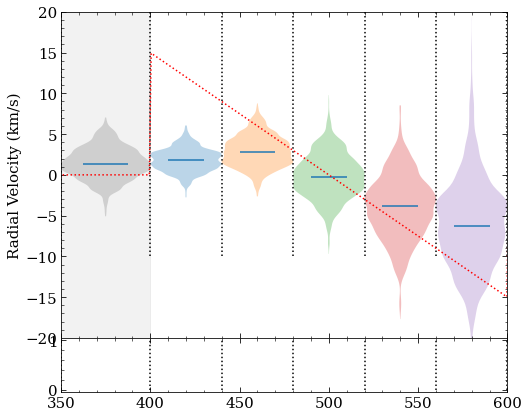

N  25
[375.005 420.01  460.01  500.01  540.01  580.01 ]
[ 1.43552252  1.59727185  2.45620472  0.16195446 -1.16589835 -4.38020403]
[420.01 460.01 500.01 540.01 580.01]
(array([-0.034009  , 17.15312588]), array([[ 9.92186083e-05, -4.89740989e-02],
       [-4.89740989e-02,  2.43467435e+01]]))


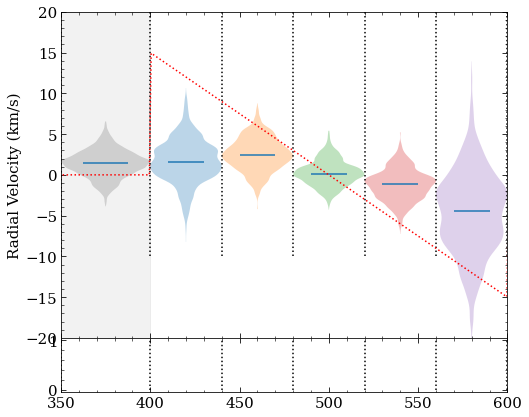

N  26
[375.005 420.01  460.01  500.01  540.01  580.01 ]
[ 1.04612771  3.49968842  2.38729802 -0.73735255 -2.27728928 -4.3974035 ]
[420.01 460.01 500.01 540.01 580.01]
(array([-0.05472646, 27.22729777]), array([[ 3.68613702e-05, -1.77004328e-02],
       [-1.77004328e-02,  8.56066333e+00]]))


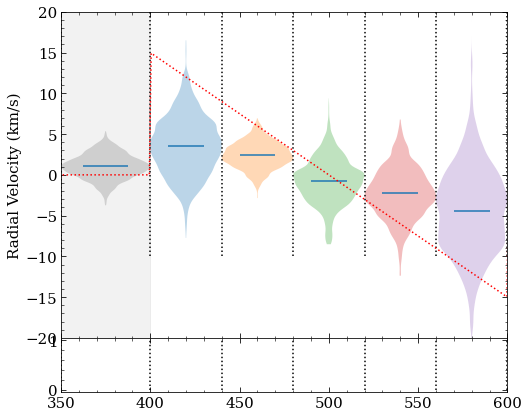

N  27
[375.005 420.01  460.01  500.01  540.01  580.01 ]
[ 0.52249613  1.93168816  1.93932217 -1.41025781 -3.9847138  -7.72927089]
[420.01 460.01 500.01 540.01 580.01]
(array([-0.06008322, 28.9027068 ]), array([[ 2.13157833e-04, -1.00482651e-01],
       [-1.00482651e-01,  4.76249993e+01]]))


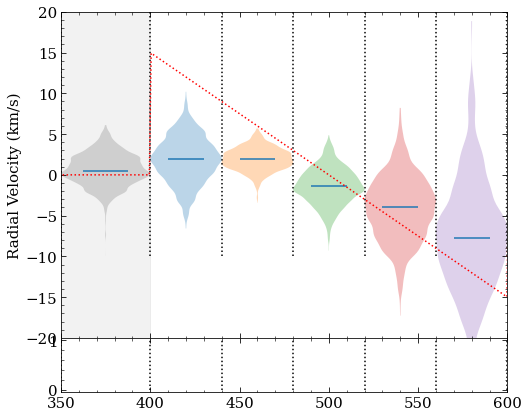

N  28
[375.005 420.01  460.01  500.01  540.01  580.01 ]
[ 1.62425669  2.93921378  4.75709795 -0.14679614 -1.97664956 -3.7949399 ]
[420.01 460.01 500.01 540.01 580.01]
(array([-0.04146125, 20.61469878]), array([[ 7.57803715e-05, -3.60368946e-02],
       [-3.60368946e-02,  1.73157288e+01]]))


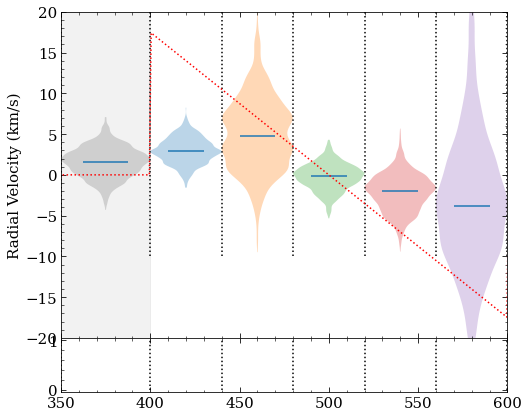

N  29
[375.005 420.01  460.01  500.01  540.01  580.01 ]
[ 0.99741986  3.81608805  3.76339091  0.01886346 -3.14464564 -8.77650739]
[420.01 460.01 500.01 540.01 580.01]
(array([-0.07060812, 35.16394396]), array([[ 2.31480237e-04, -1.11357721e-01],
       [-1.11357721e-01,  5.39655160e+01]]))


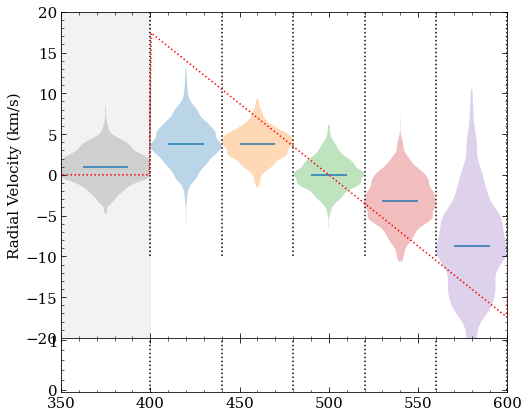

N  30
[375.005 420.01  460.01  500.01  540.01  580.01 ]
[ 0.63245247  2.2283163   2.47934942  0.12167475 -1.30645313 -7.24257079]
[420.01 460.01 500.01 540.01 580.01]
(array([-0.03976954, 19.98011424]), array([[ 1.32939251e-04, -6.48254961e-02],
       [-6.48254961e-02,  3.18479011e+01]]))


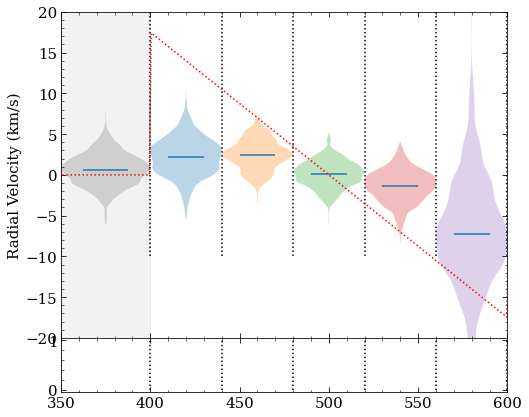

N  31
[375.005 420.01  460.01  500.01  540.01  580.01 ]
[ 1.25873246  1.39264051  3.39850335 -0.71739438 -1.90719332 -8.59034397]
[420.01 460.01 500.01 540.01 580.01]
(array([-0.07086842, 35.1937108 ]), array([[ 4.13918753e-04, -2.02357441e-01],
       [-2.02357441e-01,  9.97860776e+01]]))


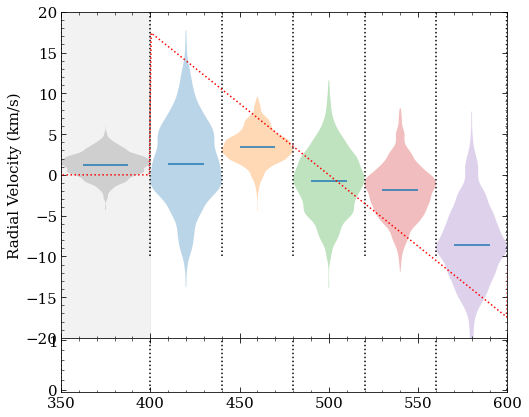

N  32
[375.005 420.01  460.01  500.01  540.01  580.01 ]
[ 1.07407535  2.06298267  2.51619176  0.06978985 -2.67160422 -5.17411863]
[420.01 460.01 500.01 540.01 580.01]
(array([-0.03579505, 17.47671968]), array([[ 1.46690047e-04, -6.52081305e-02],
       [-6.52081305e-02,  2.92352770e+01]]))


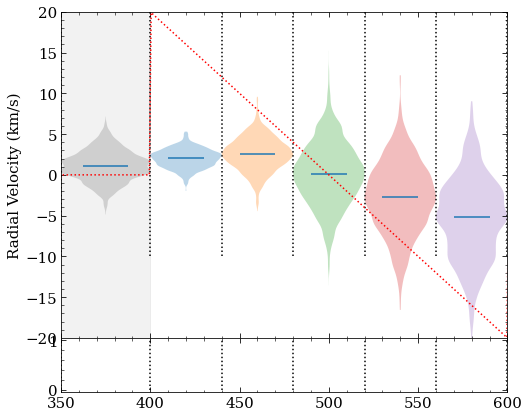

N  33
[375.005 420.01  460.01  500.01  540.01  580.01 ]
[ 1.91311396  2.2890298   3.09680665  0.2675778  -1.0263997  -6.87826937]
[420.01 460.01 500.01 540.01 580.01]
(array([-0.04501612, 22.24512241]), array([[ 2.25263203e-04, -1.08268830e-01],
       [-1.08268830e-01,  5.25766770e+01]]))


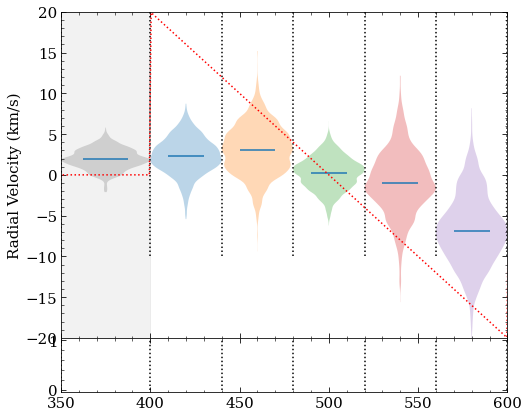

N  34
[375.005 420.01  460.01  500.01  540.01  580.01 ]
[ 0.25057553  3.36382538  3.44083115  0.48938077 -2.34357871 -6.19984577]
[420.01 460.01 500.01 540.01 580.01]
(array([-0.0553727 , 27.89241147]), array([[ 1.22223897e-04, -5.93105226e-02],
       [-5.93105226e-02,  2.90303012e+01]]))


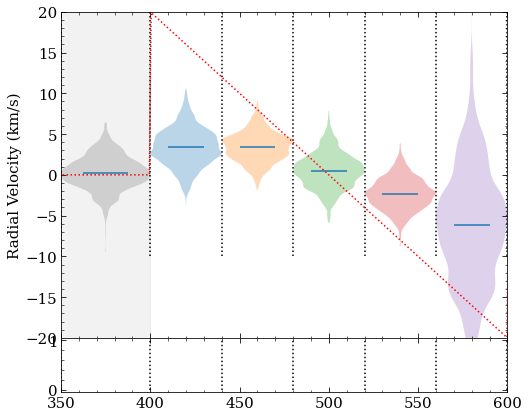

N  35
[375.005 420.01  460.01  500.01  540.01  580.01 ]
[-0.75533656  2.29950872 -1.17730538 -0.35244365 -4.42333704 -5.68507417]
[420.01 460.01 500.01 540.01 580.01]
(array([-0.04041857, 19.40909635]), array([[ 1.08463025e-04, -5.18476508e-02],
       [-5.18476508e-02,  2.49699473e+01]]))


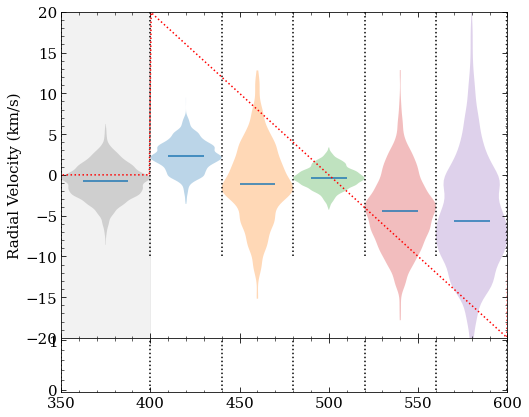

N  36
[375.005 420.01  460.01  500.01  540.01  580.01 ]
[  2.06618121   4.32801161   5.06677841  -0.39701459  -5.42738884
 -10.19629145]
[420.01 460.01 500.01 540.01 580.01]
(array([-0.08687376, 42.55257104]), array([[ 4.68230346e-04, -2.20972553e-01],
       [-2.20972553e-01,  1.05366090e+02]]))


IndexError: index 36 is out of bounds for axis 0 with size 36

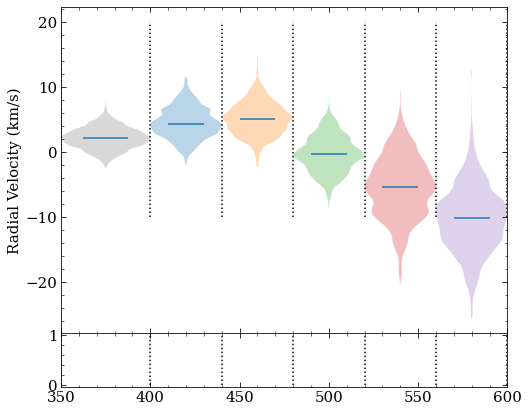

In [ ]:
avs = np.zeros(len(sightlines))
for i in range(len(sightlines)):
    sl_i = sightlines[i]
    avs[i] = np.sum(sl_i.voxel_dAVdd)

line = lambda x, m, b : m * x + b

cnorm = matplotlib.colors.Normalize(np.min(avs), np.max(avs))
cmap = plt.get_cmap('viridis')
mappable = matplotlib.cm.ScalarMappable(norm = cnorm,  cmap = cmap)


sightlines_slopes = np.zeros(len(sightlines))
sightlines_slopes_err = np.zeros(len(sightlines))


dist_xx_sl = np.array([])
velo_yy_sl = np.array([])
std_velo_sl = np.array([])

priorx = np.linspace(-20, 20, 100)

# for i in range(len(sightlines)): 
for i in range(0, len(sightlines)): 

    print('N ', i)
    fig, axs = plt.subplots(nrows = 2, ncols = 1, figsize = (8,7), sharex = True, gridspec_kw={'height_ratios': [6,1], 'hspace': 0})

    

    dist_xx = np.array([])
    velo_yy = np.array([])
    std_velo = np.array([])
    sl_i = sightlines[i]
    color = cmap(cnorm(avs[i]))
    color = 'C'+str(i)
    _, __, dist_xx_i, velo_yy_i, std_velo_i = plot_velo(chains[i], sl = sl_i, min_walker = 10, plot_objs = (fig, axs[0]), color = color, 
                                                        plot_box = False, plot_violin=True, bestprob = False, lnprob = probabilities[i])
    dist_xx = np.concatenate([dist_xx, dist_xx_i])
    velo_yy = np.concatenate([velo_yy, velo_yy_i])
    std_velo = np.concatenate([std_velo, std_velo_i])

    print(dist_xx)
    print(velo_yy)



    dist_sort = np.argsort(dist_xx)
    # print(dist_sort)

    try:
        filt = (dist_xx[dist_sort] > 400) & (dist_xx[dist_sort] <= 800)
        print(dist_xx[dist_sort][filt])
        fit_result = curve_fit(line, dist_xx[dist_sort][filt], velo_yy[dist_sort][filt], sigma = std_velo[dist_sort][filt])
        print(fit_result)
        fit_params = fit_result[0]
        fit_result_err = np.sqrt(np.diag(fit_result[1]))
        xx_plot = np.linspace(380, 600)

        # axs[0].plot(xx_plot, line(xx_plot, fit_params[0], fit_params[1]), label = 'SL ' + str(i))
        sightlines_slopes[i] = fit_params[0] 
        sightlines_slopes_err[i] = fit_result_err[0]
    except Exception as e:
        print('didn\'t fit properly')
        print(e)
        sightlines_slopes[i] = np.nan

    # ### ADDDED 03.28 ###
    # fgprior = prior_for_plot(sl_i.l, sl_i.b, priorx)
    # axs[0].plot(5e2 * fgprior + 350, priorx, color = 'grey', linestyle = 'dashed')

    # ### ADDED 03.31 ###
    # profile, rvel = get_CO_profile(sl_i.l, sl_i.b)
    # axs[0].plot(600- 5e1*profile, rvel)

#     axs[1].plot(dust_data.distance, sl_davdd[i, :], color = 'k')
#     # ax.set_ylim(ymin, ymax)
#     axs[1].set_xlim(350, 600)
#     axs[1].set_xlabel('Distance (pc)')
#     axs[1].set_ylabel(r'$ \langle \frac{dA_V}{dd} \rangle $' + '\n (mag/pc)')
#     axs[1].set_ylim(0, 0.05)
    fig.set_facecolor('white')

    ylim0 = (-vv[i]* 1.2, +vv[i]*1.2)
    ylim0 = (-20, 20)
    axs[0].set_ylim(*ylim0)
    axs[0].fill_between((350, 400), (ylim0[1], ylim0[1]), (ylim0[0], ylim0[0]), color = 'grey', alpha = 0.1)

    # ylim1 = (-0.001, 0.05)
#     axs[1].set_ylim(*ylim1)
#     axs[1].fill_between((350, 400), (ylim1[1], ylim1[1]), (ylim1[0], ylim1[0]), color = 'grey', alpha = 0.1)

    # for j in range(len(sl_i.stars)):
    #     axs[1].scatter(sl_i.stars['DIST'][j], sl_davdd[i, find_nearest_dist(sl_i.stars['DIST'][j])])

    # axs[0].legend()
    # name_i = 'veldist_' + str(i)
#     fig.savefig('RUNS_H5/figures_0602a/0602a_VelModels/velo_plot_{}.png'.format(i) )


    vrange, scale = vv[i], 0
    rvelo, star_loc_rvelo_scattered, star_locs = velo_profile(vrange, scale = scale)
    axs[0].plot(dust_data.distance, rvelo, color = 'r', linestyle = 'dotted')

    plt.show()

    dist_xx_sl = np.concatenate([dist_xx_sl, dist_xx])
    velo_yy_sl = np.concatenate([velo_yy_sl, velo_yy])
    std_velo_sl = np.concatenate([std_velo_sl, std_velo])

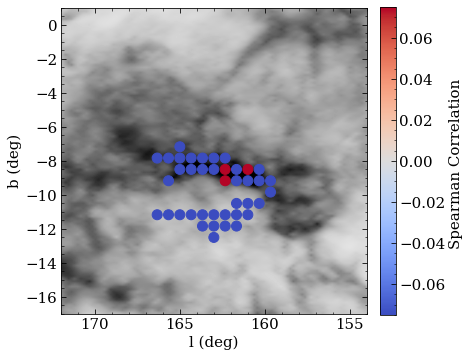

In [ ]:
from scipy.stats import spearmanr
start = 0
stop = None
def gradientmetric_deriv(array, dist):    
    a, b = np.meshgrid(array, array)
    c, d = np.meshgrid(dist, dist)
    grad_matrix = np.triu(b - a)
    deltadist = np.triu(d - c)
    nz = grad_matrix != 0
    grad_matrix[nz] = grad_matrix[nz] / deltadist[nz]
    shape = grad_matrix.shape[0]
    return np.sum(grad_matrix) / (0.5 * shape * (shape - 1))

sl_metrics = np.zeros(len(sightlines))
sl_spearman = np.zeros((len(sightlines), 2))

# sl_spearman_samples = np.zeros((len(sightlines), 2))


v_all = np.array([], dtype = float)
verr_all = np.array([], dtype = float)
d_all = np.array([], dtype = float)
l_sightline = np.array([], dtype = float)
sl_counts = np.zeros(len(sightlines))
median_velo_sightline = np.zeros(len(sightlines))

v_samp = []

velocity_samples_all = np.array([])
distance_samples_all = np.array([])

vperc16_all = np.array([], dtype = float)
vperc84_all = np.array([], dtype = float)

spearman_stats_sampledraw = np.zeros((20 * len(sightlines), 2))


for i in range(len(sightlines)):
    sl_i = sightlines[i]
    ndim = len(sl_i.voxel_dAVdd)
    # walker_max = sl_i.sampler.chain.shape[1]
    # min_walker_val = walker_max - 100
    samples = chains[i][-100:, :, :].reshape((-1, chains[i].shape[-1]))
    medians = np.nanmedian(samples[min_walker_val:, :], axis = 0)
    stdevs = np.nanstd(samples[min_walker_val:, :], ddof = 1, axis = 0)
    perc16= np.percentile(samples[min_walker_val:, :], 16, axis = 0)
    perc84 = np.percentile(samples[min_walker_val:, :], 16, axis = 0)

    med_velo = medians[:ndim]
    std_velo = stdevs[:ndim]
    perc16_velo = perc16[:ndim]
    perc84_velo = perc84[:ndim]
    bin_dist = sl_i.bins[1:]
    vperc16_all = np.concatenate([vperc16_all, perc16_velo])
    vperc84_all = np.concatenate([vperc84_all, perc84_velo])

    select_cloud = bin_dist > 401

    median_velo_sightline[i] = np.nanmedian(samples[:, :ndim])

    metric = np.sum(gradientmetric_deriv(med_velo[select_cloud], bin_dist[select_cloud]))
    sl_metrics[i] = metric

    spearman_correlation = spearmanr(bin_dist[select_cloud], med_velo[select_cloud])
    sl_spearman[i, 0] = spearman_correlation.correlation
    sl_spearman[i, 1] = spearman_correlation.pvalue

    v_all = np.concatenate([v_all,med_velo])
    verr_all = np.concatenate([verr_all, std_velo]) 
    d_all = np.concatenate([d_all, bin_dist])

    l_sightline = np.concatenate([l_sightline, l_sample[i] * np.ones(len(med_velo))])
    sl_counts[i] = len(med_velo)
    
    velocity_samples = (samples[:, :ndim])
    distance_samples = (np.ones(velocity_samples.shape) * bin_dist)
    # select_cloud_samples = distance_samples > 401
    # spearman_samples = spearmanr(distance_samples[select_cloud_samples].flatten(), velocity_samples[select_cloud_samples].flatten(),)
    # sl_spearman_samples[i, 0] = spearman_samples.correlation
    # sl_spearman_samples[i, 1] = spearman_samples.pvalue
    
    # distance_samples_all = np.concatenate([distance_samples_all, distance_samples.flatten()])
    # velocity_samples_all = np.concatenate([velocity_samples_all, velocity_samples.flatten()])
    
    
    v_samp.append(velocity_samples)

    for j in range(20):
        idx = np.random.choice(samples.shape[0], size = 100)
        select_cloud_walkers = bin_dist > 401
        draws= np.array([np.random.choice(velocity_samples[:, k]) for k in range(velocity_samples.shape[1])])
        spearman_samples = spearmanr(bin_dist[select_cloud_walkers], draws[select_cloud_walkers],)
        spearman_stats_sampledraw[i*20 + j, 0] = spearman_samples.correlation
        spearman_stats_sampledraw[i*20 + j, 1] = spearman_samples.pvalue


fig, ax = plt.subplots(figsize = (6,6))
im = ax.imshow(np.nansum(dust_data.dustmap, axis = 2), origin = 'lower', cmap = 'binary', vmin = 0, vmax = 3, extent = (dust_data.l0-9, dust_data.l0+9, dust_data.b0-9, dust_data.b0+9))
points = ax.scatter(l_sample[:len(sightlines)], b_sample[:len(sightlines)], c = sl_spearman[:, 0], s= 100, vmin = -0.075, vmax = 0.075, cmap = 'coolwarm')
ax.set_xlabel('l (deg)')
ax.set_ylabel('b (deg)')
xmin, xmax = ax.get_xlim()
ax.set_xlim(xmax, xmin)
# fig.colorbar(im, label = "A(V)")
fig.colorbar(points, label = 'Spearman Correlation ',fraction=0.046, pad=0.04)
plt.show()

# fig, ax = plt.subplots(figsize = (6,6))
# im = ax.imshow(np.nansum(dust_data.dustmap, axis = 2), origin = 'lower', cmap = 'binary', vmin = 0, vmax = 3, extent = (dust_data.l0-9, dust_data.l0+9, dust_data.b0-9, dust_data.b0+9))
# points = ax.scatter(l_sample[:len(sightlines)], b_sample[:len(sightlines)], c = sl_spearman_samples[:, 0], s= 100 * (1-sl_spearman_samples[:, 1]), vmin = -0.075, vmax = 0.075, cmap = 'coolwarm')
# ax.set_xlabel('l (deg)')
# ax.set_ylabel('b (deg)')
# xmin, xmax = ax.get_xlim()
# ax.set_xlim(xmax, xmin)
# # fig.colorbar(im, label = "A(V)")
# fig.colorbar(points, label = 'Spearman Correlation ')
# plt.show()

# sl_spearman.astype(np.float16)
# fig, ax = plt.subplots()
# fil = np.nansum(crit_filament)
# fil_idx = np.sum(sl_counts[:fil]).astype(int)

# ax.errorbar(d_all[:], v_all[:], yerr = verr_all[:], fmt = '.', capsize = 4, color = 'grey')

# points = ax.scatter(d_all[:], v_all[:], c = l_sightline[:], zorder = 5, )

# ax.set_xlim(380, 600)
# ax.set_xlabel('Distance (pc)')
# ax.set_ylabel('Velocity (km/s)')
# fig.colorbar(points, label = 'l (deg)')
# plt.show()

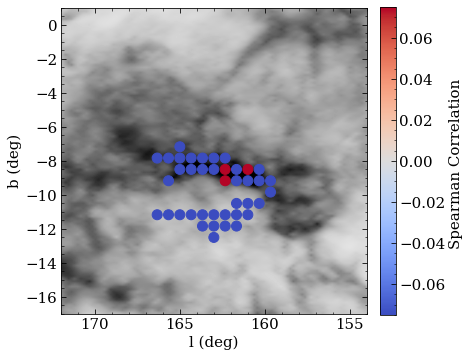

In [ ]:
fig, ax = plt.subplots(figsize = (6,6))
im = ax.imshow(np.nansum(dust_data.dustmap, axis = 2), origin = 'lower', cmap = 'binary', vmin = 0, vmax = 3, extent = (dust_data.l0-9, dust_data.l0+9, dust_data.b0-9, dust_data.b0+9))
points = ax.scatter(l_sample[:len(sightlines)], b_sample[:len(sightlines)], c = sl_spearman[:, 0], s= 100, vmin = -0.075, vmax = 0.075, cmap = 'coolwarm')
ax.set_xlabel('l (deg)')
ax.set_ylabel('b (deg)')
xmin, xmax = ax.get_xlim()
ax.set_xlim(xmax, xmin)
# fig.colorbar(im, label = "A(V)")
fig.colorbar(points, label = 'Spearman Correlation ',fraction=0.046, pad=0.04)
plt.show()


In [ ]:
chains[i].shape

(1500, 500, 36)

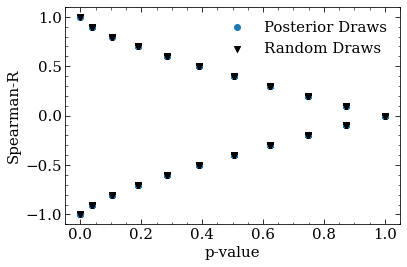

In [ ]:

spearman_random_draw = np.zeros((20 * len(sightlines), 2))
for i in range(20 * len(sightlines)):
    random_y = 20 * (np.random.random(5) - 10)
    random_x = np.linspace(400, 60, 5) + 10 * (np.random.random(5) - 5)
    spearman_random = spearmanr(random_x, random_y)
    spearman_random_draw[i, 0] = spearman_random.correlation
    spearman_random_draw[i, 1] = spearman_random.pvalue

fig, ax = plt.subplots()
ax.scatter(spearman_stats_sampledraw[:, 1], spearman_stats_sampledraw[:, 0], marker = 'o', color = 'C0', label = 'Posterior Draws')
ax.scatter(spearman_random_draw[:, 1], spearman_random_draw[:, 0], marker = 'v', label = 'Random Draws', color = 'k')
ax.set_xlabel('p-value')
ax.set_ylabel('Spearman-R')
ax.legend()
plt.show()


In [ ]:
v_for_plot = [] 
s_for_plot = []
for i in range(len(velocity_range)):
    for j in range(len(scale_range)):
        v_for_plot.append((velocity_range[i]))
        s_for_plot.append(scale_range[j])

In [ ]:
len(sl_spearman)

40

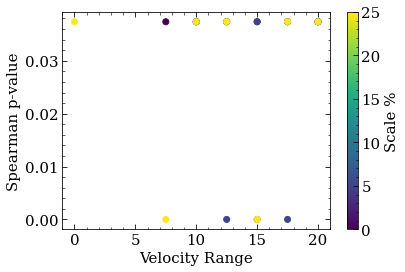

In [ ]:
fig, ax  = plt.subplots()
points = ax.scatter(v_for_plot, sl_spearman[:-4, 1], c = s_for_plot)
ax.set_xlabel('Velocity Range')
ax.set_ylabel('Spearman p-value')
fig.colorbar(points, label = 'Scale %')
plt.show()

In [ ]:
len(sl_spearman[:-4, 1])
len(sl_spearman[:-4, 1]< 0.05)

36

[ 0.   0.   0.   0.   2.5  2.5  2.5  2.5  5.   5.   5.   5.   7.5  7.5
  7.5  7.5 10.  10.  10.  10.  12.5 12.5 12.5 12.5 15.  15.  15.  15.
 17.5 17.5 17.5 17.5 20.  20.  20.  20. ]
[ 0  5 10 25  0  5 10 25  0  5 10 25  0  5 10 25  0  5 10 25  0  5 10 25
  0  5 10 25  0  5 10 25  0  5 10 25]


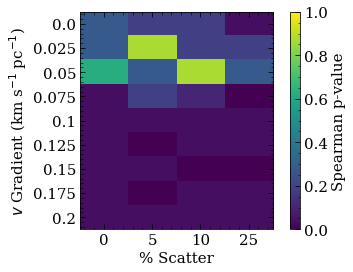

In [ ]:
vv, ss = np.meshgrid(velocity_range, scale_range)
vv = vv.T.flatten()
ss = ss.T.flatten()
print(vv)
print(ss)

image_data = sl_spearman[:-4,1].reshape(len(velocity_range),len(scale_range))
# image_data[image_data > 0.05] = np.nan

fig, ax = plt.subplots()
im = ax.imshow(image_data, cmap = 'viridis', aspect = 0.5, vmin = 0, vmax = 1)
ax.set_xlabel(r'% Scatter')
ax.set_ylabel('$v$ Gradient (km s$^{-1}$ pc$^{-1}$)')
ax.set_xticks([0, 1, 2, 3])
ax.set_yticks([0, 1, 2 ,3, 4, 5, 6, 7, 8])
ax.set_xticklabels(scale_range)
ax.set_yticklabels(2 * np.concatenate([velocity_range]) / 200)
# ax.set_xticks(velocity_range)
# ax.set_yticks(scale_range)
fig.colorbar(im, label = 'Spearman p-value')
fig.set_facecolor('white')
plt.show()